* Student name: Shayan Abdul Karim Khan
* Student pace: Self Paced
* Scheduled project review date/time: July 21st 2023
* Instructor name: Abhineet Kulkarni

## Summary

A recommendation system was built for a startup looking to start a quarterly book subscribtion business. Thiss notebook needs to provide a solution for 3 Scenarios;  1.Current User, 2.New User with user demmographic information available, 3.New user with no information available. The data was obtained from the Book-Crossing Community and Google Books API, cleaned for outliers and then further processed using different packagess, including pandas, numpy, sci-kit learn and pycountry. The data was filtered for US users and books with number of ratings greater than 19 aand page count less than 300. TF-IDF and NLP was also used to bin approximately 11,000 unique book genres/categories into 10 common bins. The data was used to train models and build a recommendation system t odepict real life users and books which would act as an MVP model for the company to staart acquiring users.  KNN, SVD and NMF algorithms were tested for a rating prediction model and compared based on differet metrics. RMSE was chosen as the main metric for comparison through which SVD was chosen as the final model. The final model was used in conjunction with Hybrid Collaborative Filtering, User Collaboraatiive Filtering and Cold Start approaches to tackle the 3 scenarios respectively.

## Problem Overview

A startup is planning on launching a books care package subscription system. As a part of the subscription system, the user will be paying a monthly fees and will have 5 books delivered quarterly. These books will be lent out to the user for 6 months to read and then return. The user will have the option to return whichever books they do not intend to keep within 7 days of receiving the care package. Higher number of returns will lead to low user statisfaction, higher costs and low customer retention rates. While it is expected to be a rarity that the user will keep all 5 books because of how long it takes someone to finish a book. Nonetheless, it is important for all 5 books to peak the customer's interest so that returns are lowered. Therefore it is crucial to ensure that the books delivered match the customer's preferences otherwise returns can cause significant losses.

For this purpose, we have beeen hired to develop a recommendation system for the books that will be delivered to the customers. Because of the startup nature, we don't have a pool of data of current clients to use, but there are public datasets available that can mimic real life scenarios and can be used for the company to kik-off it's MVP and user validation phase.

The ask is to build a recommendation system to develop an advanced recommendation which takes into aaccount both user annd content based impacts. Since the publicly available datasets have anonymous user data, it is not the best use-case for the new customers that the startup will be acquiring. Therefore, it is important to incorporate a solution that can use bits and pieces of information about a new user to refer relevant books to them.

## Methodology

There are three scenrios that the recommendation system needs to be able to handle.

1. Recommending books for current users: This scenario involves a user who has either used the platform before or links their Google/Goodreads/Book Crossing/Amazon account which can be used to extract relevant user information about previous book reviews. It is important to recommend relevant books to these users since user retention will largely be based on the success of Scenario 1.
<br>


2. Recommending books for users without any prior information: This scenrio involves userss who have never used the platform before and do not link other social media profiles therefore other than their basic information, there won't be any informtion available about their book reading habits. Ideally, most new users will land in Scenario 2 where the marketting funnel has convinced them to subsccribe to the service but are hesitant to start paying. A few recommendations might peak their interest and nudge them to subsribe.
<br>

3. Recommending books to completely new users: This involved users who would be trying out the platform and might not be interested in answering a couple of questions about their personal information and likes/dislikes. While these users are important, it is a lot more difficult to convert them into regulra users. 

For Scenario 1, the plan is to use the publicly available dataset from the widely popular Book-Crossing Community about user reviews and use the plethora of information available using the Google Books API on the books in the Book-Crossing dataset to develop user and book profiles, i.e. Clusters Labels. These labels will become an additional input into the models and recommendation system. a Hybrid Collaborative approach will be used to identify the books and users most similar and the models will be used to predict the average rating for the books that users have not reviewed. 

For Scenario 2, the user cluster labels will be used to identify certain featuress of users that might be missing because of no aaccess to previous reading history. Then the model will predict the ratings for books for the user and the Hybrid Collaborative model will be used to recommend books. Therefore, the data will start off with averages for certain user features and then as the user provides real time feedback to the app, it will be updated.

For Scenario 3, a cold start solution will be created that will require user input for explicit data and place them in one of the predetermined user cluster. This cluster will be used to populate certain missing features and predictions will be made accordingly. Then the hybrid colllaborative aapproach will be used to recommend books.


Nonetheless, Since we are using public data to build models and clusters, we need to be mindful that as aactual customer data is extracted, the prediction system is iterated in the furture for updates accordingly.

Therefore, the publicly available dataset is being used to generate baseline clusters that can be used to categorize new users and predict their ratings to generate relevant recommendations. This will also create a good foundation for easilly incorporating user feedback, new reviews and new data into the current dataset to update it as needed.

Since, the basis of ranking the top 5 books will be the predicted ratings, it is important that the prediction models have high aaccuracy.

## Data Sources

The following dataset is used to create a recommendation system. 
1. Ratings: https://www.kaggle.com/datasets/arashnic/book-recommendation-dataset?select=Ratings.csv 
2. Books: https://www.kaggle.com/datasets/arashnic/book-recommendation-dataset?select=Books.csv 
3. Users: https://www.kaggle.com/datasets/arashnic/book-recommendation-dataset?select=Users.csv 

This dataset contains data on more than 200,000 users with demographic information and collected from the reputable Book-Crossing community. It has also been cleaned to a certain extent which gives us leverage to focus more on the modelling part. This dataset contains features that are readilly available and will not make it extremely difficult for the company to expand the dataset. 

The books dataset is further expanded using the Google Books API: https://developers.google.com/books

Multiple features will be extracted from Google Books and merged with the Books dataset to add further granular data to it and improve clustering attempts.

## Data Understanding and Data Cleaning

The Book-Crossing dataset comprises 3 files.

* Books

Books are identified by their respective ISBN. Invalid ISBNs have already been removed from the dataset. Moreover, some content-based information is given (`Book-Title`, `Book-Author`, `Year-Of-Publication`, `Publisher`), obtained from Amazon Web Services. Note that in case of several authors, only the first is provided. URLs linking to cover images are also given, appearing in three different flavours (`Image-URL-S`, `Image-URL-M`, `Image-URL-L`), i.e., small, medium, large. These URLs point to the Amazon web site.
<br>

* Ratings

Contains the book rating information. Ratings (`Book-Rating`) are either explicit, expressed on a scale from 1-10 (higher values denoting higher appreciation), or implicit, expressed by 0.
<br>

* Users

Contains the users. Note that user IDs (`User-ID`) have been anonymized and map to integers. Demographic data is provided (`Location`, `Age`) if available. Otherwise, these fields contain NULL-values.

Below is a repeat of the initial cleaning and data understanding that was performed for the basic recommendation system which was linked earlier. After the basic cleaning is done, the filters that were used for the basic recommendation system will be applied. The final dataset obtained will be used to extract the book information from Google Books API.

In [217]:
# Import necessary libraries
import pandas as pd
import numpy as np
from datetime import datetime
from tqdm import tqdm
import pickle as pkl
import matplotlib.pyplot as plt
import seaborn as sns

from plotly import express as px
import plotly.subplots as sp

import requests
import warnings


from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import OneHotEncoder as ohe
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

from sklearn.cluster import KMeans
from sklearn import model_selection
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

from sklearn.metrics.pairwise import cosine_similarity

from sklearn.decomposition import PCA


import pycountry


from surprise import Dataset, Reader
from surprise import SVD, NMF, KNNBasic, KNNWithMeans, KNNWithZScore, KNNBaseline
from surprise import accuracy
from surprise.model_selection import train_test_split
 
from imblearn.under_sampling import RandomUnderSampler

# Filter warnings
warnings.simplefilter(action='ignore', category=(UserWarning, FutureWarning))

### Books

First load the dataset and preview the dataset.

In [218]:
#load the dataset into a pandas dataframe
books = pd.read_csv("data/Books.csv")

#preview the dataset
books.head()

/var/folders/qv/0z2v23tn1f1b2fnpqqgqsxch0000gn/T/ipykernel_87298/3637232235.py:2: DtypeWarning:

Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.



,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...


The ISBN is the unique identifier for every book but for recommendations. We will use ISBNs through out as signifying a book. When recommendaations aare generated, the ISBN will be cross referenced with the original books dataset to extract the title to recommend to users. Considering that book titles and information for books are extracted from Amazon's database, there is hiigh confidence that they are correct. 

Image URLs won't be useful for analysis so it can be dropped. Year of Publication and Publisher are also unique charaacteristics to explore in the Exploratory Data Analysis section to understand populraity of individul data points.

First, lets look at the info of the books dataframe to understand the characteristics of the dataset.

In [219]:
#look at the info
books.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271360 entries, 0 to 271359
Data columns (total 8 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   ISBN                 271360 non-null  object
 1   Book-Title           271360 non-null  object
 2   Book-Author          271359 non-null  object
 3   Year-Of-Publication  271360 non-null  object
 4   Publisher            271358 non-null  object
 5   Image-URL-S          271360 non-null  object
 6   Image-URL-M          271360 non-null  object
 7   Image-URL-L          271357 non-null  object
dtypes: object(8)
memory usage: 16.6+ MB


In [220]:
#check number of missing values
books.isnull().sum()

ISBN                   0
Book-Title             0
Book-Author            1
Year-Of-Publication    0
Publisher              2
Image-URL-S            0
Image-URL-M            0
Image-URL-L            3
dtype: int64

There are very few missing values in the relevant columns. 2 in the Publisher column and 1 in the Book Author column. Considering that there are more than 250,000+ records, dropping the rows with missing data won't impact the data.

All of the columns are stored as strings. Year of Publication is also stored as a string. This will need to be changed to datetime format for proper analysis later.

In [221]:
#drop the Image URL columns
books.drop(["Image-URL-S","Image-URL-M","Image-URL-L"],axis = 1,inplace = True)

#drop the records with missing values
books.dropna(inplace = True)

#check info for the new dataset
books.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 271357 entries, 0 to 271359
Data columns (total 5 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   ISBN                 271357 non-null  object
 1   Book-Title           271357 non-null  object
 2   Book-Author          271357 non-null  object
 3   Year-Of-Publication  271357 non-null  object
 4   Publisher            271357 non-null  object
dtypes: object(5)
memory usage: 12.4+ MB


Next, explore the year of publication before it is transformed to datetime format. We will cross-check whether the values stored in here are valid.

In [222]:
#check unique values for year of publication
books["Year-Of-Publication"].unique()

array([2002, 2001, 1991, 1999, 2000, 1993, 1996, 1988, 2004, 1998, 1994,
       2003, 1997, 1983, 1979, 1995, 1982, 1985, 1992, 1986, 1978, 1980,
       1952, 1987, 1990, 1981, 1989, 1984, 0, 1968, 1961, 1958, 1974,
       1976, 1971, 1977, 1975, 1965, 1941, 1970, 1962, 1973, 1972, 1960,
       1966, 1920, 1956, 1959, 1953, 1951, 1942, 1963, 1964, 1969, 1954,
       1950, 1967, 2005, 1957, 1940, 1937, 1955, 1946, 1936, 1930, 2011,
       1925, 1948, 1943, 1947, 1945, 1923, 2020, 1939, 1926, 1938, 2030,
       1911, 1904, 1949, 1932, 1928, 1929, 1927, 1931, 1914, 2050, 1934,
       1910, 1933, 1902, 1924, 1921, 1900, 2038, 2026, 1944, 1917, 1901,
       2010, 1908, 1906, 1935, 1806, 2021, '2000', '1995', '1999', '2004',
       '2003', '1990', '1994', '1986', '1989', '2002', '1981', '1993',
       '1983', '1982', '1976', '1991', '1977', '1998', '1992', '1996',
       '0', '1997', '2001', '1974', '1968', '1987', '1984', '1988',
       '1963', '1956', '1970', '1985', '1978', '1973', '1980'

There are two unique values that don't fit in the year of publication column. The wrong vaalues are DK Publishing Inc and Gallimard. 

These values look like names of publishers. Considering that records with missing values have been dropped, this means that these records already have values for all the other columns therefore it will be best to drop these records.

We also see some outlier values like 1376, 2037 and more. We will limit the range of data that we take forward to ensure that the data we make recommendations on is valid and has books that are both relevant for today's society and easilly available. The year limitations will be 1800 to 2024. This also ensures that the books recommended are readilly available to be provided to the customer.

In [223]:
#remove values of publishing names
remove_value = ["DK Publishing Inc","Gallimard"]
books        = books[~books["Year-Of-Publication"].isin(remove_value)]

#cnveert to int type
books["Year-Of-Publication"] = books["Year-Of-Publication"].astype(int)

#filter the years
books = books[ books["Year-Of-Publication"] > 1800]
books = books[ books["Year-Of-Publication"] < 2024]

In [224]:
#convert to year format
books['Year-Of-Publication'] = pd.to_datetime(books['Year-Of-Publication'], format='%Y').dt.year

In [225]:
books["Year-Of-Publication"].unique()

array([2002, 2001, 1991, 1999, 2000, 1993, 1996, 1988, 2004, 1998, 1994,
       2003, 1997, 1983, 1979, 1995, 1982, 1985, 1992, 1986, 1978, 1980,
       1952, 1987, 1990, 1981, 1989, 1984, 1968, 1961, 1958, 1974, 1976,
       1971, 1977, 1975, 1965, 1941, 1970, 1962, 1973, 1972, 1960, 1966,
       1920, 1956, 1959, 1953, 1951, 1942, 1963, 1964, 1969, 1954, 1950,
       1967, 2005, 1957, 1940, 1937, 1955, 1946, 1936, 1930, 2011, 1925,
       1948, 1943, 1947, 1945, 1923, 2020, 1939, 1926, 1938, 1911, 1904,
       1949, 1932, 1928, 1929, 1927, 1931, 1914, 1934, 1910, 1933, 1902,
       1924, 1921, 1900, 1944, 1917, 1901, 2010, 1908, 1906, 1935, 1806,
       2021, 2012, 2006, 1909, 2008, 1919, 1922, 1897])

In [226]:
#check the info of the new dataset
books.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 266721 entries, 0 to 271359
Data columns (total 5 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   ISBN                 266721 non-null  object
 1   Book-Title           266721 non-null  object
 2   Book-Author          266721 non-null  object
 3   Year-Of-Publication  266721 non-null  int64 
 4   Publisher            266721 non-null  object
dtypes: int64(1), object(4)
memory usage: 12.2+ MB


In [227]:
#check for null values
books.isnull().sum()

ISBN                   0
Book-Title             0
Book-Author            0
Year-Of-Publication    0
Publisher              0
dtype: int64

With the initial data cleaning done, lets do a final check to see if there are any duplicate records

In [228]:
books.duplicated().sum()

0

With the Books Dataset initial Data understanding and cleaning finished, we can move on to importing more feaatures for these books from the Google Books API. 

### Google Books API Dataset

The Google Books API data iis extracted using the code that can be found in the file: 

This data is imported and cleaned below before further processing is done.

In [229]:
#import google books api dataset
book_df = pd.read_csv('book_api_df.csv')

In [230]:
#check info
book_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 217306 entries, 0 to 217305
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   ISBN            217306 non-null  object 
 1   title           217306 non-null  object 
 2   authors         214401 non-null  object 
 3   publishedDate   217154 non-null  object 
 4   language        217306 non-null  object 
 5   pageCount       215358 non-null  float64
 6   averageRating   82023 non-null   float64
 7   ratingsCount    82023 non-null   float64
 8   maturityRating  217306 non-null  object 
 9   categories      197026 non-null  object 
dtypes: float64(3), object(7)
memory usage: 16.6+ MB


As compared to the full dataset, there are a lot of missing values for average ratings and ratings Count. 

Other than these two columns, the missing values are a very small percentage of the total dataset. We will check later on if there are any missing values that we can extract from the Book-Crossing Community dataset and impute those values in. Before we do any further processing of the dataset, letsdrop the records with missing valuess in the other columns.

In [231]:
#drop records with missing values
book_df.dropna(subset=['authors','publishedDate','language', 'pageCount', 
                       'maturityRating', 'categories'],inplace=True)

In [232]:
#check for missing values
book_df.isna().sum()

ISBN                   0
title                  0
authors                0
publishedDate          0
language               0
pageCount              0
averageRating     115873
ratingsCount      115873
maturityRating         0
categories             0
dtype: int64

We want ensure that the average ratings that we are using are the stabilized ratings for these books. This usually happens after a certain number of reviews have been received for a book. This is ensure that outliers won't significantly impact the average rating of a book.

We can do “CI” calculations systematically for a large number of books at a fixed level of confidence: 95%. What this means is, that we can expect the “true” ratings for the books (after thousands of further ratings) to still lie within those earlier Confidence Intervals in 95% of cases.

We can run a bootstrap method to see which number of ratings will work. We will run the maximum number of ratings in the bins in the ggraph up there to see how they will perform and how wide spread the confidence interval can be.

We did this previously or the basic recommendation system we developed and found that 19 reviews were the minimum we wanted to go with. Lets check how many books we have in this dataset with more than 19 reviews.

In [233]:
#check for more thana 19 reviews
(book_df.ratingsCount > 19).sum()

8237

These are very few books. We will use the ratings from the Book-Cross Community to fill in for all the ISBNs and take a new average. For now, lets explore the other features.

Some of the columns are similar to the dataset attained from the Book Crossing Community. We will use the Google Books Data whereever the two daatasets have common features. Therefore, the only relevant column that we can bring over from the books dataaset is the publisher. Also there are some new features that will be valuable for analysis. We will go through them but first lets lean the published daate column so that we only keep the years.

While publishers are important information about a book, it can make things more granular than required. As the recommendation system is further built upon, publisher information can be added to refine the clusters even more. Therefore we won't merge the publisher column from the original books dataset.

In [234]:
#preview data
book_df.head()

,ISBN,title,authors,publishedDate,language,pageCount,averageRating,ratingsCount,maturityRating,categories
0,1556613326,Silent Witness,['Patricia H. Rushford'],1993,en,180.0,NaN,NaN,NOT_MATURE,"[""Children's stories""]"
1,0394539281,Museum Pieces,['Elizabeth Tallent'],1985,en,258.0,NaN,NaN,NOT_MATURE,['Archaeologists']
2,0449909077,The Longings of Women,['Marge Piercy'],1994,en,472.0,4.0,3.0,NOT_MATURE,['Boston (Mass.)']
3,0843937572,Jackie O.,['Hedda Lyons Watney'],1993-11-01,en,411.0,NaN,NaN,NOT_MATURE,['Biography & Autobiography']
4,0765307227,Tales of the Grand Tour,['Ben Bova'],2004,en,383.0,2.0,1.0,NOT_MATURE,['Fiction']


publishedDate is in string format and for some records there is only year some has month and year and some has date. Common things was that all data has year at the end of value so last 4 character extracted and converted to numerical data. This field is extractedand filtered for books that are currently available in the market readilly. Books published after 1800 and before 2023 will be used for clustering.

In [235]:
# Extracting the first 4 characters from the 'publishedDate' column to get the year
book_df.publishedDate = book_df.publishedDate.str[:4]

# Removing non-numeric characters from the 'publishedDate' column
book_df.publishedDate = book_df.publishedDate.str.replace(r'[^0-9]', '')

# Converting the 'publishedDate' column to integer data type
book_df.publishedDate = book_df.publishedDate.astype(int)

# Filtering the DataFrame to include only rows with 'publishedDate' between 1800 and 2022
book_df = book_df[(book_df.publishedDate > 1800) & (book_df.publishedDate < 2023)]

# Fetching the unique values in the 'publishedDate' column
book_df.publishedDate.unique()

array([1993, 1985, 1994, 2004, 2001, 1990, 1991, 1999, 1975, 1992, 1997,
       2002, 1986, 1984, 1949, 1995, 1998, 1989, 2003, 1988, 1983, 1996,
       1981, 2000, 1980, 1987, 1976, 1974, 2009, 1978, 1979, 1982, 1970,
       2013, 1977, 1973, 1969, 1966, 2016, 1972, 2010, 2011, 2006, 1971,
       1964, 1961, 1959, 1967, 1955, 1950, 1965, 1958, 1960, 2005, 2007,
       2017, 1951, 1929, 1940, 1935, 1968, 1952, 1963, 1923, 1962, 1956,
       2015, 1911, 1941, 1942, 2019, 2021, 1946, 1954, 1953, 1938, 1930,
       2008, 2018, 2012, 1927, 1937, 1907, 1957, 1948, 1936, 1932, 1931,
       1944, 1947, 1939, 1913, 1915, 1865, 1866, 1920, 1933, 1884, 1877,
       1922, 1945, 1897, 1912, 2020, 1910, 1919, 1895, 1943, 1925, 1868,
       1888, 1901, 1917, 1886, 1928, 1924, 1908, 1903, 2014, 1860, 1887,
       1926, 1905, 1833, 1934, 1900, 1893, 1899, 1921, 1885, 1890, 1880,
       1892, 1882, 2022, 1889, 1909, 1906, 1867, 1902, 1883, 1914, 1904])

In [236]:
#check info
book_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 193723 entries, 0 to 217305
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   ISBN            193723 non-null  object 
 1   title           193723 non-null  object 
 2   authors         193723 non-null  object 
 3   publishedDate   193723 non-null  int64  
 4   language        193723 non-null  object 
 5   pageCount       193723 non-null  float64
 6   averageRating   77866 non-null   float64
 7   ratingsCount    77866 non-null   float64
 8   maturityRating  193723 non-null  object 
 9   categories      193723 non-null  object 
dtypes: float64(3), int64(1), object(6)
memory usage: 16.3+ MB


Now lets check the distribution of the language column and see how many unique languages does our dataseet comprise of.

In [237]:
#check value counts
book_df.language.value_counts(normalize=True).head(10)

en       0.944627
es       0.019022
de       0.017097
fr       0.013566
it       0.002968
ca       0.000759
pt-BR    0.000635
nl       0.000563
pl       0.000088
ms       0.000072
Name: language, dtype: float64

Looks like almost 95% of the books in the dataset are in english. Considering that, we will only focus on english books. Considering english is the most dominanat aand popular language in the woorld, it maakes sense for aaa startup to focus on the most amount of customers rather than aa very specific niche for which daata will be hard to obtain. With English, it will also be easier for the company to expand into other markets since english books are read in most countrie and continents.

In [238]:
#filter for the english
book_df = book_df[book_df.language == 'en']

#drop the language column
book_df = book_df.drop('language', axis=1)

Next up, lets check the page counts to see if there is any outlier data. We can visualize this using a scatter plot.

In [239]:
#plot page counts
px.scatter(book_df.pageCount)

Most of the books have less than 5000 pages. There are 2 outlier books with more than 15000 pages. Lets zopom in more for books with less than 5000 paage counts to check their distribution.

In [240]:
#plot page counts < 5000
px.scatter(book_df[book_df.pageCount < 5000].pageCount)

Looks like most books have less thaan 1000 pages. Lets calculate the percentage distribution.

In [241]:
#calculate totaal length of records
totRec = len(book_df)

#print outputs
print('Percentage of books with more than 1000 pages: ', 
      (len((book_df[book_df.pageCount >= 1000].pageCount))*100)/totRec)

print('Percentage of books with more than 500 pages but less than 1000 pages: ', 
      (len((book_df[(book_df.pageCount > 500)&(book_df.pageCount < 1000)].pageCount))*100)/totRec)

print('Percentage of books with less than 500 pages: ', 
      (len((book_df[(book_df.pageCount <= 500)].pageCount))*100)/totRec)

Percentage of books with more than 1000 pages:  0.5513781722004852
Percentage of books with more than 500 pages but less than 1000 pages:  6.646046908129139
Percentage of books with less than 500 pages:  92.80257491967038


Consedering that almost 93% of the books have less than 500 pages, we will focus on these books. These kinds of books also sound reasonably long and would be very difficult to finish multiples of in a quarter. Therefore this will make the return rate higher every quaarter and reduce the revenue of the company. Lets try and cut this down even further to 300 books which can be a reasonable length of books. If a reader chooses too read only 9 pages a day, they can easilly finish 3 books of 300 pages in a quarter. This will eventually help with getting mre people to read mre books. This recommendation system can be further improved overtime once aa laarage customer base staarts finishing books a lot earlier than the next delivery of books. Lets check to see how many percentage of the total records we will be taking forward with 300 paage books.

In [242]:
#print percentage
print('Percentage of books with less than 300 pages: ', 
      (len((book_df[(book_df.pageCount <= 300)].pageCount))*100)/totRec)

Percentage of books with less than 300 pages:  64.4500426238825


In [243]:
#filter for 300 page books
book_df = book_df[book_df.pageCount <= 300]

#check info
book_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 117941 entries, 0 to 217305
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   ISBN            117941 non-null  object 
 1   title           117941 non-null  object 
 2   authors         117941 non-null  object 
 3   publishedDate   117941 non-null  int64  
 4   pageCount       117941 non-null  float64
 5   averageRating   43218 non-null   float64
 6   ratingsCount    43218 non-null   float64
 7   maturityRating  117941 non-null  object 
 8   categories      117941 non-null  object 
dtypes: float64(3), int64(1), object(5)
memory usage: 9.0+ MB


Next, lets explore the average ratings and see their distributions.

In [244]:
#plot the average ratings
px.bar(book_df.groupby('averageRating').size())

On a scale of 1-5, looks like most of the books have average ratings that are left skewed and are either 3 or higher. This shows that most of the books in our dataset are well performing ones. The low ratings will be important to identify if there are any books that are explicitly categorized as bad but it might be possible that there are certain books that haave a lower average rating but are reaally liked by certain users. 

Lets also check the disitribution of maturity ratings to get an understanding of how evenly distributed it is.

In [245]:
#plot the average ratings
px.bar(book_df.groupby('maturityRating').size())

In [246]:
#check value counts
book_df.maturityRating.value_counts()

NOT_MATURE    117462
MATURE           479
Name: maturityRating, dtype: int64

There are very few books categorized as `MATURE` therefore we will filter to keep books that are `NOT_MATURE` and drop this column.

In [247]:
#filter for maturity rating
book_df = book_df[book_df.maturityRating == 'NOT_MATURE']

#drop column
book_df = book_df.drop('maturityRating', axis=1)

#check info
book_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 117462 entries, 0 to 217305
Data columns (total 8 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   ISBN           117462 non-null  object 
 1   title          117462 non-null  object 
 2   authors        117462 non-null  object 
 3   publishedDate  117462 non-null  int64  
 4   pageCount      117462 non-null  float64
 5   averageRating  43000 non-null   float64
 6   ratingsCount   43000 non-null   float64
 7   categories     117462 non-null  object 
dtypes: float64(3), int64(1), object(4)
memory usage: 8.1+ MB


Next, Lets check all the unique categories or genres of books that are in this dataset.

In [248]:
#check lenngth of unqique values
len(book_df.categories.unique())

11527

In [249]:
# Extract unique values as a list
unique_categories = book_df['categories'].unique()

# Convert the list of unique values to a list of strings without brackets
unique_categories_string = [(category)[2:-2] for category in unique_categories]

# Print the result
print(unique_categories_string)


["Children's stories", 'Archaeologists', 'Biography & Autobiography', 'Juvenile Fiction', 'Study Aids', 'Mexico', 'Education', 'Friendship', 'Fiction', 'Detective and mystery stories, American', 'Salvation', 'Lao-tzu', 'Peace', 'Sociology', 'English language', 'Astrophysics', 'Big bands', 'Accident victims', 'Asheville (N.C.)', 'Domestic fiction', 'Dungeons and Dragons (Game)', 'Religion', 'Biographical poetry', 'Love stories', 'Fairy tales', 'England', 'Comic books, strips, etc', 'Christian life', 'Fantasy fiction', 'Irish', 'Dog owners', 'English literature', 'Finance, Personal', 'Consumer credit', 'Electronic mail messages', 'Authors, American', 'Body, Mind & Spirit', 'Bicycles', 'Rock musicians', 'Christian fiction, American', 'Adultery', 'Business & Economics', 'Medical examiners (Law)', 'History', 'Adrenaline', 'Arkansas', 'Childbirth', 'Travel', 'New Zealand', 'Horror tales', 'Municipal ownership', 'Spanish language', 'Cousins', 'Love in motion pictures', 'Dog breeds', 'Deaf', '

More than 11,000 unique values is a lot! Also as we read through the above output we caan see that there aare several overlaappiinng categories. It will be very tedious and time consuming to go throough these labels one by one and group them accordingly.

We will have to reduce these to make it simpler to use these in clustering and modelling. Using greater than 11,000 categoricaal laabels willl make the process very expensive. Instead, we can use TF-IDF Vectorization to use NLP principless to find ccommona;ities in these different caategories and find 10 main clusters.

In [250]:
# Unique genre labels
unique_values = unique_categories_string

# Create TF-IDF vectorizer
vectorizer = TfidfVectorizer(lowercase=True, stop_words='english')

# Apply TF-IDF on genre labels with tqdm progress bar
with tqdm(total=len(unique_values), desc='TF-IDF') as pbar:
    tfidf_matrix = vectorizer.fit_transform(unique_values)
    pbar.update()

# Compute pairwise cosine similarity with tqdm progress bar
with tqdm(total=tfidf_matrix.shape[0], desc='Cosine Similarity') as pbar:
    similarity_matrix = cosine_similarity(tfidf_matrix)
    pbar.update()

# Perform K-means clustering
num_clusters = 10
kmeans = KMeans(n_clusters=num_clusters, random_state=42)

# Fit K-means with tqdm progress bar
with tqdm(total=similarity_matrix.shape[0], desc='Clustering') as pbar:
    kmeans.fit(similarity_matrix)
    pbar.update()

# Get cluster labels
cluster_labels = kmeans.labels_

# Replace values in the "categories" column of book_df
book_df["categories"] = book_df["categories"].apply(lambda x: cluster_labels[unique_values.index(x.lower())] if x.lower() in unique_values else x)


Clustering:   0%|                          | 1/11527 [00:16<52:13:01, 16.31s/it]


In [251]:
# Convert cluster_labels to a pandas Series
cluster_labels_series = pd.Series(cluster_labels)

# Get the count of entries for each label
label_counts = cluster_labels_series.value_counts()

# Print the result
print(label_counts)

0    9555
2     660
3     255
1     225
4     217
6     154
7     148
9     147
8     118
5      48
dtype: int64


This tells that there were several unique categories that could be grouped together based on NLP principless into label 1 and 2 alongside the others.

In [252]:
# Create a dictionary mapping unique values to cluster labels
label_mapping = {value: label for value, label in zip(unique_values, cluster_labels)}

# Replace values in the "categories" column of book_df using the label mapping
book_df["categories"] = book_df["categories"].str[2:-2]  # Remove brackets from categories
book_df["categories"] = book_df["categories"].map(label_mapping)

# Print the updated DataFrame
print(book_df["categories"])

0         1
1         0
7         0
9         3
11        0
         ..
217296    0
217297    0
217299    0
217301    0
217305    3
Name: categories, Length: 117462, dtype: int32


In [253]:
#check the new value counts for categories
book_df["categories"].value_counts()

0    78631
3    29335
1     2739
4     2502
2     1568
7      895
6      615
8      528
5      390
9      259
Name: categories, dtype: int64

This is the total value countss of every cluster label in thee dataset.

This looks a lot better and allows us to proocess aand model the data without a huge amount of dimensions aand unlimited genres to worry about. Nonetheless, in an ideal scenario, all of these clusters would have a genre label that can be used to guage new user's preferences and can provide a lot mroe value. Nonetheless, it is a lot more time-consuming and expensive to go through 11,000 labels to bin them into specific categories.

In [254]:
#check info
book_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 117462 entries, 0 to 217305
Data columns (total 8 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   ISBN           117462 non-null  object 
 1   title          117462 non-null  object 
 2   authors        117462 non-null  object 
 3   publishedDate  117462 non-null  int64  
 4   pageCount      117462 non-null  float64
 5   averageRating  43000 non-null   float64
 6   ratingsCount   43000 non-null   float64
 7   categories     117462 non-null  int32  
dtypes: float64(3), int32(1), int64(1), object(3)
memory usage: 7.6+ MB


In [255]:
#check for null values
book_df.isna().sum()

ISBN                 0
title                0
authors              0
publishedDate        0
pageCount            0
averageRating    74462
ratingsCount     74462
categories           0
dtype: int64

The missing ratings and ratings count will be tackled with the Ratings dataset. Lets seck for duplicates.

In [256]:
#check for duplicates
book_df.duplicated().sum()

0

We can drop the title column for processing and clustering. We can make a copy before hand to use later for recommendations.

In [257]:
#make copy for later use containing the titles
book_df_titles = book_df.copy()

#drop titles
book_df = book_df.drop(['title'],axis=1)

In [258]:
book_df_titles.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 117462 entries, 0 to 217305
Data columns (total 8 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   ISBN           117462 non-null  object 
 1   title          117462 non-null  object 
 2   authors        117462 non-null  object 
 3   publishedDate  117462 non-null  int64  
 4   pageCount      117462 non-null  float64
 5   averageRating  43000 non-null   float64
 6   ratingsCount   43000 non-null   float64
 7   categories     117462 non-null  int32  
dtypes: float64(3), int32(1), int64(1), object(3)
memory usage: 7.6+ MB


### Ratings

Next we can look at the Ratings dataset.

In [259]:
#load the data
ratings = pd.read_csv("data/Ratings.csv")
#preview the data
ratings.head()

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


This dataset contains the user IDs of speific users and the ISBN of the book they rated. These ISBNs can be used to merge this data with the Books dataset.

It also contains the ratings that the user assigned to every book out of 10. This will be the most cruciaal piece of information for the recommendation system.

In [260]:
#check info of dataset
ratings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1149780 entries, 0 to 1149779
Data columns (total 3 columns):
 #   Column       Non-Null Count    Dtype 
---  ------       --------------    ----- 
 0   User-ID      1149780 non-null  int64 
 1   ISBN         1149780 non-null  object
 2   Book-Rating  1149780 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 26.3+ MB


Theere are no missing values and User ID and the rating columns are integer types which we would expect. Also, the ISBN column is an object column, same as the books dataset.

There are more than 1 million records, almost double the number of books we have. Although this is  large dataset, only double the number of the books dataset shows us that there might not be a lot of reviews per books. We will explore this further in the EDA section since we want to ensure that there is a minimum number of reviews per book to have confidence in the recommendations.

Lets explore the characteristics of the Ratings column.

In [261]:
#check statistics of the raatings column
ratings['Book-Rating'].describe()

count    1.149780e+06
mean     2.866950e+00
std      3.854184e+00
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      7.000000e+00
max      1.000000e+01
Name: Book-Rating, dtype: float64

The mean is only ~2.9 which is really low. The quartiles give us an indication of why that might be. 50% of the values are zero or less. Zero typically indicates that the user has not reviewed the relevant book. We will assume that the user has not read the book therefore a missing review. These values have to be separated and predicted on according to the final model.  

In order to not have these zero values impact EDA, we will change these values to NaN values.

In [262]:
# Replace zeros with NaN in column 'A'
ratings['Book-Rating'] = ratings['Book-Rating'].replace(0, np.nan)

#preview the dataset
ratings

,User-ID,ISBN,Book-Rating
0,276725,034545104X,NaN
1,276726,0155061224,5.0
2,276727,0446520802,NaN
3,276729,052165615X,3.0
4,276729,0521795028,6.0
...,...,...,...
1149775,276704,1563526298,9.0
1149776,276706,0679447156,NaN
1149777,276709,0515107662,10.0
1149778,276721,0590442449,10.0


In [263]:
#check for NaN values
ratings.isna().sum()

User-ID             0
ISBN                0
Book-Rating    716109
dtype: int64

In [264]:
#check for duplicates
ratings.duplicated().sum()

0

Considering that the ratings in the Google datsest are o na scaale of 1-5, we will have to scale the ratings here down from 1-10 to 1-5 with the min step being 0.5. This will make them comparable and will allow us to impute the missing average values in the google dataset.

In [265]:
# Create a mask for non-NaN values
mask = ratings['Book-Rating'].notna()

# Create an instance of the MinMaxScaler and define the desired range (1-5)
scaler = MinMaxScaler(feature_range=(1, 5))

# Scale the non-NaN 'Book-Rating' values
ratings.loc[mask, 'Book-Rating'] = scaler.fit_transform(ratings.loc[mask, ['Book-Rating']])

# Round the scaled ratings to the nearest half-integer
ratings.loc[mask, 'Book-Rating'] = np.round(ratings.loc[mask, 'Book-Rating'] * 2) / 2

# Print the updated DataFrame
ratings

,User-ID,ISBN,Book-Rating
0,276725,034545104X,NaN
1,276726,0155061224,3.0
2,276727,0446520802,NaN
3,276729,052165615X,2.0
4,276729,0521795028,3.0
...,...,...,...
1149775,276704,1563526298,4.5
1149776,276706,0679447156,NaN
1149777,276709,0515107662,5.0
1149778,276721,0590442449,5.0


In [266]:
#check for NaN values
ratings.isna().sum()

User-ID             0
ISBN                0
Book-Rating    716109
dtype: int64

To have a goood understanding of a book's average rating, we need to ensure that the book has enough reviews that the average rating has staabilized and is not significantly impacted by any skewed rating. For this purpose, we cna run a bootstrap method to calulate the confident interval of 95% for a range of total reviews and see which limit iss the best to optimize for. 

We will use the threshold value to identify the ISBNs thaat we can caluclate a confident average ratign for. These average ratings will merge with the average ratings from the Google books dataset. Any books that do not have the minimum threshld number of votes in the Google Books dataset or the ratings dataset will be dropped.

This is to ensure that the books we will use to train our model and clustering algorithm hasa stabilized rating for us to have a high level of confidence in it.

Nonetheless, since the Google books dataset is the primary surce of books information aand it has been filtered for certain criterions, we will use those ISBNs to filter out the ratings dataset too.

In [267]:
#check length of book_df books
len(book_df.ISBN.unique())

117462

In [268]:
#check nuber of unique books in ratings dataset
len(ratings.ISBN.unique())

340556

In [269]:
# Get the ISBN values from book_df
isbn_values = book_df['ISBN'].values

# Filter the ratings DataFrame based on the ISBNs in book_df
ratings = ratings[ratings['ISBN'].isin(isbn_values)]

In [270]:
#check length of book_df books
len(book_df.ISBN.unique())

117462

In [271]:
#check nuber of unique books in ratings dataset
len(ratings.ISBN.unique())

116955

Looks like there were a few ISBNs that were in the book_df dataset but not in the ratings dataset. As we go through further processing, if there are any books that don't meet the threshold criteria, they will be automatically dropped.

Now lets move onto calculating the threshold minimum number of votes required.

In [272]:
#groupby ISBN
num_reviews = ratings.groupby('ISBN').count()

#check num_rev preview
num_reviews

,User-ID,Book-Rating
ISBN,,
000123207X,1,0
0001232088,1,0
0001360469,1,1
0001374362,1,1
0001374869,1,1
...,...,...
9991291202,1,1
9991631429,1,0
9997406567,1,1


In [273]:
#create raanges for the max limits of the bins
for votes in range(4,40,5):
    indices = num_reviews[num_reviews['Book-Rating']==votes].index #extract indices of books
    ci_low = [] #create array for lower bounds of ci
    ci_up = [] #create array for upper bounds of ci
    
    #iterate through the books
    for index in indices:
        rats = ratings[(ratings['ISBN']==index) & 
                          (~ratings['Book-Rating'].isna())]['Book-Rating'].values

        # Perform bootstrapping
        bootstrapped_means = []
        num_resamples = 1000
        for _ in range(num_resamples):
            resampled_data = np.random.choice(rats, size=len(rats), replace=True)
            bootstrapped_mean = np.mean(resampled_data)
            bootstrapped_means.append(bootstrapped_mean)

        # Calculate confidence interval
        ci_lower, ci_upper = np.percentile(bootstrapped_means, [2.5, 97.5])
        ci_low.append(ci_lower)
        ci_up.append(ci_upper)
    
    #calculate the means
    mean_ci_low = np.mean(ci_low)
    mean_ci_up = np.mean(ci_up)
    
    # Print the confidence interval
    print('--------------------------------------------------------------------------------------------')
    print("Number of Reviews: ", votes)
    print("Confidence Interval: {:.2f} to {:.2f}".format(mean_ci_low, mean_ci_up))
    print("Out of a rating of 10, the true rating can lie in the following % range: ", 
          (mean_ci_up-mean_ci_low)*100/10)
    print('--------------------------------------------------------------------------------------------')

--------------------------------------------------------------------------------------------
Number of Reviews:  4
Confidence Interval: 3.34 to 4.46
Out of a rating of 10, the true rating can lie in the following % range:  11.235941516709515
--------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------------
Number of Reviews:  9
Confidence Interval: 3.45 to 4.33
Out of a rating of 10, the true rating can lie in the following % range:  8.781954508856677
--------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------------
Number of Reviews:  14
Confidence Interval: 3.55 to 4.28
Out of a rating of 10, the true rating can lie in the following % range:  7.3553921568627345
----------------------------------------------------------------------------------------

We can see that up until threshold 19, we get greater than 1% difference but after 19 reviews, we don't get very little benefits of increasing number of votes. Also, 19 and onwards, the difference between the range is around raating points of 0.6 on a 1-5 scale which is really good considering a difference of 0.6 rating points won't drastically change the outlook of a book review. We also need to keep in mind that the higher we keep our threshold, the fewer records we will have for our modelling. Ideally, if we have even a larger dataset aand higher commputing power, we can fine tune this even more to bring the deviation down to a avery small leel. Foro now, we will accept 0.6 rating points.

So lets go ahead and filter the ratings dataset for the ISBNs that have atleast 19 reviews.

In [274]:
#extract indices of books
indices = num_reviews[num_reviews['Book-Rating']>=19].index 

#filter to keep the books with the correct indices
ratings = ratings[(ratings['ISBN'].isin(indices))]

#preview
ratings.head()

,User-ID,ISBN,Book-Rating
28,276754,0684867621,4.0
83,276788,0345443683,4.0
107,276804,0064405176,NaN
109,276804,0440498058,4.0
165,276832,0345446860,3.0


In [275]:
#check info
ratings.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 55826 entries, 28 to 1149772
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   User-ID      55826 non-null  int64  
 1   ISBN         55826 non-null  object 
 2   Book-Rating  25168 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 1.7+ MB


Now lets calculate the average of these ISBNs and merge the average ratings and number of reviews with the Google books dataset.

In [276]:
#redo num_revs
num_revs = ratings.groupby('ISBN').count()

num_revs.head()

,User-ID,Book-Rating
ISBN,,
0020199600,42,24
0020442203,66,29
002542730X,171,77
0028604199,76,33
0060086386,45,19


In [277]:
#check shape before changes
book_df.shape

(117462, 7)

In [278]:
# Merge book_df and num_reviews on ISBNs
book_df = book_df.merge(num_revs, on='ISBN', how='left')

# Rename the 'Book-Rating' column to 'Num_Reviews'
book_df = book_df.rename(columns={'Book-Rating': 'bc_num_revs'})

In [279]:
#check unique values
book_df['bc_num_revs'].unique()

array([ nan,  26.,  22.,  67.,  21.,  23.,  24.,  19.,  20.,  36., 214.,
       133., 101.,  42., 243., 242.,  32.,  95., 186.,  30.,  53.,  49.,
        61.,  39.,  74.,  33., 278.,  46.,  92.,  31.,  89.,  29.,  62.,
       117.,  45.,  90.,  65., 120.,  83.,  79., 113.,  41.,  72.,  43.,
        51.,  25.,  70.,  54., 183.,  57.,  56.,  27.,  40.,  60., 100.,
        38.,  69.,  48.,  80.,  37.,  58.,  50., 320.,  87.,  52.,  73.,
        28., 145.,  68., 108., 130.,  94., 164., 200., 102., 104.,  59.,
       206.,  47.,  35., 129.,  34., 118., 134.,  44.,  77., 152.,  98.,
        63., 131.,  93., 124.,  76.,  64.,  75., 106.,  55.,  81., 165.,
       159., 256.])

In [280]:
#drop User ID
book_df = book_df.drop('User-ID',axis=1)

In [281]:
#check shape
book_df.shape

(117462, 8)

In [282]:
#group by ISBN aand take mean
avg_rev = ratings.groupby('ISBN').mean()

#preview 
avg_rev.head()

,User-ID,Book-Rating
ISBN,,
0020199600,153089.238095,4.208333
0020442203,154658.696970,4.379310
002542730X,150369.941520,3.961039
0028604199,133564.973684,4.000000
0060086386,104682.288889,3.157895


In [283]:
# Merge book_df and num_reviews on ISBNs
book_df = book_df.merge(avg_rev, on='ISBN', how='left')

# Rename the 'Book-Rating' column to 'Num_Reviews'
book_df = book_df.rename(columns={'Book-Rating': 'bc_avg_rev'})

In [284]:
#drop User ID
book_df = book_df.drop('User-ID',axis=1)

In [285]:
#check statistics
book_df['bc_avg_rev'].describe()

count    621.000000
mean       3.983100
std        0.300798
min        2.850000
25%        3.790323
50%        3.982759
75%        4.185393
max        4.934783
Name: bc_avg_rev, dtype: float64

In [286]:
#check shape
book_df.shape

(117462, 9)

Now firstly, lets drop the books that have less than 19 reviews and don't have any reviews available.

In [287]:
# Define the conditions
condition1 = (book_df['ratingsCount'] < 19.0)  
condition2 = (book_df['bc_num_revs'] < 19.0)
condition3 = (book_df['ratingsCount'].isna())
condition4 = (book_df['bc_num_revs'].isna())

# Apply the conditions using boolean indexing to filter the DataFrame
book_df = book_df.drop(book_df[(condition1 | condition3) & (condition2|condition4)].index)

In [288]:
book_df[book_df.ratingsCount<19]

,ISBN,authors,publishedDate,pageCount,averageRating,ratingsCount,categories,bc_num_revs,bc_avg_rev
2376,067103619X,['Barbara Delinsky'],2000,124.0,4.0,7.0,3,22.0,3.681818
6089,0060194448,['Tony Hillerman'],2002,240.0,3.5,8.0,3,21.0,3.904762
8090,0553584375,['Iris Johansen'],2003,0.0,3.0,3.0,3,23.0,4.130435
8316,0380702843,['Lynne Reid Banks'],2003,0.0,5.0,1.0,3,21.0,4.380952
8366,0440407524,['Phyllis Reynolds Naylor'],1992,148.0,3.0,13.0,0,22.0,4.159091
...,...,...,...,...,...,...,...,...,...
93615,0064407683,['Lemony Snicket'],2000,224.0,4.0,2.0,3,30.0,4.166667
93910,0515119644,['Steve Martini'],1996,0.0,3.0,12.0,3,22.0,3.636364
105508,0312243022,['Michael Cunningham'],2000,239.0,5.0,11.0,3,73.0,3.863014
109220,0316789844,['Anita Shreve'],1997,256.0,2.5,9.0,3,21.0,4.047619


With the filtering done, lets combine the average ratings and number of reviews from the two datasets.

In [289]:
#replace NaN values with zero
book_df = book_df.fillna(0.0)

In [290]:
#total reviews
book_df['totRat'] = book_df.ratingsCount + book_df.bc_num_revs

#average rating
book_df['avgRat'] = ((book_df.ratingsCount*book_df.averageRating)+
                  (book_df.bc_num_revs*book_df.bc_avg_rev))/book_df.totRat

#round
book_df['avgRat'] = book_df['avgRat'].apply(lambda x: np.around(x * 2) / 2)

In [291]:
book_df[book_df.ratingsCount<19]

,ISBN,authors,publishedDate,pageCount,averageRating,ratingsCount,categories,bc_num_revs,bc_avg_rev,totRat,avgRat
2376,067103619X,['Barbara Delinsky'],2000,124.0,4.0,7.0,3,22.0,3.681818,29.0,4.0
6089,0060194448,['Tony Hillerman'],2002,240.0,3.5,8.0,3,21.0,3.904762,29.0,4.0
8090,0553584375,['Iris Johansen'],2003,0.0,3.0,3.0,3,23.0,4.130435,26.0,4.0
8316,0380702843,['Lynne Reid Banks'],2003,0.0,5.0,1.0,3,21.0,4.380952,22.0,4.5
8366,0440407524,['Phyllis Reynolds Naylor'],1992,148.0,3.0,13.0,0,22.0,4.159091,35.0,3.5
...,...,...,...,...,...,...,...,...,...,...,...
93910,0515119644,['Steve Martini'],1996,0.0,3.0,12.0,3,22.0,3.636364,34.0,3.5
105508,0312243022,['Michael Cunningham'],2000,239.0,5.0,11.0,3,73.0,3.863014,84.0,4.0
109220,0316789844,['Anita Shreve'],1997,256.0,2.5,9.0,3,21.0,4.047619,30.0,3.5
109804,038533656X,['Sue Margolis'],2003,0.0,4.0,4.0,3,23.0,3.326087,27.0,3.5


In [292]:
# Replace zeros with NaN in column 'A'
book_df[['totRat','avgRat']] = book_df[['totRat','avgRat']].replace(0, np.nan)

#preview the dataset
book_df

,ISBN,authors,publishedDate,pageCount,averageRating,ratingsCount,categories,bc_num_revs,bc_avg_rev,totRat,avgRat
115,0375810498,['Jennifer Armstrong'],2000,146.0,4.0,425.0,0,0.0,0.0,425.0,4.0
126,0743219589,['P.D. James'],2001,256.0,3.0,27.0,3,0.0,0.0,27.0,3.0
133,0451525434,['James Joyce'],1991,258.0,4.0,89.0,0,0.0,0.0,89.0,4.0
142,0765302640,['Jo Walton'],2003,262.0,4.0,47.0,3,0.0,0.0,47.0,4.0
232,0785113797,['Brian K. Vaughan'],2004,144.0,4.0,19.0,0,0.0,0.0,19.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...
117218,0824049837,['P. D. James'],1983,276.0,3.0,44.0,3,0.0,0.0,44.0,3.0
117248,029783567X,['Antonia Fraser'],1996,256.0,4.0,20.0,0,0.0,0.0,20.0,4.0
117279,0060226382,['Ted Hughes'],1988,58.0,4.0,20.0,0,0.0,0.0,20.0,4.0
117433,0064431622,['Eric Carle'],1988,36.0,4.0,39.0,3,0.0,0.0,39.0,4.0


The only relevant columns now are the `totRat` which contains the total number of reviews and `avgRat` which contains the average rating for every book.

In [293]:
#drop unneeded columns
book_df = book_df.drop(['averageRating','ratingsCount','bc_num_revs','bc_avg_rev'], axis=1)

#preview
book_df.head()

,ISBN,authors,publishedDate,pageCount,categories,totRat,avgRat
115,0375810498,['Jennifer Armstrong'],2000,146.0,0,425.0,4.0
126,0743219589,['P.D. James'],2001,256.0,3,27.0,3.0
133,0451525434,['James Joyce'],1991,258.0,0,89.0,4.0
142,0765302640,['Jo Walton'],2003,262.0,3,47.0,4.0
232,0785113797,['Brian K. Vaughan'],2004,144.0,0,19.0,4.0


In [294]:
book_df.isna().sum()

ISBN             0
authors          0
publishedDate    0
pageCount        0
categories       0
totRat           0
avgRat           0
dtype: int64

In [295]:
#check info
book_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4662 entries, 115 to 117443
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   ISBN           4662 non-null   object 
 1   authors        4662 non-null   object 
 2   publishedDate  4662 non-null   int64  
 3   pageCount      4662 non-null   float64
 4   categories     4662 non-null   int32  
 5   totRat         4662 non-null   float64
 6   avgRat         4662 non-null   float64
dtypes: float64(3), int32(1), int64(1), object(2)
memory usage: 273.2+ KB


Now lets go back and refilter the ratings column to keep only the ISBNs that are in the google dataset book_df.

In [296]:
#check info
ratings.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 55826 entries, 28 to 1149772
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   User-ID      55826 non-null  int64  
 1   ISBN         55826 non-null  object 
 2   Book-Rating  25168 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 1.7+ MB


In [297]:
# Get the ISBN values from book_df
isbn_values = book_df['ISBN'].values

# Filter the ratings DataFrame based on the ISBNs in book_df
ratings = ratings[ratings['ISBN'].isin(isbn_values)]

In [298]:
#check info
ratings.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 55826 entries, 28 to 1149772
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   User-ID      55826 non-null  int64  
 1   ISBN         55826 non-null  object 
 2   Book-Rating  25168 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 1.7+ MB


Looks like the ratinngs column already only had the ISBNs thaat were in the book_df dataframe.

For the missing values, lets see how may users we have that have not rated a single book.

All the users who have not rated aa single book can be assumed to be part of **Scenario 2** while the ones we have prior rating information on would be a part of **Scenario 1**.

In [299]:
#check scenario 2 users
ratings.groupby('User-ID').mean().isna().sum()

Book-Rating    5499
dtype: int64

There are almost 5500 users that we can build our Scenario 2 for. We will separate these users out in a separare dataset. Lets do that now so that we can eailly separate Scenrio 1 and Scenario 2 users when merging datasets.

In [300]:
#extract user ids for sccenraio 2 users
index = ratings.groupby('User-ID').mean()['Book-Rating']
index = index[index.isna()].index

#separate the ratingss dataset
ratings_s2 = ratings[ratings['User-ID'].isin(index)]
ratings_s1 = ratings[~ratings['User-ID'].isin(index)]

In [301]:
ratings_s1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 47848 entries, 28 to 1149743
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   User-ID      47848 non-null  int64  
 1   ISBN         47848 non-null  object 
 2   Book-Rating  25168 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 1.5+ MB


In [302]:
ratings_s2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7978 entries, 533 to 1149772
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   User-ID      7978 non-null   int64  
 1   ISBN         7978 non-null   object 
 2   Book-Rating  0 non-null      float64
dtypes: float64(1), int64(1), object(1)
memory usage: 249.3+ KB


The missing book ratings will be predicted on using the final model.

With this, now we can move onto looking at the users dataset.

### Users

Users dataset is the primary and only resoource about the user. Since the user is anonymized for publicly aavialable data, the company can't directly acquire the users that are a part of this dataset. Nonetheless, since this is information from real life users from a popular book lovers community, it can help create user profiles. The customers that the company acquires will be similiar to these users and therfore the user profiles can be used to identify trends and preferences based on which recommendations can be made. As more users are acquired and user feedback is received, the user profiles will be further refined and teh recommendation system will improve.

Therefore to create a starting point for user profiles that new customers can be attributed to, we will use this users dataset from the Book-Crossing Community.

In [303]:
#load the dataset
users = pd.read_csv("data/Users.csv")
#preview the dataset
users.head()

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN


This dataset contains Age and location information on users. This can be valuable demogrpahic information for the models. The state and city will be separated but the city will be dropped to make the data not to granular.

In [304]:
#chech info
users.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 278858 entries, 0 to 278857
Data columns (total 3 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   User-ID   278858 non-null  int64  
 1   Location  278858 non-null  object 
 2   Age       168096 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 6.4+ MB


There are more than 250,000 records in this dataset which is almost 4 times less that the ratings dataset. This is a good indication that there are atleast more than one review available for a good chunk of the users.


The Age column is the only one with missing data therefore these have to be handled accordingly. Lets explore the Age column to understand the information it contains. Unfortunately, we do not have enough variables to be able to impute the missing values with high confidence. Therefore we will drop these records.

In [305]:
#check statistics
users.describe()["Age"]

count    168096.000000
mean         34.751434
std          14.428097
min           0.000000
25%          24.000000
50%          32.000000
75%          44.000000
max         244.000000
Name: Age, dtype: float64

Looks like the mean and standard deviation give us a good indication of the spreaad of the data but there are 25% records for less than 24 year olds and the minimum is also 0. This definitely shows that there is anomalies in this dataset. Also, the max being 244 also showcases that there are anomalies on the higher end also. 

The company wants to ideally focus its efforts on the customer base they believe will use their online services. Users under 16 are usually dependent on their parents while older people above 60 might not be active in the online space. Therefore it makees sense to first focus on a niche rather than people from all age groups. Therefore, the ages will be filtered for 16-60. This should also drop the missing values.

In [306]:
#filter for ovver 16
users = users[users["Age"] >= 16]

# filter for undeer 60
users = users[users["Age"] < 60]

#preeview the dataset
users.head()

,User-ID,Location,Age
1,2,"stockton, california, usa",18.0
3,4,"porto, v.n.gaia, portugal",17.0
9,10,"albacete, wisconsin, spain",26.0
12,13,"barcelona, barcelona, spain",26.0
17,18,"rio de janeiro, rio de janeiro, brazil",25.0


Cross-check to make sure that the missing values have been dropped.

In [307]:
#check for missing values
users.isnull().sum()

User-ID     0
Location    0
Age         0
dtype: int64

In [308]:
#check the new statistics
users.describe()["Age"]

count    152206.000000
mean         33.735497
std          11.296174
min          16.000000
25%          25.000000
50%          32.000000
75%          42.000000
max          59.000000
Name: Age, dtype: float64

Looks like the quartiles are much better spread out and showcase a proper aage range that we would expect.

Now we need to clean the location column. We will extract 2 pieces of relevant information from this column to create user profiles. We will extract the Country and the State/Province. This will expand on the demographic information that is available for users. City information won't be used since that will make the data too granular. For future iterations, if more granular data is needed for user profiles, we can extract city data also.

In [309]:
#replace the first comma
users["Location"] = users.Location.str.replace(",,",",")

# user defined function for extracting state as it is not placed at 2nd last position for all rows
def state_ext(x):
    try:
        temp = x.split(',')[-2].lower()
    except:
        temp = x.split(',')[0].lower()
    return temp
        
#use the second comma to separate out the country names
users["Country"] = users.Location.map(lambda x : x.split(",")[-1].lower())
# state name extracted
users["State"] = users.Location.apply(state_ext)
# city extracted from first place of the text seperated by comma
users["City"] = users.Location.map(lambda x : x.split(",")[0].lower())

#look at the unique country names
users["Country"].unique()



array([' usa', ' portugal', ' spain', ' brazil', ' germany', ' mexico',
       ' china', ' canada', ' italy', ' united kingdom', ' france',
       ' netherlands', ' iraq', ' new zealand', ' india', ' ghana',
       ' switzerland', ' iran', ' bosnia and herzegovina', ' australia',
       ' sri lanka', ' belgium', ' malaysia', ' turkey', ' philippines',
       ' finland', ' norway', ' greece', ' chile', ' taiwan', ' pakistan',
       ' españa', ' denmark', ' nigeria', ' romania', ' argentina',
       ' singapore', ' vietnam', ' tunisia', ' egypt', ' uzbekistan',
       ' qatar', ' syria', ' austria', ' indonesia', '', ' sudan',
       ' saudi arabia', ' thailand', ' ireland', ' venezuela',
       ' mozambique', ' morocco', ' colombia', ' spain"', '"', ' sweden',
       ' poland', ' slovakia', ' bulgaria', ' basque country',
       ' ethiopia', ' portugal"', ' japan', ' albania', ' cuba',
       ' russia', ' nigeria"', ' jersey', ' belarus', ' cape verde"',
       ' lithuania', ' costa ri

There are a few characters in place of country names. We can take the special character lists and replace them out to make it simpler for processing.

In [310]:
#delete the special characters
for special_char in """.!'",\/1234567890;&#?-{}[]()=_öð¹ú """: 
    users["Country"] = users.Country.map(lambda x : x.replace(special_char,""))

#remove the white space
users["Country"] = users.Country.map(lambda x : x.strip())

We need to check if the country names are valid. We will use the pycountry library to validate the ccountry names and check how many records have valid country names.

In [311]:
# identify the column to check
country_column = 'Country'

# Get a set of valid country names from pycountry
valid_countries_set = list(set(country.name.lower() for country in pycountry.countries))
valid_countries_set += ["usa","russia"] 

# Check and flag invalid country names in the DataFrame
users['Is_Valid_Country'] = users[country_column].apply(lambda x: x in valid_countries_set)

# Filter out the rows with invalid country names
invalid_countries = users[~users['Is_Valid_Country']]
valid_countries = users[users['Is_Valid_Country']]

# Print the invalid country names
print("Invalid Country Percentage:")
print(invalid_countries[country_column].unique())
print()
print("Invalid Country Shape",invalid_countries.shape)
print()
print("Invalid Country Record Percentage",invalid_countries.shape[0]/users.shape[0]*100)
# print(invalid_countries[country_column].unique())
print("="*80)
# Print the valid country names
print("Valid Country Percentage:")
print(valid_countries[country_column].unique())
print()
print("Valid Country Shape", valid_countries.shape)
print()
print("Valid Country Record Percentage",valid_countries.shape[0]/users.shape[0]*100)

Invalid Country Percentage:
['unitedkingdom' 'newzealand' 'iran' 'bosniaandherzegovina' 'srilanka'
 'taiwan' 'españa' 'vietnam' 'syria' '' 'saudiarabia' 'venezuela'
 'basquecountry' 'capeverde' 'costarica' 'scotland' 'laargentina'
 'dominicanrepublic' 'brunei' 'hongkong' 'monterrey' 'unitedarabemirates'
 'yugoslavia' 'urugua' 'l`italia' 'sierraleone' 'trinidadandtobago'
 'lafrance' 'maroc' 'southafrica' 'macedonia' 'queenspark' 'brasil'
 'euskalherria' 'southkorea' 'galiza' 'usvirginislands' 'catalunya'
 'moldova' 'czechrepublic' 'burma' 'ksa' 'coted`ivoire'
 'catalunyacatalonia' 'mãâ©xico' 'caribbeansea' 'antiguaandbarbuda'
 'saintvincentandthegrenadines' 'lleida' 'caymanislands' 'uae' 'belgique'
 'deutschesreich' 'catalonia' 'micronesia' 'guineabissau' 'wales'
 'equatorialgeuinea' 'goteborg' 'unitedstates' 'bolivia' 'amalurra'
 'hamilton' 'the' 'catalunyaspain' 'deutschland' 'papuanewguinea'
 'burkinafaso' 'italia' 'puertorico' 'northkorea'
 'commonwealthofnorthernmarianaislands' 'ho

Looks like almost 89% of the data has valid country names. We will keep these records and drop the other 11% that does not have valid country names.

In [312]:
#drop the column with the Indicator
users = valid_countries.drop(["Is_Valid_Country"],axis = 1)

#preview the dataset
users.head()

,User-ID,Location,Age,Country,State,City
1,2,"stockton, california, usa",18.0,usa,california,stockton
3,4,"porto, v.n.gaia, portugal",17.0,portugal,v.n.gaia,porto
9,10,"albacete, wisconsin, spain",26.0,spain,wisconsin,albacete
12,13,"barcelona, barcelona, spain",26.0,spain,barcelona,barcelona
17,18,"rio de janeiro, rio de janeiro, brazil",25.0,brazil,rio de janeiro,rio de janeiro


Now, lets check the distribution of the data and see which countries dominate the users data.

In [313]:
#group the data
country_data = users.groupby("Country").size().sort_values(ascending= False).head(10)

#separate index and values for names
names = country_data.index
values = country_data.values

#plot pie chart
px.pie(values = values, names = names,title = "Top 10 Countries Total Users % Distribution")

In [314]:
#check value counts percentages
users.Country.value_counts(normalize=True)

usa             0.499163
spain           0.090478
canada          0.075683
germany         0.075572
australia       0.053699
                  ...   
turkmenistan    0.000007
liberia         0.000007
djibouti        0.000007
chad            0.000007
palau           0.000007
Name: Country, Length: 142, dtype: float64

In [315]:
#store the value counts percentages in a variable
counts = users.Country.value_counts(normalize=True)

#extract the top 10
counts[:10]

usa            0.499163
spain          0.090478
canada         0.075683
germany        0.075572
australia      0.053699
italy          0.038519
france         0.021740
portugal       0.019452
brazil         0.010692
netherlands    0.010285
Name: Country, dtype: float64

Almost 50% of the users we have information for are frm the US while Canadian users constitute only 8% of the dataset and European users constitue a total of 25%. For European customers we would need a lot more dataa considering that most countries in europe speak different languages therefore we will also haveto cater to boooks of different language. 

While Canada is often grouped together with the US as a North America market, 8% is very little data to be able to make resillient models for the canadian market. 

Considering that this recommendation is being employed by a startup, it would be more beneficial to focus efforts on a singular market before expanding to global markets. Canada can make the most sense to expand because of the vast similarities. Nonetheless, these inclusion can be made when the startup is ready to expand its global operations. For now, the recommendation system will be geared towarads the largest market taht we have user data available for which is the US.

In [316]:
#set the countries to filter for
countries = ['usa']

#filter for the countries to keep
users = users[users['Country'].isin(countries)]

#preview the dataset
users.head()

,User-ID,Location,Age,Country,State,City
1,2,"stockton, california, usa",18.0,usa,california,stockton
19,20,"langhorne, pennsylvania, usa",19.0,usa,pennsylvania,langhorne
24,25,"oakland, california, usa",55.0,usa,california,oakland
26,27,"chicago, illinois, usa",32.0,usa,illinois,chicago
29,30,"anchorage, alaska, usa",24.0,usa,alaska,anchorage


In [317]:
users.Country.value_counts()

usa    67412
Name: Country, dtype: int64

Now lets take a look at the state names and ensure that we carry forward the correct state abbreviations forward. We will create a valid states list that we can use in a function to check the validity of the state name and subsuquently replace it if it is not correct.

In [318]:
# list of valid state names and abbriviations in small caps
valid_states = [
    'al', 'alabama', 'ak', 'alaska', 'az', 'arizona', 'ar', 'arkansas', 'ca', 'california', 'co', 'colorado', 
    'ct', 'connecticut', 'de', 'delaware', 'fl', 'florida', 'ga', 'georgia', 'hi', 'hawaii', 'id', 'idaho', 'il', 'illinois', 
    'in', 'indiana', 'ia', 'iowa', 'ks', 'kansas', 'ky', 'kentucky', 'la', 'louisiana', 'me', 'maine', 'md', 'maryland', 
    'ma', 'massachusetts', 'mi', 'michigan', 'mn', 'minnesota', 'ms', 'mississippi', 'mo', 'missouri', 'mt', 'montana', 
    'ne', 'nebraska', 'nv', 'nevada', 'nh', 'new hampshire', 'nj', 'new jersey', 'nm', 'new mexico', 'ny', 'new york', 
    'nc', 'north carolina', 'nd', 'north dakota', 'oh', 'ohio', 'ok', 'oklahoma', 'or', 'oregon', 'pa', 'pennsylvania', 
    'ri', 'rhode island', 'sc', 'south carolina', 'sd', 'south dakota', 'tn', 'tennessee', 'tx', 'texas', 'ut', 'utah', 
    'vt', 'vermont', 'va', 'virginia', 'wa', 'washington', 'wv', 'west virginia', 'wi', 'wisconsin', 'wy', 'wyoming'
    ]
# function to check state validity
def validate_state(state):
    if state in valid_states:
        return True
    else:
        return False

# function to check if state name is in abbrivation and converting back to full form
def repla_abbr_state(state):
    if len(state)==2:
        return valid_states[valid_states.index(state)+1]
    else:
        return state

Before checking state validity it is important to remove spaces before and after name and then looking up in the list of states. Also abbreviation has to be converted to full form so that no repeated state name used while featurizing data

In [319]:
# additional spaces removed
users.State = users.State.str.strip()
# state validity check function called and filtered data for valid states
users = users[users.State.apply(validate_state)]
# checking if state abbreviation is used in state name if so it has to be converted to full form
# so that no repeated state name used while featurizing data
users.State = users.State.apply(repla_abbr_state)
users.State.unique()

array(['california', 'pennsylvania', 'illinois', 'alaska', 'wisconsin',
       'new york', 'north carolina', 'washington', 'kentucky', 'wyoming',
       'alabama', 'massachusetts', 'texas', 'virginia', 'colorado',
       'arizona', 'indiana', 'michigan', 'vermont', 'nebraska',
       'minnesota', 'maryland', 'florida', 'louisiana', 'oregon', 'ohio',
       'maine', 'hawaii', 'idaho', 'tennessee', 'connecticut', 'missouri',
       'west virginia', 'iowa', 'north dakota', 'new jersey', 'nevada',
       'kansas', 'south carolina', 'new mexico', 'montana', 'utah',
       'georgia', 'mississippi', 'oklahoma', 'delaware', 'new hampshire',
       'arkansas', 'rhode island', 'south dakota'], dtype=object)

We can now drop the loccation column since we won't be using it alongisde the city column.

In [320]:
#drop location column
users.drop(['Location','City'],axis=1, inplace=True)

We will add some features to the users dataset based on ages that can help create user profiles considering we don't have a lot of information readilly available for the users. We will create a generation feature to idetiify which generation does the user belong in. This is important because marketing tactics and certain books might be more alluring to certain generations. Additionaally, these are universally accepted standard marketing segmentatiions that we can leverage.

We will also leverage the ages of users to define names to age bands. For instance, there are certain books that are written for teenages whereas there are certain genres, like self-help, that is more popular amongst young-age adults.

Grouping users in different generation based on these criteria;
1. Baby Boom Generation: Born 1946–1964;
2. Generation X: Born 1965–198;
3. Millennial Generation or Generation Y: Born 1981–1996;
4. Generation Z or iGen: Born 1997–2010;
5. Generation Alpha: Born After 2000.

In [321]:
#get current year
currentYear = datetime.now().year

#calculate birth year
users['birth_yr'] = currentYear-users['Age']

#populate generation feature
users['Generation'] = ''
users['Generation'][(users['birth_yr']>=1946) & (users['birth_yr']<=1964)] = 'Baby Boom Generation'
users['Generation'][(users['birth_yr']>=1965) & (users['birth_yr']<=1980)] = 'Generation X'
users['Generation'][(users['birth_yr']>=1981) & (users['birth_yr']<=1996)] = 'Generation Y'
users['Generation'][(users['birth_yr']>=1997) & (users['birth_yr']<=2010)] = 'Generation Z'
users['Generation'][(users['birth_yr']>=2010)] = 'Generation Alpha'

/var/folders/qv/0z2v23tn1f1b2fnpqqgqsxch0000gn/T/ipykernel_87298/1985252472.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/qv/0z2v23tn1f1b2fnpqqgqsxch0000gn/T/ipykernel_87298/1985252472.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/qv/0z2v23tn1f1b2fnpqqgqsxch0000gn/T/ipykernel_87298/1985252472.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/qv/0z2v23tn1f1b2fnpqqgqsxch0000gn/T/ipyk

Grouping different age group based on these criteria-
* Age less than 20 - teenagers
* Age greater than 19 and less than 36 - Young age adult
* Age greater than 35 and less than 51 - Middle age adult
* Age greater than 50 - Old age adult

In [322]:
#create new feature
users['Age Group'] = ''

#assign the bin categories
users['Age Group'][users['Age']<20] = 'Teenagers'
users['Age Group'][(users['Age']>=20) & (users['Age']<36)] = 'Young Age Adult'
users['Age Group'][(users['Age']>=36) & (users['Age']<51)] = 'Middle Age Adult'
users['Age Group'][users['Age']>=51] = 'Old Age Adult'

/var/folders/qv/0z2v23tn1f1b2fnpqqgqsxch0000gn/T/ipykernel_87298/2878762925.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/qv/0z2v23tn1f1b2fnpqqgqsxch0000gn/T/ipykernel_87298/2878762925.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/qv/0z2v23tn1f1b2fnpqqgqsxch0000gn/T/ipykernel_87298/2878762925.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/qv/0z2v23tn1f1b2fnpqqgqsxch0000gn/T/ipyker

Now lets drop the birth year column and check for any null values or duplicate records.

In [323]:
#drop column
users = users.drop(['birth_yr'], axis=1)

In [324]:
# checking null values
users.isna().sum()

User-ID       0
Age           0
Country       0
State         0
Generation    0
Age Group     0
dtype: int64

In [325]:
#check for duplicates
users.duplicated().sum()

0

In [326]:
#preview the dataset
users.head()

,User-ID,Age,Country,State,Generation,Age Group
1,2,18.0,usa,california,Generation Z,Teenagers
19,20,19.0,usa,pennsylvania,Generation Z,Teenagers
24,25,55.0,usa,california,Generation X,Old Age Adult
26,27,32.0,usa,illinois,Generation Y,Young Age Adult
29,30,24.0,usa,alaska,Generation Z,Young Age Adult


In [327]:
#check dataframe info
users.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 66749 entries, 1 to 278850
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   User-ID     66749 non-null  int64  
 1   Age         66749 non-null  float64
 2   Country     66749 non-null  object 
 3   State       66749 non-null  object 
 4   Generation  66749 non-null  object 
 5   Age Group   66749 non-null  object 
dtypes: float64(1), int64(1), object(4)
memory usage: 3.6+ MB


Lets add a few more features from the ratings dataset for the users. Using the ratings dataset, we can use feature engineering principles to extract the **minimum number of books the the user has read using the reviews left**. 

We can also calculate **the average rating** that the user leaves for books. This can give us an understanding of if the user is a lenient, balanced or strict reviewer.

Lets go ahead and use the ratings dataset to extract these features and include them here.

In [328]:
len(ratings_s1['User-ID'].unique())

12698

In [329]:
#group by User and calculate the number of books reviewed
num_bk = ratings_s1.groupby('User-ID').count()

#Merge users and num_bk on User ID
users = users.merge(num_bk, on='User-ID', how='left')

#Rename the 'Book-Rating' column to 'num_books'
users = users.rename(columns={'Book-Rating': 'num_books'})

#drop ISBN column
users = users.drop('ISBN',axis=1)

#check info
users.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 66749 entries, 0 to 66748
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   User-ID     66749 non-null  int64  
 1   Age         66749 non-null  float64
 2   Country     66749 non-null  object 
 3   State       66749 non-null  object 
 4   Generation  66749 non-null  object 
 5   Age Group   66749 non-null  object 
 6   num_books   5490 non-null   float64
dtypes: float64(2), int64(1), object(4)
memory usage: 4.1+ MB


In [330]:
#preview
users

,User-ID,Age,Country,State,Generation,Age Group,num_books
0,2,18.0,usa,california,Generation Z,Teenagers,NaN
1,20,19.0,usa,pennsylvania,Generation Z,Teenagers,NaN
2,25,55.0,usa,california,Generation X,Old Age Adult,NaN
3,27,32.0,usa,illinois,Generation Y,Young Age Adult,NaN
4,30,24.0,usa,alaska,Generation Z,Young Age Adult,NaN
...,...,...,...,...,...,...,...
66744,278836,47.0,usa,washington,Generation X,Middle Age Adult,NaN
66745,278840,45.0,usa,california,Generation X,Middle Age Adult,NaN
66746,278843,28.0,usa,california,Generation Y,Young Age Adult,3.0
66747,278844,28.0,usa,minnesota,Generation Y,Young Age Adult,NaN


Looks like there is a laarge chunk of users that we have no prior information on regarding how many books they have read. This might be because the ratings dataset was filtered for the ISBNs that we have information for after processing the Google Books Dataset. Similarly, lets filter the userss dataset for the Users that we have information on regarding reviews. These will be the userss that meet **Scenario 1** requirements since we have prior information for them.

We will separate out the ones we don't have rating information about into a separate dataset which will be for **Scenario 2** 

In [331]:
#filter for senario 2
users_s2 = users[~users['User-ID'].isin(num_bk.index)]

#filter for user ids for scenario1
users = users[users['User-ID'].isin(num_bk.index)]

#check info
users.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5490 entries, 9 to 66748
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   User-ID     5490 non-null   int64  
 1   Age         5490 non-null   float64
 2   Country     5490 non-null   object 
 3   State       5490 non-null   object 
 4   Generation  5490 non-null   object 
 5   Age Group   5490 non-null   object 
 6   num_books   5490 non-null   float64
dtypes: float64(2), int64(1), object(4)
memory usage: 343.1+ KB


In [332]:
#check info
users_s2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 61259 entries, 0 to 66747
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   User-ID     61259 non-null  int64  
 1   Age         61259 non-null  float64
 2   Country     61259 non-null  object 
 3   State       61259 non-null  object 
 4   Generation  61259 non-null  object 
 5   Age Group   61259 non-null  object 
 6   num_books   0 non-null      float64
dtypes: float64(2), int64(1), object(4)
memory usage: 3.7+ MB


In [333]:
#check unique values for number of books
users.num_books.value_counts()

1.0     3542
2.0      813
3.0      381
4.0      192
5.0      140
6.0       79
7.0       67
8.0       65
10.0      39
9.0       36
12.0      24
11.0      23
13.0      14
14.0      12
17.0      11
15.0       9
16.0       7
18.0       6
23.0       3
26.0       3
27.0       3
25.0       3
24.0       2
19.0       2
22.0       2
21.0       2
20.0       2
32.0       1
33.0       1
30.0       1
34.0       1
66.0       1
59.0       1
76.0       1
28.0       1
Name: num_books, dtype: int64

Most of the available users have reviewed only 1 book and there are quite a few who have not reviewed any. The ones who have not reviewed any books would be a good representation of how the recommendation system will handle them. These will be separated after all the data has been merged.

We can move on to finding out what was the average rating that every user gave across all reviews.

In [334]:
#calculate average reviews
usr_avg_rv = ratings_s1.groupby('User-ID').mean()

#Merge users and average reviews on User ID
users = users.merge(usr_avg_rv, on='User-ID', how='left')

#Rename the 'Book-Rating' column to 'avg_rating'
users = users.rename(columns={'Book-Rating': 'avg_rating'})

# #drop ISBN column
# users = users.drop('ISBN',axis=1)

#check info
users.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5490 entries, 0 to 5489
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   User-ID     5490 non-null   int64  
 1   Age         5490 non-null   float64
 2   Country     5490 non-null   object 
 3   State       5490 non-null   object 
 4   Generation  5490 non-null   object 
 5   Age Group   5490 non-null   object 
 6   num_books   5490 non-null   float64
 7   avg_rating  5490 non-null   float64
dtypes: float64(3), int64(1), object(4)
memory usage: 386.0+ KB


In [335]:
#preview
users.head()

,User-ID,Age,Country,State,Generation,Age Group,num_books,avg_rating
0,44,51.0,usa,north carolina,Generation X,Old Age Adult,1.0,4.000
1,51,34.0,usa,washington,Generation Y,Young Age Adult,1.0,4.500
2,75,37.0,usa,california,Generation Y,Middle Age Adult,1.0,3.000
3,99,42.0,usa,colorado,Generation Y,Middle Age Adult,1.0,5.000
4,254,24.0,usa,minnesota,Generation Z,Young Age Adult,4.0,4.125


In [336]:
#check unique values for number of books
users.avg_rating.value_counts()

4.000000    1113
5.000000     881
3.500000     737
4.500000     719
3.000000     653
            ... 
4.160000       1
3.978261       1
4.437500       1
3.791667       1
2.562500       1
Name: avg_rating, Length: 197, dtype: int64

In [337]:
#drop countries
users = users.drop('Country',axis=1)

In [338]:
users_s2 = users_s2.drop(['num_books','Country'],axis=1)

With additional features added, lets move onto combining all the datasets and preparing the data for clustering, EDA and modelling.

## Data Preparation for Clustering

### Books

We will ues the books from the Google API and haandle categorical data and the numerical data accordingly.

In [339]:
#check info
book_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4662 entries, 115 to 117443
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   ISBN           4662 non-null   object 
 1   authors        4662 non-null   object 
 2   publishedDate  4662 non-null   int64  
 3   pageCount      4662 non-null   float64
 4   categories     4662 non-null   int32  
 5   totRat         4662 non-null   float64
 6   avgRat         4662 non-null   float64
dtypes: float64(3), int32(1), int64(1), object(2)
memory usage: 273.2+ KB


Since ISBN is the unique identifier, we won't be using that for clustering. We will have to scale the other numerical feaatures for use in clustering. We won't be scaling the categories column since those are the labels for the specific categories. Categorical variables, represented as numerical labels, have a different nature and meaning compared to numerical variables. Scaling them might introduce unintended biases or distortions in the data. 

We will also have to the authors column to allow the models to use it properly.

In [340]:
# Perform one-hot encoding using pd.get_dummies()
encoded_author = pd.get_dummies(book_df['authors'])

#initiate standard scaler
scaler = StandardScaler()
std_books_feature = scaler.fit_transform(book_df[['publishedDate','pageCount','totRat','avgRat']])

# Create a new DataFrame with the scaled features
scaled_df = pd.DataFrame(std_books_feature, columns=['publishedDate','pageCount','totRat','avgRat'])

# Concatenate the scaled DataFrame
final_book = pd.concat([book_df.categories.reset_index(drop=True), 
                        encoded_author.reset_index(drop=True), 
                        scaled_df.reset_index(drop=True)], axis=1)

In [341]:
#check shape
scaled_df.shape

(4662, 4)

In [342]:
#check shape
final_book.shape

(4662, 1774)

In [343]:
#preview dataset
final_book

,categories,"[""Chris D'Lacey""]","[""Flann O'Brien""]","[""Flannery O'Connor""]","[""Francesco D'Adamo""]","[""Ingri d'Aulaire"", ""Edgar Parin d'Aulaire""]","[""John O'Hara""]","[""Louis L'Amour""]","[""Madeleine L'Engle""]","[""Robert C. O'Brien""]",...,['Zilpha Keatley Snyder'],['Zlata·Filipovi鈉'],['Zora Neale Hurston'],['graf Leo Tolstoy'],['Иван Сергеевич Тургенев'],['安部公房'],publishedDate,pageCount,totRat,avgRat
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0.746639,-0.171990,0.238271,0.544881
1,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0.827421,0.892275,-0.303769,-1.956581
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0.019598,0.911625,-0.219331,0.544881
3,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0.988986,0.950326,-0.276531,0.544881
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1.069768,-0.191340,-0.314664,0.544881
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4657,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,-0.626661,1.085778,-0.280617,-1.956581
4658,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0.423509,0.892275,-0.313302,0.544881
4659,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,-0.222749,-1.023402,-0.313302,0.544881
4660,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,-0.222749,-1.236255,-0.287426,0.544881


1774 total features is a lot which is not ideal and optimized for algorithms. We can use PCA to understand what will be optimized number of features to use for clustering. 

Principal Component Analysis (PCA) is beneficial for clustering because it offers dimensionality reduction by projecting high-dimensional data onto a lower-dimensional space while preserving maximum variance. This reduces computational complexity and addresses the challenges of high-dimensional data. PCA extracts informative features by identifying principal components, capturing the most relevant information and discarding noise or redundancy. Additionally, PCA allows for visualizing data in a reduced space, aiding in cluster interpretation. As a preprocessing step, PCA simplifies clustering tasks and improves performance by removing noise and irrelevant information. 

Lets try out PCA to understand how can we optimize this dataset.

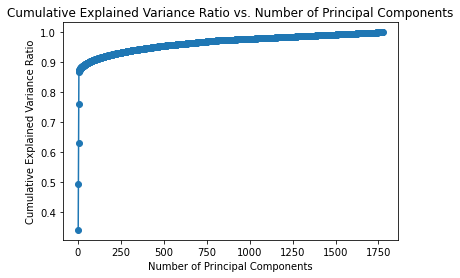

In [344]:
# Convert the array of arrays to a 2D numpy array
final_book_array = final_book.copy()

# Perform PCA
pca_bk = PCA()
pca_bk.fit(final_book_array)

# Calculate the cumulative explained variance ratio
cumulative_variance_ratio = np.cumsum(pca_bk.explained_variance_ratio_)

# Plot the cumulative explained variance ratio
plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance Ratio vs. Number of Principal Components')
plt.show()

These are a lot of features aand very difficult to read but we can see that the first 5 cover almost 90% of the explained variance. Lets zoom in on the graph to 10 elements to understad it better.

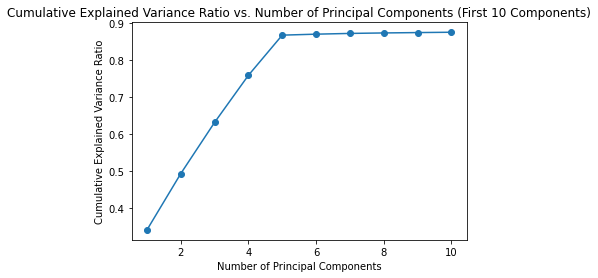

In [345]:
# Perform PCA
pca_bk = PCA(n_components=10)  # Set n_components to 10
pca_bk.fit(final_book_array)

# Calculate the cumulative explained variance ratio
cumulative_variance_ratio = np.cumsum(pca_bk.explained_variance_ratio_)

# Plot the cumulative explained variance ratio
plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance Ratio vs. Number of Principal Components (First 10 Components)')
plt.show()

There is. very clear elbow at 5 principal components. Lets zoom in further into 7 elements to have a better view.

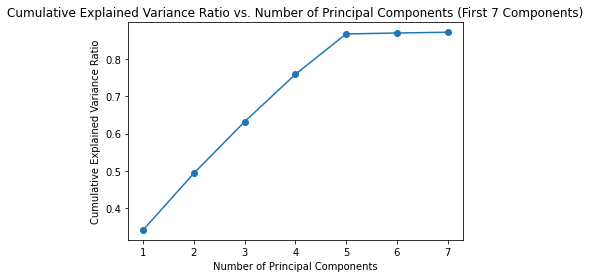

In [346]:
# Perform PCA
pca_bk = PCA(n_components=7)  # Set n_components to 7
pca_bk.fit(final_book_array)

# Calculate the cumulative explained variance ratio
cumulative_variance_ratio = np.cumsum(pca_bk.explained_variance_ratio_)

# Plot the cumulative explained variance ratio
plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance Ratio vs. Number of Principal Components (First 7 Components)')
plt.show()

We can see a clear elbow at 5 principal components. These will be the number of components we will use for clustering. Lets see how much of the explained variaance ratio does it cover.

In [347]:
# Extract the values for the fourth principal component
fifth_pc = cumulative_variance_ratio[4] 

print("Values for the third principal component:")
print(fifth_pc*100)

Values for the third principal component:
86.8283801182796


We are covering almost 87% of the explained variance which is really good considering that we are bringing down the features from ~1700 to only 5.

In [348]:
# Perform PCA
pca_bk = PCA(n_components=5) 
pca_bk.fit(final_book_array)

# Transform the dataset to the four principal components
transformed_data_book = pca_bk.transform(final_book_array)

print("Transformed dataset shape:")
print(transformed_data_book.shape)

Transformed dataset shape:
(4662, 5)


We will use this transformed dataset for clustering.

### Users

Similar to the books dataset, we will have to encode the categorical variables and scale the numerical features for the users dataset.

In [349]:
#check info
users.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5490 entries, 0 to 5489
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   User-ID     5490 non-null   int64  
 1   Age         5490 non-null   float64
 2   State       5490 non-null   object 
 3   Generation  5490 non-null   object 
 4   Age Group   5490 non-null   object 
 5   num_books   5490 non-null   float64
 6   avg_rating  5490 non-null   float64
dtypes: float64(3), int64(1), object(3)
memory usage: 343.1+ KB


In [350]:
#separate out the users with no prior reviews
users_s2

,User-ID,Age,State,Generation,Age Group
0,2,18.0,california,Generation Z,Teenagers
1,20,19.0,pennsylvania,Generation Z,Teenagers
2,25,55.0,california,Generation X,Old Age Adult
3,27,32.0,illinois,Generation Y,Young Age Adult
4,30,24.0,alaska,Generation Z,Young Age Adult
...,...,...,...,...,...
66742,278826,26.0,california,Generation Z,Young Age Adult
66743,278830,28.0,virginia,Generation Y,Young Age Adult
66744,278836,47.0,washington,Generation X,Middle Age Adult
66745,278840,45.0,california,Generation X,Middle Age Adult


We will have to scale the numerical features of Age, num_books, and avg_rating. We will also have to encode the categorical variabless of State, Generation, and Age Group. Since User-Id is aa unique identifier, we won't be using that for clustering.

We will combine the scenario 1 dataset and scenario 2 dataset before we do this. `num_books` and `avg_ratings` will not be used in the clustering part but will be useful in the hybrid collaborative approach part.

In [351]:
users_s2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 61259 entries, 0 to 66747
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   User-ID     61259 non-null  int64  
 1   Age         61259 non-null  float64
 2   State       61259 non-null  object 
 3   Generation  61259 non-null  object 
 4   Age Group   61259 non-null  object 
dtypes: float64(1), int64(1), object(3)
memory usage: 2.8+ MB


In [352]:
#combine the datasets for clustering
users_cluster = pd.concat([users_s2.reset_index(drop=True),
                          users[users_s2.columns].reset_index(drop=True)],
                         axis=0)

#check info
users_cluster.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 66749 entries, 0 to 5489
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   User-ID     66749 non-null  int64  
 1   Age         66749 non-null  float64
 2   State       66749 non-null  object 
 3   Generation  66749 non-null  object 
 4   Age Group   66749 non-null  object 
dtypes: float64(1), int64(1), object(3)
memory usage: 3.1+ MB


In [353]:
# one hot encoding categorical data like state, generation group, age group
state_enc = ohe()
encoded_state= state_enc.fit_transform(users_cluster.State.values.reshape(-1,1))

gen_enc = ohe()
encoded_gen= gen_enc.fit_transform(users_cluster.Generation.values.reshape(-1,1))

age_enc = ohe()
encoded_age= age_enc.fit_transform(users_cluster['Age Group'].values.reshape(-1,1))

#innitiaate the scaler
scaler = StandardScaler()

#numerical features to scale
num_fts = ['Age']#, 'num_books', 'avg_rating']

#scale the features
scaled_fts = scaler.fit_transform(users_cluster[num_fts])

# printing shapes to have the idea of dimensions 
print(encoded_state.shape)
print(encoded_gen.shape)
print(encoded_age.shape)
print(scaled_fts.shape)

# all featurized or numerically converted data merged for final input data
final_users = np.concatenate((encoded_state.toarray(),encoded_gen.toarray(),encoded_age.toarray(), scaled_fts), axis=1)
final_users.shape

(66749, 50)
(66749, 4)
(66749, 4)
(66749, 1)


(66749, 59)

In [354]:
final_users

array([[ 0.        ,  0.        ,  0.        , ...,  1.        ,
         0.        , -1.55176957],
       [ 0.        ,  0.        ,  0.        , ...,  1.        ,
         0.        , -1.46718948],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  1.57769392],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.22441241],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         1.        , -0.70596863],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         1.        , -0.28306816]])

59 total features is a lot which is not ideal and optimized for algorithms. We can use PCA to understand what will be optimized number of features to use for clustering. 

Principal Component Analysis (PCA) is beneficial for clustering because it offers dimensionality reduction by projecting high-dimensional data onto a lower-dimensional space while preserving maximum variance. This reduces computational complexity and addresses the challenges of high-dimensional data. PCA extracts informative features by identifying principal components, capturing the most relevant information and discarding noise or redundancy. Additionally, PCA allows for visualizing data in a reduced space, aiding in cluster interpretation. As a preprocessing step, PCA simplifies clustering tasks and improves performance by removing noise and irrelevant information. 

Lets try out PCA to understand how can we optimize this dataset.

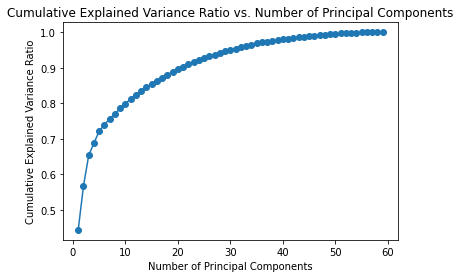

In [355]:
# Convert the array of arrays to a 2D numpy array
final_user_array = final_users.copy()

# Perform PCA
pca = PCA()
pca.fit(final_user_array)

# Calculate the cumulative explained variance ratio
cumulative_variance_ratio = np.cumsum(pca.explained_variance_ratio_)

# Plot the cumulative explained variance ratio
plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance Ratio vs. Number of Principal Components')
plt.show()

We can see a much smoother curve for users as compared to the books data. Lets zoom in to 20 prinipaal componennts and take a closer look to spot the elbow.

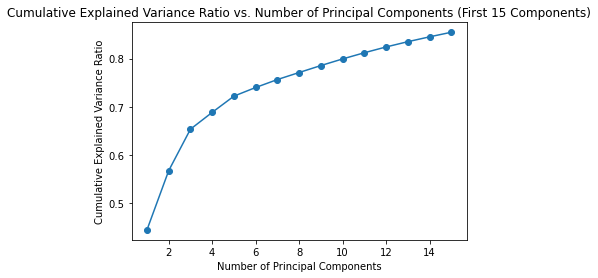

In [356]:
# Perform PCA
pca = PCA(n_components=15)  # Set n_components to 15 
pca.fit(final_user_array)

# Calculate the cumulative explained variance ratio
cumulative_variance_ratio = np.cumsum(pca.explained_variance_ratio_)

# Plot the cumulative explained variance ratio
plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance Ratio vs. Number of Principal Components (First 15 Components)')
plt.show()

We can notice 2 elbows, one is at 3 components while the other one is at 5. After the elbow at 5, the gradient remaains very consistent. Lets zoom in a little further to get aa better view.

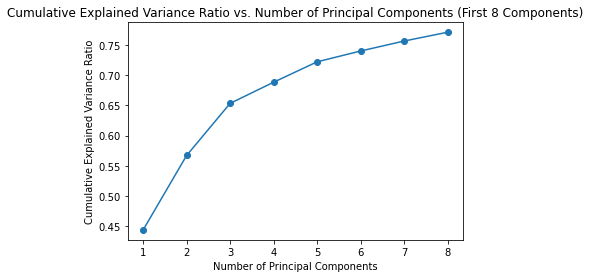

In [357]:
# Perform PCA
pca = PCA(n_components=8)  # Set n_components to 8
pca.fit(final_user_array)

# Calculate the cumulative explained variance ratio
cumulative_variance_ratio = np.cumsum(pca.explained_variance_ratio_)

# Plot the cumulative explained variance ratio
plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance Ratio vs. Number of Principal Components (First 8 Components)')
plt.show()

The elbow aat 3 is more pronounced than the elbow at 5. Nontheless, after the elbow at 5 the rate of change remains very consistent. Although there is a greater different after 3 components as compmared to after 5 components, we caan take 5 components to cover more of the explained variaance and have more data for clustering.

In [358]:
# Extract the values for the fourth principal component
fifth_pc = cumulative_variance_ratio[4] 

print("Values for the fifth principal component:")
print(fifth_pc*100)

Values for the fifth principal component:
72.20158845965875


We are coverig almost 72% of the explained variance which is really good considering we are bringing down the number of features from 59 to 5.

In [359]:
# Perform PCA
pca = PCA(n_components=5) 
pca.fit(final_user_array)

# Transform the dataset to the four principal components
transformed_data_usr = pca.transform(final_user_array)

print("Transformed dataset shape:")
print(transformed_data_usr.shape)

Transformed dataset shape:
(66749, 5)


## Clustering

### Books

Books data clustering to group similar books. There are many algorithm for clustering like kmeans, hirarchical, DBSCAN. Here kmeans is used for clustering books data. Each book's label obtained from model is stored.

In [360]:
# Define the K-Means clustering algorithm
kmeans = KMeans(random_state=11)

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_clusters': [6,7,9],#8,9,10, 11,12,13,14,15],  # Adjust the values as desired
    'init': ['k-means++', 'random'],  # Adjust the initialization methods as desired
    'max_iter': [20, 50, 100],  # Adjust the maximum number of iterations as desired
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(kmeans, param_grid, cv=5)
grid_search.fit(transformed_data_book)  

# Print the best parameters
print("Best parameters:", grid_search.best_params_)

# # Print the best score
# print("Best score:", grid_search.best_score_)

# Get the best hyperparameters and the best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Assign cluster labels to the book data using the best hyperparameters
best_kmeans = KMeans(**best_params, random_state=42)
best_kmeans.fit(transformed_data_book)  # Use transformed_data
book_df['cluster_label_bk'] = best_kmeans.labels_


Best parameters: {'init': 'k-means++', 'max_iter': 20, 'n_clusters': 9}


In [361]:
#check cluster label distribution
book_df.cluster_label_bk.value_counts()

1    772
3    763
8    657
6    586
0    583
2    557
5    262
4    258
7    224
Name: cluster_label_bk, dtype: int64

### Users

In [362]:
# Define the K-Means clustering algorithm
kmeans_u = KMeans(random_state=42)

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_clusters': [6, 7,9,11],  # Adjust the values as desired
    'init': ['k-means++', 'random'],  # Adjust the initialization methods as desired
    'max_iter': [100, 200, 300]  # Adjust the maximum number of iterations as desired
}

# Perform grid search with cross-validation
grid_search_u = GridSearchCV(kmeans_u, param_grid, cv=5)
grid_search_u.fit(transformed_data_usr)

# Print the best parameters
print("Best parameters:", grid_search_u.best_params_)

# # Print the best score
# print("Best score:", grid_search_u.best_score_)

# Get the best hyperparameters and the best score
best_params = grid_search_u.best_params_
best_score = grid_search_u.best_score_

# Assign cluster labels to the book data using the best hyperparameters
best_kmeans = KMeans(**best_params, random_state=42)
best_kmeans.fit(transformed_data_usr)
users_cluster['cluster_label_usr'] = best_kmeans.labels_

Best parameters: {'init': 'k-means++', 'max_iter': 100, 'n_clusters': 11}


In [363]:
#check cluster label distribution
users_cluster.cluster_label_usr.value_counts()

2     14983
5     10098
4      9881
0      9730
3      9178
6      5434
7      2082
1      1379
9      1379
10     1314
8      1291
Name: cluster_label_usr, dtype: int64

Now lets separate out the cluster labels to assign to the sceario 1 ad senaario 2 user datasets.

In [364]:
#copy users to create scenario 1 dataset
users_s1 = users.copy()

# Merge the dataframes based on User-ID
users_s1 = pd.merge(users_s1, users_cluster[['User-ID', 'cluster_label_usr']], on='User-ID', how='left')

#preview
users_s1

,User-ID,Age,State,Generation,Age Group,num_books,avg_rating,cluster_label_usr
0,44,51.0,north carolina,Generation X,Old Age Adult,1.0,4.000000,3
1,51,34.0,washington,Generation Y,Young Age Adult,1.0,4.500000,2
2,75,37.0,california,Generation Y,Middle Age Adult,1.0,3.000000,9
3,99,42.0,colorado,Generation Y,Middle Age Adult,1.0,5.000000,4
4,254,24.0,minnesota,Generation Z,Young Age Adult,4.0,4.125000,0
...,...,...,...,...,...,...,...,...
5485,278552,26.0,michigan,Generation Z,Young Age Adult,1.0,4.500000,0
5486,278683,27.0,texas,Generation Y,Young Age Adult,1.0,1.000000,2
5487,278798,39.0,oregon,Generation Y,Middle Age Adult,1.0,3.500000,4
5488,278843,28.0,california,Generation Y,Young Age Adult,3.0,4.166667,7


In [365]:
#check info
users_s1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5490 entries, 0 to 5489
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   User-ID            5490 non-null   int64  
 1   Age                5490 non-null   float64
 2   State              5490 non-null   object 
 3   Generation         5490 non-null   object 
 4   Age Group          5490 non-null   object 
 5   num_books          5490 non-null   float64
 6   avg_rating         5490 non-null   float64
 7   cluster_label_usr  5490 non-null   int32  
dtypes: float64(3), int32(1), int64(1), object(3)
memory usage: 364.6+ KB


Now we will do the same thing for the scenario 2 dataset.

In [366]:
# Merge the dataframes based on User-ID
users_s2 = pd.merge(users_s2, users_cluster[['User-ID', 'cluster_label_usr']], on='User-ID', how='left')

#preview
users_s2

,User-ID,Age,State,Generation,Age Group,cluster_label_usr
0,2,18.0,california,Generation Z,Teenagers,6
1,20,19.0,pennsylvania,Generation Z,Teenagers,6
2,25,55.0,california,Generation X,Old Age Adult,10
3,27,32.0,illinois,Generation Y,Young Age Adult,2
4,30,24.0,alaska,Generation Z,Young Age Adult,0
...,...,...,...,...,...,...
61254,278826,26.0,california,Generation Z,Young Age Adult,8
61255,278830,28.0,virginia,Generation Y,Young Age Adult,2
61256,278836,47.0,washington,Generation X,Middle Age Adult,5
61257,278840,45.0,california,Generation X,Middle Age Adult,1


In [367]:
#check info
users_s2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 61259 entries, 0 to 61258
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   User-ID            61259 non-null  int64  
 1   Age                61259 non-null  float64
 2   State              61259 non-null  object 
 3   Generation         61259 non-null  object 
 4   Age Group          61259 non-null  object 
 5   cluster_label_usr  61259 non-null  int32  
dtypes: float64(1), int32(1), int64(1), object(3)
memory usage: 3.0+ MB


We can leverage the cluster labels to extract and average value from users_s1 for avg_rating and numm_books and assign it to users_s2.

In [368]:
#find the averages
a_rt = users_s1.groupby('cluster_label_usr').mean()[['num_books','avg_rating']]

#preview
a_rt

,num_books,avg_rating
cluster_label_usr,,
0,2.187571,4.029599
1,2.892157,3.985655
2,2.465470,3.977950
3,1.863118,3.879269
4,2.149425,3.987190
5,2.436578,4.009953
6,1.641079,4.065178
7,2.254386,3.962546
8,2.512195,3.902847


In [369]:
#add num_books
for idx, value in enumerate(a_rt['num_books']):
    users_s2.loc[users_s2['cluster_label_usr'] == idx, 'num_books'] = round(value)

#add avg_rating
for idx, value in enumerate(a_rt['avg_rating']):
    users_s2.loc[users_s2['cluster_label_usr'] == idx, 'avg_rating'] = round(value,2)

#preview
users_s2

,User-ID,Age,State,Generation,Age Group,cluster_label_usr,num_books,avg_rating
0,2,18.0,california,Generation Z,Teenagers,6,2.0,4.07
1,20,19.0,pennsylvania,Generation Z,Teenagers,6,2.0,4.07
2,25,55.0,california,Generation X,Old Age Adult,10,2.0,3.92
3,27,32.0,illinois,Generation Y,Young Age Adult,2,2.0,3.98
4,30,24.0,alaska,Generation Z,Young Age Adult,0,2.0,4.03
...,...,...,...,...,...,...,...,...
61254,278826,26.0,california,Generation Z,Young Age Adult,8,3.0,3.90
61255,278830,28.0,virginia,Generation Y,Young Age Adult,2,2.0,3.98
61256,278836,47.0,washington,Generation X,Middle Age Adult,5,2.0,4.01
61257,278840,45.0,california,Generation X,Middle Age Adult,1,3.0,3.99


In [370]:
#reindex to ensure the columns are in the saame order as users_s1
new_column_order = ['User-ID', 'Age', 'State','Generation','Age Group', 'num_books','avg_rating', 'cluster_label_usr']

users_s2 = users_s2.reindex(columns=new_column_order)

#preview
users_s2

,User-ID,Age,State,Generation,Age Group,num_books,avg_rating,cluster_label_usr
0,2,18.0,california,Generation Z,Teenagers,2.0,4.07,6
1,20,19.0,pennsylvania,Generation Z,Teenagers,2.0,4.07,6
2,25,55.0,california,Generation X,Old Age Adult,2.0,3.92,10
3,27,32.0,illinois,Generation Y,Young Age Adult,2.0,3.98,2
4,30,24.0,alaska,Generation Z,Young Age Adult,2.0,4.03,0
...,...,...,...,...,...,...,...,...
61254,278826,26.0,california,Generation Z,Young Age Adult,3.0,3.90,8
61255,278830,28.0,virginia,Generation Y,Young Age Adult,2.0,3.98,2
61256,278836,47.0,washington,Generation X,Middle Age Adult,2.0,4.01,5
61257,278840,45.0,california,Generation X,Middle Age Adult,3.0,3.99,1


## Data Preparation for EDA

To prepare the data for EDA, we will have to combine the different datasets. Lets take a look at how these datasetss vary in their shapes.

In [371]:
#check shape
ratings_s1.shape

(47848, 3)

In [372]:
#check shape
users_s1.shape

(5490, 8)

In [373]:
#check shape
book_df.shape

(4662, 8)

We will first filter out the ratings dataset to keep the user IDs that we filtered in the users dataset to ensure that we have the same userss that we have information for. We will do the same things for books.

In [374]:
#filter for user IDs for known ratings
ratings_s1 = ratings_s1[ratings_s1["User-ID"].isin(users_s1["User-ID"].unique())]

#filter for book ISBN
ratings_s1 = ratings_s1[ratings_s1["ISBN"].isin(book_df["ISBN"].unique())]

In [375]:
#check new shape
ratings_s1.shape

(25628, 3)

In [376]:
#merge ratings and books
rating_books_s1 = ratings_s1.merge(book_df, how='inner', on='ISBN')

In [377]:
#preview the dataset
rating_books_s1.head()

,User-ID,ISBN,Book-Rating,authors,publishedDate,pageCount,categories,totRat,avgRat,cluster_label_bk
0,276964,0345354621,5.0,['Michael Crichton'],1988,292.0,0,45.0,3.5,6
1,6345,0345354621,NaN,['Michael Crichton'],1988,292.0,0,45.0,3.5,6
2,16795,0345354621,NaN,['Michael Crichton'],1988,292.0,0,45.0,3.5,6
3,18172,0345354621,NaN,['Michael Crichton'],1988,292.0,0,45.0,3.5,6
4,26544,0345354621,NaN,['Michael Crichton'],1988,292.0,0,45.0,3.5,6


In [378]:
#check shape
rating_books_s1.shape

(25628, 10)

In [379]:
#check for missing values
rating_books_s1.isna().sum()

User-ID                 0
ISBN                    0
Book-Rating         13366
authors                 0
publishedDate           0
pageCount               0
categories              0
totRat                  0
avgRat                  0
cluster_label_bk        0
dtype: int64

In [380]:
#chek for duplicate values
rating_books_s1.duplicated().sum()

0

In [381]:
#check info
rating_books_s1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25628 entries, 0 to 25627
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   User-ID           25628 non-null  int64  
 1   ISBN              25628 non-null  object 
 2   Book-Rating       12262 non-null  float64
 3   authors           25628 non-null  object 
 4   publishedDate     25628 non-null  int64  
 5   pageCount         25628 non-null  float64
 6   categories        25628 non-null  int32  
 7   totRat            25628 non-null  float64
 8   avgRat            25628 non-null  float64
 9   cluster_label_bk  25628 non-null  int32  
dtypes: float64(4), int32(2), int64(2), object(2)
memory usage: 2.0+ MB


In [382]:
#merge user dataset
user_rating_books_s1 = rating_books_s1.merge(users_s1, how='inner', on='User-ID')

#preview the dataset
user_rating_books_s1.head()

,User-ID,ISBN,Book-Rating,authors,publishedDate,pageCount,categories,totRat,avgRat,cluster_label_bk,Age,State,Generation,Age Group,num_books,avg_rating,cluster_label_usr
0,276964,0345354621,5.0,['Michael Crichton'],1988,292.0,0,45.0,3.5,6,34.0,missouri,Generation Y,Young Age Adult,2.0,4.50,2
1,276964,0684867621,4.0,['Stephen King'],1999,232.0,3,142.0,3.5,3,34.0,missouri,Generation Y,Young Age Adult,2.0,4.50,2
2,6345,0345354621,NaN,['Michael Crichton'],1988,292.0,0,45.0,3.5,6,29.0,wisconsin,Generation Y,Young Age Adult,2.0,4.75,2
3,6345,0345378482,4.5,['Michael Crichton'],1993,292.0,3,154.0,3.5,3,29.0,wisconsin,Generation Y,Young Age Adult,2.0,4.75,2
4,6345,0330267388,5.0,['Douglas Adams'],1982,161.0,6,1862.0,3.5,5,29.0,wisconsin,Generation Y,Young Age Adult,2.0,4.75,2


In [383]:
#check for missing values
user_rating_books_s1.isna().sum()

User-ID                  0
ISBN                     0
Book-Rating          13366
authors                  0
publishedDate            0
pageCount                0
categories               0
totRat                   0
avgRat                   0
cluster_label_bk         0
Age                      0
State                    0
Generation               0
Age Group                0
num_books                0
avg_rating               0
cluster_label_usr        0
dtype: int64

In [384]:
#check for duplicates
user_rating_books_s1.duplicated().sum()

0

In [385]:
#check info
user_rating_books_s1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25628 entries, 0 to 25627
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   User-ID            25628 non-null  int64  
 1   ISBN               25628 non-null  object 
 2   Book-Rating        12262 non-null  float64
 3   authors            25628 non-null  object 
 4   publishedDate      25628 non-null  int64  
 5   pageCount          25628 non-null  float64
 6   categories         25628 non-null  int32  
 7   totRat             25628 non-null  float64
 8   avgRat             25628 non-null  float64
 9   cluster_label_bk   25628 non-null  int32  
 10  Age                25628 non-null  float64
 11  State              25628 non-null  object 
 12  Generation         25628 non-null  object 
 13  Age Group          25628 non-null  object 
 14  num_books          25628 non-null  float64
 15  avg_rating         25628 non-null  float64
 16  cluster_label_usr  256

With no duplicate values, this dataset does not need any basic cleaning. The missing values for the ratings will serve as the dataset that will be used to predict on for scenario 1. The missing values represents the books that the users (we have prior reviews of) have not read yet. This will simulate the scenario for current users for whom we want to recommend new books.

## EDA

### Clustering Label Exploration

#### Books

We can start with exploring the book and user clusters to understand more aabout what sets them apart. T oexplore the clusters it would be more efficient to look at the books and user datasets separately. In the end we can take a look at these jointly.

We can start with exploring the Books clusters.

In [386]:
#check info
book_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4662 entries, 115 to 117443
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ISBN              4662 non-null   object 
 1   authors           4662 non-null   object 
 2   publishedDate     4662 non-null   int64  
 3   pageCount         4662 non-null   float64
 4   categories        4662 non-null   int32  
 5   totRat            4662 non-null   float64
 6   avgRat            4662 non-null   float64
 7   cluster_label_bk  4662 non-null   int32  
dtypes: float64(3), int32(2), int64(1), object(2)
memory usage: 291.4+ KB


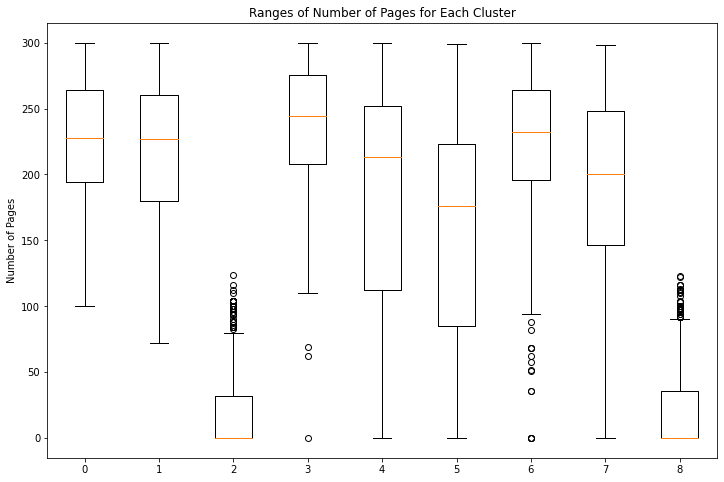

In [387]:
# Group the book_df by cluster_label and get the number of pages for each cluster
cluster_groups = book_df.groupby('cluster_label_bk')['pageCount'].apply(list)

# Create a list of data for box plot
data = [pages for _, pages in cluster_groups.items()]

# Create a box plot
fig, ax = plt.subplots(figsize=(12, 8))
ax.boxplot(data)

# Set the x-axis labels as cluster labels
ax.set_xticklabels(cluster_groups.keys())

# Set the y-axis label
ax.set_ylabel('Number of Pages')

# Set the title of the plot
plt.title('Ranges of Number of Pages for Each Cluster')

# Show the plot
plt.show()

As expected, aall books sare under 300 pages since that is what we filtered for. Nonetheless, exccept for label 2 and 8, we don't see a lot of distinction but some of them do have diffing means. 

Most books with less than 100 pages are covered under label 2 and 8 while books between 100-150 are covered under label 4 and 5. Books with pages 150 to 200 are shared by lbels 4,5, and 7 while books with more than 250 pages are shared amongst label 0, 1, 3, 4, 6 and 7.

Next lets investigate how d othe Publihsing Years differ for the different clusters.

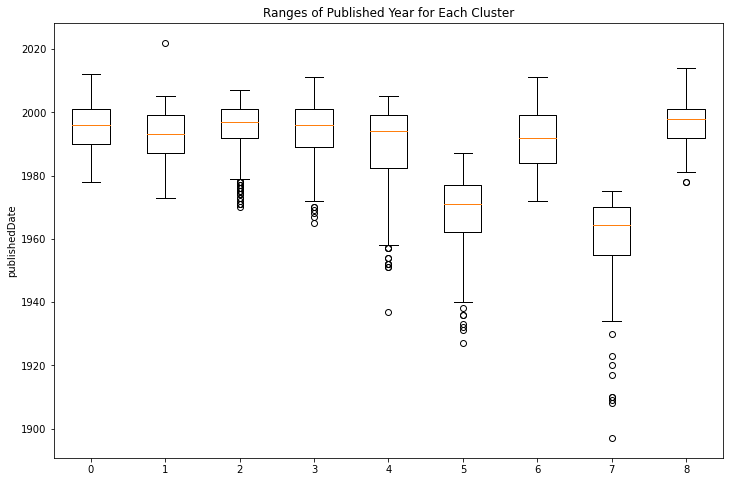

In [388]:
# Group the book_df by cluster_label and get the year of publication for each cluster
cluster_groups = book_df.groupby('cluster_label_bk')['publishedDate'].apply(list)

# Create a list of data for box plot
data = [years for _, years in cluster_groups.items()]

# Create a box plot
fig, ax = plt.subplots(figsize=(12, 8))
ax.boxplot(data)

# Set the x-axis labels as cluster labels
ax.set_xticklabels(cluster_groups.keys())

# Set the y-axis label
ax.set_ylabel('publishedDate')

# Set the title of the plot
plt.title('Ranges of Published Year for Each Cluster')

# Show the plot
plt.show()


Label 5 and 7 provide clear demaarcations showing that they represent older books while the rest of the labels mostly carry reccently published Books in similaar timeframes.

Lets take a look at how do the different average raatings if books within clusters vary.

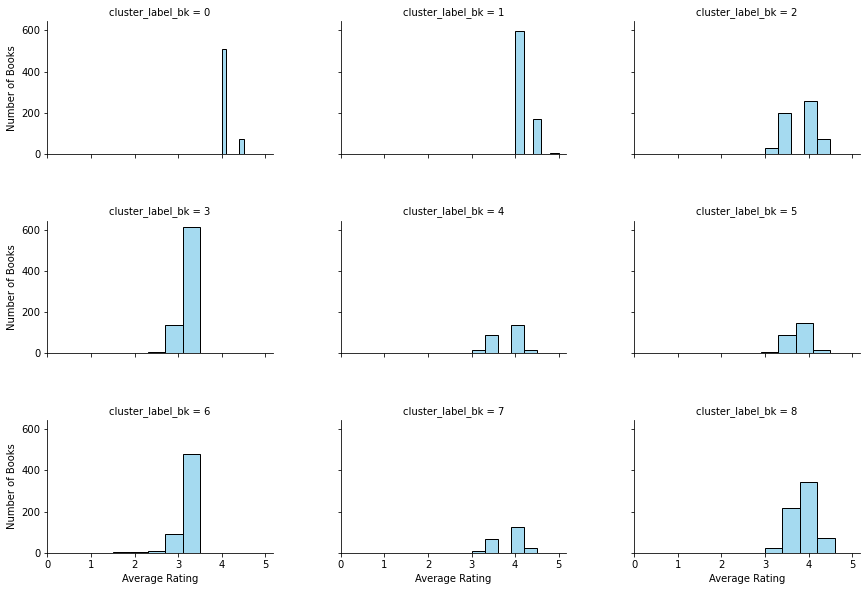

In [389]:
# Define the desired figure size
fig_size = (12, 8)  # Adjust the width and height as needed

# Create a grid of plots
grid = sns.FacetGrid(book_df, col='cluster_label_bk', col_wrap=3, sharey=True, height=4, aspect=1.2)

# Plot the bar chart for each cluster
grid.map(sns.histplot, 'avgRat', bins=5, color='skyblue')

# Set x-axis and y-axis labels for each subplot
grid.set_axis_labels('Average Rating', 'Number of Books')

# Set x-axis ticks and labels for each subplot
for ax in grid.axes.flat:
    ax.set_xticks(range(6))
    ax.set_xticklabels(range(6))

# Adjust the spacing between subplots
grid.fig.subplots_adjust(hspace=0.5, wspace=0.3)

# Set the figure size
grid.fig.set_size_inches(fig_size[0], fig_size[1])

# Display the grid of plots
plt.show()


Cluster 0 and 1 haave the narrowest ranges with only having books between 4 and 4.5 while cluster labels 2, 4, 5, 7, 8 have similar ranges between 3 and 4.5

Only labels 3 and 6 have books with average ratings below 3.

Recall, that we alsos did clusstering for the category column to reduce the number of genres/categories we had.

Lets visualize the caategories disstribution across the clusters.

In [390]:
# Group the data by cluster labels and category labels and count the number of books
grouped_data = book_df.groupby(['cluster_label_bk', 'categories']).size().reset_index(name='Number of Books')

# Create a custom color map
category_colors = px.colors.qualitative.Alphabet[:len(grouped_data['categories'].unique())]

# Create a stacked bar chart with distinct colors for each category label
fig = px.bar(grouped_data, x='cluster_label_bk', y='Number of Books', color='categories',
             title='Number of Books by Cluster and Category',
             color_discrete_sequence=category_colors)

# Set axes labels
fig.update_layout(
    xaxis_title='Cluster Label',
    yaxis_title='Number of Books'
)

# Show the figure
fig.show()


Labels 1, 2, 6, 7 carry the saame categories. Similarly, Labels 0, 3, 5, 8 also carry the same categories.

Label 4 is the only one that stands out with having a different mix of categories.

Next, lets check how do the total ratings that books received played a part in the cluster labels.

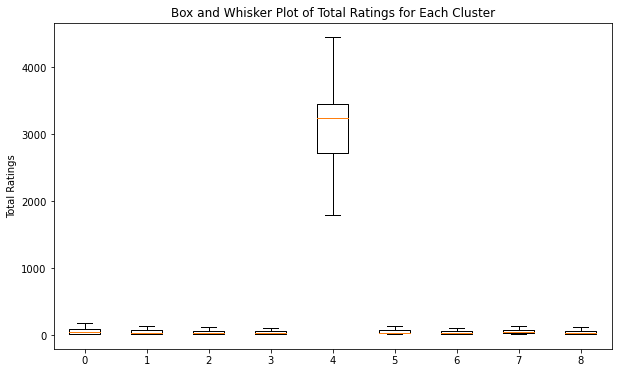

In [391]:
# Group the book_df by cluster_label and get the total ratings for each cluster
cluster_groups = book_df.groupby('cluster_label_bk')['totRat'].apply(list)

# Create a list of data for the box and whisker plot
data = [ratings for _, ratings in cluster_groups.items()]

# Create the box and whisker plot
fig, ax = plt.subplots(figsize=(10, 6))
ax.boxplot(data, showfliers=False)

# Set the x-axis labels as cluster labels
ax.set_xticklabels(cluster_groups.keys())

# Set the y-axis label
ax.set_ylabel('Total Ratings')

# Set the title of the plot
plt.title('Box and Whisker Plot of Total Ratings for Each Cluster')

# Show the plot
plt.show()


It is clear that label 4 carries books that mostly had more than 2000 reviews. Lets drop label 4 and visualize the others to get a bettere understanding.

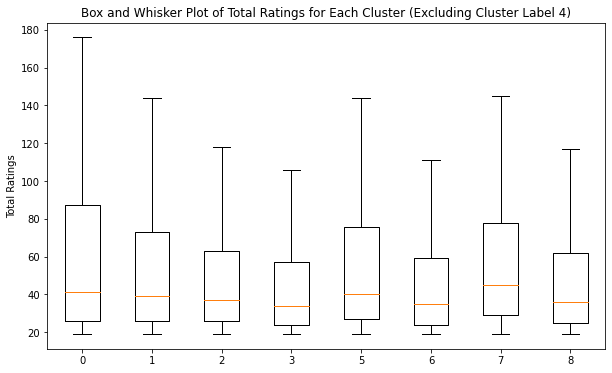

In [392]:
# Filter the book_df to exclude Cluster Label 3
filtered_df = book_df[book_df['cluster_label_bk'] != 4]

# Group the filtered_df by cluster_label and get the total ratings for each cluster
cluster_groups = filtered_df.groupby('cluster_label_bk')['totRat'].apply(list)

# Create a list of data for the box and whisker plot
data = [ratings for _, ratings in cluster_groups.items()]

# Create the box and whisker plot
fig, ax = plt.subplots(figsize=(10, 6))
ax.boxplot(data, showfliers=False)

# Set the x-axis labels as cluster labels
ax.set_xticklabels(cluster_groups.keys())

# Set the y-axis label
ax.set_ylabel('Total Ratings')

# Set the title of the plot
plt.title('Box and Whisker Plot of Total Ratings for Each Cluster (Excluding Cluster Label 4)')

# Show the plot
plt.show()


There is not a lot of significant difference between the labels with regards to the number of reviews thaat books received except for label 4. Most of the averages in the above box plot are close by.

#### Users

Now lets explore the users dataset to get an understanding of their labels. we will use the dataset thaat we used for clustering.

In [393]:
#check info
users_cluster.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 66749 entries, 0 to 5489
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   User-ID            66749 non-null  int64  
 1   Age                66749 non-null  float64
 2   State              66749 non-null  object 
 3   Generation         66749 non-null  object 
 4   Age Group          66749 non-null  object 
 5   cluster_label_usr  66749 non-null  int32  
dtypes: float64(1), int32(1), int64(1), object(3)
memory usage: 3.3+ MB


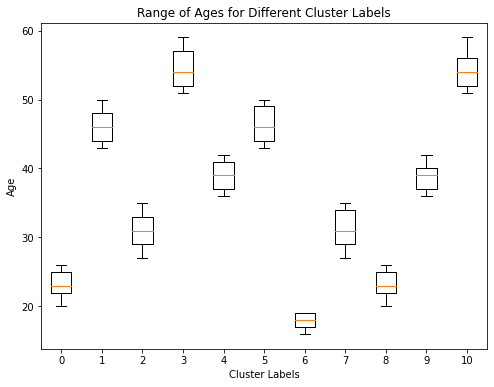

In [394]:
cluster_labels = users_cluster['cluster_label_usr']

# Get the age values for each cluster label
age_data = []
for label in sorted(cluster_labels.unique()):
    age_data.append(users_cluster[users_cluster['cluster_label_usr'] == label]['Age'])

# Create a box plot
fig = plt.figure(figsize=(8, 6))  # Set the size of the plot
ax = fig.add_subplot(111)
ax.boxplot(age_data, labels=sorted(cluster_labels.unique()))

# Set labels and title
ax.set_xlabel('Cluster Labels')
ax.set_ylabel('Age')
ax.set_title('Range of Ages for Different Cluster Labels')

# Show the plot
plt.show()


Ages were definitely a big differentiator between the clusters. Nonetheless, there are some overlaps.

Label 0 and 8 have the same ages and similarly clusters combinations of (1,5), (2,7), (3,10), (4,9)

But Label 6 stands out with covering ages less than 20. As we go throug other features, we might see the distinction between the other cmbination of clusters that have similar ages.

Lets take a look aaat states next and see if we caan find the dfferences.

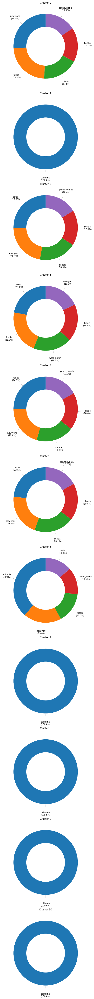

In [395]:
cluster_labels = users_cluster['cluster_label_usr']
clusters = cluster_labels.unique()

# Create a figure and axis for the subplots
fig, axes = plt.subplots(len(clusters), figsize=(12, 6 * len(clusters)))

# Sort the clusters in ascending order
clusters.sort()

# Iterate over each cluster label
for i, cluster_label in enumerate(clusters):
    # Filter the data for the current cluster
    cluster_data = users_cluster[users_cluster['cluster_label_usr'] == cluster_label]
    
    # Get the top 5 states by user count for the current cluster
    top_states = cluster_data['State'].value_counts().nlargest(5)
    
    # Calculate the total user count for the current cluster
    total_users = top_states.sum()
    
    # Calculate the percentage of users for each state
    state_percentages = (top_states / total_users) * 100
    
    # Create a donut plot for the current cluster label
    ax = axes[i]
    wedges, _ = ax.pie(top_states, labels=None, startangle=90, wedgeprops=dict(width=0.4))
    ax.set_title(f'Cluster {cluster_label}', pad=10)
    
    # Add lines and labels to the donut plot
    for j, wedge in enumerate(wedges):
        # Calculate the angle at the midpoint of each wedge
        angle = (wedge.theta2 - wedge.theta1) / 2.0 + wedge.theta1
        angle_rad = angle * (3.14159 / 180.0)
        
        # Calculate the coordinates for the line end point
        x = 0.9 * wedge.r * np.cos(angle_rad)
        y = 0.9 * wedge.r * np.sin(angle_rad)
        
        # Add a line from the donut plot to the label
        line_start = (wedge.r * np.cos(angle_rad), wedge.r * np.sin(angle_rad))
        line_end = (1.1 * wedge.r * np.cos(angle_rad), 1.1 * wedge.r * np.sin(angle_rad))
        ax.annotate('', xy=line_end, xytext=line_start, arrowprops=dict(arrowstyle="-", color='gray', lw=0.5))
        
        # Add the state label and percentage as an annotation
        state_label = top_states.index[j]
        percentage = state_percentages[j]
        ax.annotate(f'{state_label}\n({percentage:.1f}%)', xy=(line_end[0], line_end[1]), xytext=(1.3 * wedge.r * np.cos(angle_rad), 1.3 * wedge.r * np.sin(angle_rad)),
                    ha='center', va='center')
        
    # Increase spacing between the title and the plot
    ax.title.set_position([0.5, 1.15])
        
# Set the aspect ratio to be equal to ensure a circular donut plot
for ax in axes:
    ax.set_aspect('equal')

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.5)

plt.tight_layout()
plt.show()


Looking at the previous combinations, lets see if we can find the differences:

    - (0,8): These two clusters are very different with regards to location. Cluster zero has data from different states while cluster 8 only has data for California users.
    
    - (1,5): Similar to the previous combination, label 1 only has data for ccalifornia users while cluster 5 data for users of multiple states
    
    - (2,7): label 2 and 7 have the same different with label 2 having data for multiple states and label 7 having data only for california
    
    - (3,10): label 3 and 10 have the same difference with label 3 having data for multiple states and label 10 having data only for california
    
    - (4,9): label 4 and 9 have the same difference with label 4 having data for multiple states and label 9 having data only for california

Next, lets check how did the Generations feature get distributed across the different clusters.

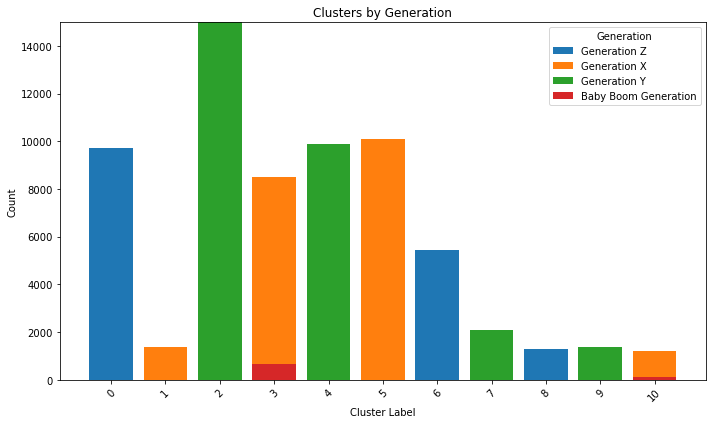

In [396]:
cluster_labels = users_cluster['cluster_label_usr']
clusters = sorted(cluster_labels.unique())

# Get the unique generations in the dataset
generations = users_cluster['Generation'].unique()

# Create an empty DataFrame to store the cluster counts for each generation
cluster_counts = pd.DataFrame(index=clusters, columns=generations)

# Iterate over each generation
for generation in generations:
    # Filter the data for the current generation
    generation_data = users_cluster[users_cluster['Generation'] == generation]
    
    # Count the number of users in each cluster for the current generation
    counts = generation_data['cluster_label_usr'].value_counts()
    
    # Reindex the counts to include all clusters
    counts = counts.reindex(clusters, fill_value=0)
    
    # Assign the counts to the DataFrame
    cluster_counts[generation] = counts

# Create a stacked bar chart for clusters by generation
fig, ax = plt.subplots(figsize=(10, 6))

# Set the index positions for the bars
bar_positions = range(len(clusters))

# Iterate over each generation
for i, generation in enumerate(generations):
    # Get the count of each cluster for the current generation
    counts = cluster_counts[generation]
    
    # Plot the bars for the current generation
    if i == 0:
        ax.bar(bar_positions, counts, label=generation)
    else:
        bottom = cluster_counts[generations[i-1]].values
        ax.bar(bar_positions, counts, bottom=bottom, label=generation)

# Configure the plot
ax.set_xlabel('Cluster Label')
ax.set_ylabel('Count')
ax.set_title('Clusters by Generation')
ax.set_xticks(range(len(clusters)))
ax.set_xticklabels(clusters)
ax.legend(title='Generation')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Looks like Gen Z got disstributed between clustser 0, 6 and 8.

Gen X got disstributed between Clusters 1, 3, 5 and 10.

Gen Y got distributed between Clusters 2, 4, 7 and 9

Baby Boomers for distributed between Clusters 3 and 10.

Next, Lets check how did the Age Group feaature got distributed between the clusters.

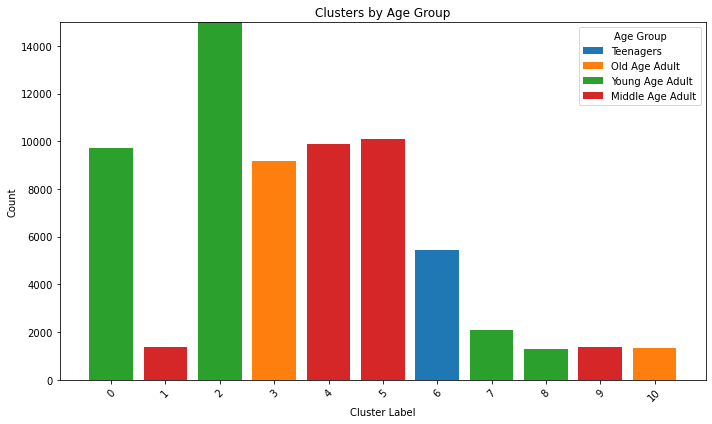

In [397]:
# Assuming your dataframe is named 'users' and the cluster labels are in the 'cluster_label' column
cluster_labels = users_cluster['cluster_label_usr']
clusters = sorted(cluster_labels.unique())

# Get the unique age groups in the dataset
age_groups = users_cluster['Age Group'].unique()

# Create an empty DataFrame to store the cluster counts for each age group
cluster_counts = pd.DataFrame(index=clusters, columns=age_groups)

# Iterate over each age group
for age_group in age_groups:
    # Filter the data for the current age group
    age_group_data = users_cluster[users_cluster['Age Group'] == age_group]
    
    # Count the number of users in each cluster for the current age group
    counts = age_group_data['cluster_label_usr'].value_counts()
    
    # Reindex the counts to include all clusters
    counts = counts.reindex(clusters, fill_value=0)
    
    # Assign the counts to the DataFrame
    cluster_counts[age_group] = counts

# Create a stacked bar chart for clusters by age group
fig, ax = plt.subplots(figsize=(10, 6))

# Set the index positions for the bars
bar_positions = range(len(clusters))

# Iterate over each age group
for i, age_group in enumerate(age_groups):
    # Get the count of each cluster for the current age group
    counts = cluster_counts[age_group]
    
    # Plot the bars for the current age group
    if i == 0:
        ax.bar(bar_positions, counts, label=age_group)
    else:
        bottom = cluster_counts[age_groups[i-1]].values
        ax.bar(bar_positions, counts, bottom=bottom, label=age_group)

# Configure the plot
ax.set_xlabel('Cluster Label')
ax.set_ylabel('Count')
ax.set_title('Clusters by Age Group')
ax.set_xticks(range(len(clusters)))
ax.set_xticklabels(clusters)
ax.legend(title='Age Group')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Cluster 0: This got the older Gen Z population who are young adults

Cluster 1: This got the younger Gen X population who are middle aged

Cluster 2: This got the younger chunk of Gen Y (millenials) who are young adults

Cluster 3: This got the older Gen X and Baby Boomer population who are Old adults

Cluster 4: This got the older Gen Y (millenials) who are middle aged

Cluster 5: This got the major chunk of the younger Gen X population who are middle aged

Cluster 6: This got the younger Gen Z population who are teenagers between 16 and 19 years old

Cluster 7: This got the younger Gen Y (millenials) population who are young adults

Cluster 8: This got the older Gen Z population who are young adults

Cluster 9: This got the older Gen Y (millenials) who are middle aged

Cluster 10: This got the older Gen X and Baby Boomer population who are Old adults

Although we saw, overlap of Generations only in labels 3 and 10, we can see that age groups were the ones driving that for those two labels.

### Modelling Dataset Exploration

In [398]:
#check info
user_rating_books_s1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25628 entries, 0 to 25627
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   User-ID            25628 non-null  int64  
 1   ISBN               25628 non-null  object 
 2   Book-Rating        12262 non-null  float64
 3   authors            25628 non-null  object 
 4   publishedDate      25628 non-null  int64  
 5   pageCount          25628 non-null  float64
 6   categories         25628 non-null  int32  
 7   totRat             25628 non-null  float64
 8   avgRat             25628 non-null  float64
 9   cluster_label_bk   25628 non-null  int32  
 10  Age                25628 non-null  float64
 11  State              25628 non-null  object 
 12  Generation         25628 non-null  object 
 13  Age Group          25628 non-null  object 
 14  num_books          25628 non-null  float64
 15  avg_rating         25628 non-null  float64
 16  cluster_label_usr  256

Lets start with looking at the Age data to see what the distribution of the Ages are.

In [399]:
#plot Age against number of reviews
px.histogram(user_rating_books_s1['Age'],title="User's Age Distribution")

The ages data is right skewed with a long tail. Most of the customers are in between 23 years old and 40 years old which is the ideal niche to focus on. These age groups are people who have money, are more inclined to use ecommercce and online services, and generally have the ability to read a lot more.

Lets look at the book ratings that the users in our dataset haave given to understand their distribution better.

In [400]:
#plot book ratings
px.histogram(user_rating_books_s1['Book-Rating'],title="Distribution of Book Ratings Given by Users")

The ratings are left skewed with most of them lying between 3 and 5. This shows that most people have rated books on a higher scale with 4 and 5 being the most popular ones. There are very few low ratings which can make it difficult to have a balaanced datset

Next lets take aa look at the distributions of the average ratings that books have.

In [401]:
#plot
px.histogram(user_rating_books_s1['avgRat'],title="Distribution of Average Book Ratings", nbins=5)

This shows that most average book ratings are 3 or greater with most of them being either 3.5 or 4
This shows a more balanced outlook as compared to the ratings provided by the users which are a lot more generous. This showcases that the filter we applied for minimum number of ratings, yiielded a lot of benefit in terms of extracting books with stablzed ratings.

Lets check what is the distribution of the number of revies for these books that have stabilized ratings.

In [402]:
#plot
px.histogram(user_rating_books_s1['totRat'],title="Distribution of Number of Books for Number of Reviews")

This showcases that we have books with a good review count. The biggest shsare is between 19-49 reviews but thiis is only 25% of the dataset which means that the other 75% has more than 49 reviews.

Lets see how the age distributions varies for different user ratings. This will give us an understanding of whether all groups vote similarly or are certain age ranges stricter/lighter as compared to the rest.

In [403]:
# Create subplots
fig = sp.make_subplots(rows=3, cols=2)

# Add histograms to subplots
fig.add_trace(px.histogram(user_rating_books_s1[user_rating_books_s1['Book-Rating'] == 1]['Age']).data[0], row=1, col=1)
fig.add_trace(px.histogram(user_rating_books_s1[user_rating_books_s1['Book-Rating'] == 2]['Age']).data[0], row=1, col=2)
fig.add_trace(px.histogram(user_rating_books_s1[user_rating_books_s1['Book-Rating'] == 3]['Age']).data[0], row=2, col=1)
fig.add_trace(px.histogram(user_rating_books_s1[user_rating_books_s1['Book-Rating'] == 4]['Age']).data[0], row=2, col=2)
fig.add_trace(px.histogram(user_rating_books_s1[user_rating_books_s1['Book-Rating'] == 5]['Age']).data[0], row=3, col=1)

# Update layout with chart titles
fig.update_layout(
    showlegend=False,
    title_text="Histograms of Ages Distribution for Different Book Ratings",
    title_font_size=24,
    title_x=0.5,
    title_y=0.95,
    # Set individual subplot titles
    annotations=[
        dict(
            text="Book Rating 1",
            x=0.17,
            y=0.83,
            font=dict(size=14),
            showarrow=False,
            xref="paper",
            yref="paper",
            align="left"
        ),
        dict(
            text="Book Rating 2",
            x=0.83,
            y=0.83,
            font=dict(size=14),
            showarrow=False,
            xref="paper",
            yref="paper",
            align="left"
        ),
        dict(
            text="Book Rating 3",
            x=0.17,
            y=0.47,
            font=dict(size=14),
            showarrow=False,
            xref="paper",
            yref="paper",
            align="left"
        ),
        dict(
            text="Book Rating 4",
            x=0.83,
            y=0.47,
            font=dict(size=14),
            showarrow=False,
            xref="paper",
            yref="paper",
            align="left"
        ),
        dict(
            text="Book Rating 5",
            x=0.17,
            y=0.12,
            font=dict(size=14),
            showarrow=False,
            xref="paper",
            yref="paper",
            align="left"
        )
    ]
)

# Update layout
fig.update_layout(showlegend=False)

# Show the figure
fig.show()

For every rating we have a similaar distribution of age groups we have records for. As we saw earlieer, most of our data is coming from 25-40 year olds which is the main niche that we can rely on as the customer base.


Nonetheless, lets explore how do the different age groups rate. There is a possibility that some aage groups are stricter raters than other or vice versa. Lets explore this.

In [404]:
# Asigned temp data 
data = user_rating_books_s1

# Create age categories using a temporary column
data['Age_Category'] = pd.cut(data['Age'], bins=range(16, 61, 4), right=False).astype(str)

# Calculate average ratings for each age category
avg_ratings = data.groupby('Age_Category')['Book-Rating'].mean().reset_index()

# Create the plot using Plotly Express
fig = px.bar(avg_ratings, x='Age_Category', y='Book-Rating', labels={'Age_Category': 'Age Group', 'Rating': 'Average Rating'}, title = "Average Rating VS Age Group for ")

# Customize the plot layout
fig.update_layout(title='Average Ratings by Age Group', xaxis_title='Age Group', yaxis_title='Average Rating')

# Show the plot
fig.show()

All of the age groups rate very close to each other, remaining mostly close to 4. This is a good sign that there are no drastic skewness with any age groups.

Lets check to see how do different age groups differ in their choice of books relative to when they were published.

In [405]:
# Assigned temp data
data = user_rating_books_s1

# Create age categories using a temporary column
# data['Age_Category'] = pd.cut(data['Age'], bins=range(16, 61, 4), right=False).astype(str)

# Group the data by age groups and count the number of books published in a certain year
grouped_data = data.groupby(['Age Group', 'publishedDate']).size().reset_index(name='Number of Books')

# Create a bar chart
fig = px.bar(grouped_data, x='Age Group', y='Number of Books', color='publishedDate',
             title='Number of Books Published by Age Group and Year')

# Set axes labels
fig.update_layout(
    xaxis_title='Age Group',
    yaxis_title='Number of Books Published'
)

# Show the figure
fig.show()

As we have seen throughout the data, Young Age Adults have read the most books with Teenagers having read the least. This also makes sense considering that Young Age Adults are also more actiive online therefore whatever data is extracted will have more data for the younger generation.

In [406]:
#drop AAge Category
user_rating_books_s1 = user_rating_books_s1.drop('Age_Category',axis=1)

#check info
user_rating_books_s1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25628 entries, 0 to 25627
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   User-ID            25628 non-null  int64  
 1   ISBN               25628 non-null  object 
 2   Book-Rating        12262 non-null  float64
 3   authors            25628 non-null  object 
 4   publishedDate      25628 non-null  int64  
 5   pageCount          25628 non-null  float64
 6   categories         25628 non-null  int32  
 7   totRat             25628 non-null  float64
 8   avgRat             25628 non-null  float64
 9   cluster_label_bk   25628 non-null  int32  
 10  Age                25628 non-null  float64
 11  State              25628 non-null  object 
 12  Generation         25628 non-null  object 
 13  Age Group          25628 non-null  object 
 14  num_books          25628 non-null  float64
 15  avg_rating         25628 non-null  float64
 16  cluster_label_usr  256

### Data Limitations

Before we get into Modelling, there are a few limitiations of the Data that we should be aware of.

    1. There is very few demogrphic information for the users available to develop a solid user persona to base recommendations on. Although we use feature engineering to generate few featuress using data from other daatasets, a lot more features aabout user buying haabits and general likes and dislikes is required. 
    
    2. Since the data is being scraped from online resources, there will always be a bias towards the youngeer generationn because of thee high usage of the internet. Therefore, either more data for older age groups needs to be scraped or they need to be removed from the user target market.
    
    3. The data is only focused for the US population. If the customer base needs to be expand to other ountries, than more data from the other countries will have to be gathered.
    
    4. there are less than 20,000 records of users with ratings left after processing and cleaning that will be used to train the model. More data needs to be gathered. Specifically mroe reviewsfor specific ISBNs need to be gathered because we started with almost 200,000 unique books but aare left with less than 1000.
    
    5. The price of the book has not been factored in
    
    6. Only Ratings are beeing used without any written reviews. Written reviews are usually very valuable in understanding what specific things did the user like about the book.
    
    7. The categories have been clustered using NLP. It would be a lot better if categories/genres are used that are not hhighly specific and more general

## Model Preprocessing

In [407]:
#import relevant libraries
from surprise import Dataset, Reader

from surprise.model_selection import train_test_split
from sklearn import model_selection 

from imblearn.under_sampling import RandomUnderSampler

from sklearn.model_selection import train_test_split,RandomizedSearchCV,GridSearchCV
from tqdm import tqdm

Lets start off with separating the data. We will use the ISBN to identify our books. We can later use the predicted ISBN to extract the Book title name. Since the ISBN is the unique identifier, thata will be the best feature to use.

In [408]:
user_rating_books_s1.columns

Index(['User-ID', 'ISBN', 'Book-Rating', 'authors', 'publishedDate',
       'pageCount', 'categories', 'totRat', 'avgRat', 'cluster_label_bk',
       'Age', 'State', 'Generation', 'Age Group', 'num_books', 'avg_rating',
       'cluster_label_usr'],
      dtype='object')

We will separate the records that don't have raatings since this is whaat we'll test the recommendaton system on.

In [409]:
#separate the recommendation set
rec_set = user_rating_books_s1[user_rating_books_s1['Book-Rating'].isna()]

#separate the columns to use
ml_ratings = user_rating_books_s1.copy()
ml_ratings = user_rating_books_s1[~user_rating_books_s1['Book-Rating'].isna()]

#check for duplicates
ml_ratings.duplicated().sum()

0

In [410]:
#check info
ml_ratings.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12262 entries, 0 to 25627
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   User-ID            12262 non-null  int64  
 1   ISBN               12262 non-null  object 
 2   Book-Rating        12262 non-null  float64
 3   authors            12262 non-null  object 
 4   publishedDate      12262 non-null  int64  
 5   pageCount          12262 non-null  float64
 6   categories         12262 non-null  int32  
 7   totRat             12262 non-null  float64
 8   avgRat             12262 non-null  float64
 9   cluster_label_bk   12262 non-null  int32  
 10  Age                12262 non-null  float64
 11  State              12262 non-null  object 
 12  Generation         12262 non-null  object 
 13  Age Group          12262 non-null  object 
 14  num_books          12262 non-null  float64
 15  avg_rating         12262 non-null  float64
 16  cluster_label_usr  122

Next, we will split our dataset into three sets; Train set, Validation Set, Test Set. The traain set will be used to traain the models and the validation set will be cossequently used to test these models. After the best performing model haas been selected, we will use the test set to run the metrics and do a final evaluation.

In [411]:
#split into train/valid sets and test sets
train_valid_set, test = model_selection.train_test_split(ml_ratings, 
                                                             test_size=0.2, 
                                                             random_state = 42)

# Create a Reader object with the rating scale
reader = Reader(rating_scale=(1, 5))

# Load the data from the train_valid_set DataFrame into a Surprise Dataset
data = Dataset.load_from_df(train_valid_set[['User-ID', 'ISBN', 'Book-Rating']], reader)

# Convert Surprise Dataset to a pandas DataFrame
df = pd.DataFrame(data.raw_ratings, columns=['User-ID', 'ISBN', 'Book-Rating', 'timestamp'])

# Split the data into train_valid and test sets
train_df, valid_df = train_test_split(df, test_size=0.1, random_state=42)

# Convert the train, valid and test DataFrames back to Surprise Dataset
trainset = Dataset.load_from_df(train_df[['User-ID', 'ISBN', 'Book-Rating']], reader)
validset = Dataset.load_from_df(valid_df[['User-ID', 'ISBN', 'Book-Rating']], reader)
testset = Dataset.load_from_df(test[['User-ID', 'ISBN', 'Book-Rating']], reader)

#Build the Trainset object
train_set = trainset.build_full_trainset()

# Build the validset object
valid_set = validset.build_full_trainset().build_testset()

# Build the Testset object
test_set = testset.build_full_trainset().build_testset()

With traain, validation and test sets available, lets move on to modelling our data.

## Modelling and Evaluation

In [412]:
#import libraries
from surprise import SVD , NMF , KNNBasic, KNNWithMeans, KNNWithZScore, KNNBaseline
from surprise.model_selection import RandomizedSearchCV
from surprise import accuracy

We will be using the following methods for modelling:
    
    1. KNN
    
    2. SVD
    
    3. NMF

**KNNWithMeans, KNNWithZScore, and KNNBaseline** are collaborative filtering algorithms based on the K-Nearest Neighbors approach. They leverage the similarities between users or items to make predictions. KNNWithMeans considers the mean ratings, KNNWithZScore incorporates normalization of ratings, and KNNBaseline integrates a baseline rating estimation. These algorithms are effective when the data exhibits localized similarities and can provide accurate recommendations based on nearest neighbors.

**SVD (Singular Value Decomposition)** is a popular matrix factorization technique widely used in recommendation systems. It can effectively capture latent factors in the data by decomposing the user-item rating matrix into lower-dimensional matrices. SVD performs well in reducing noise and capturing underlying patterns, making it a reliable choice for recommendation modeling.

**NMF (Non-Negative Matrix Factorization)** is another matrix factorization method that imposes non-negativity constraints on the factor matrices. It is particularly useful when dealing with non-negative data, such as ratings or counts. NMF can provide meaningful latent factors and help in generating accurate recommendations.

To handle missing values in the book ratings, the **ALS (Alternating Least Squares) algorithm can be utilized in conjunction with KNN modeling**. ALS is a matrix factorization method that iteratively fills in the missing values by estimating latent factors. It can be applied before the train-test split, ensuring that the imputation process is based solely on the training data.

Alternatively, **SVD and NMF can handle missing values on their own**. These matrix factorization methods inherently impute missing values as part of the factorization process. By considering the available ratings and latent factors, they can estimate missing values and generate recommendations accordingly.

The evaluation metrics that we will use to evluate the performance of these models are listed below with theeir pros and cons.

**FCP (Fraction of Concordant Pairs)** is a commonly used evaluation metric for collaborative filtering algorithms. It measures the fraction of pairs of items or users where the predicted ordering of preferences is consistent with the observed ordering. FCP is advantageous because it is less sensitive to overall rating values and focuses more on the relative rankings. However, a limitation of FCP is that it does not consider the magnitude of the predicted ratings.

**RMSE (Root Mean Squared Error)** is a popular evaluation metric that calculates the square root of the average of squared differences between predicted and actual ratings. RMSE penalizes larger prediction errors more heavily and provides a good overall measure of accuracy. However, RMSE is sensitive to outliers and can be influenced by extreme ratings, which might not be desirable in certain cases.

**MSE (Mean Squared Error)** is similar to RMSE, but it does not take the square root. Instead, it calculates the average of squared differences between predicted and actual ratings. MSE is useful for comparing models and identifying the best-performing one. However, like RMSE, it is sensitive to outliers and may not provide an intuitive understanding of the prediction errors in terms of the original rating scale.

**MAE (Mean Absolute Error)** is an evaluation metric that calculates the average of absolute differences between predicted and actual ratings. MAE provides a more interpretable measure of prediction errors in terms of the original rating scale. It is less sensitive to outliers compared to RMSE and MSE. However, MAE treats all prediction errors equally, which means it does not differentiate between small and large errors.

In summary, FCP is a suitable metric for collaborative filtering algorithms as it focuses on relative rankings. RMSE and MSE provide overall accuracy measures but are sensitive to outliers. MAE is more interpretable and less sensitive to outliers, but it treats all errors equally. The choice of evaluation metric depends on the specific requirements and priorities of the recommendation system.

In [413]:
final_models = {
    "Name":[],
    "Model":[],
    "FCP":[],
    "RMSE":[],
    "MSE":[],
    "MAE":[],
}

### Baseline Model

We will start with a baseline model. We will KNN Basic for the baselinne model. We won't be doing aany paraameter optimizations. It can handle both numerical and categorical features, accommodating a diverse range of book characteristics. The algorithm does not assume a specific data distribution, allowing it to adapt to changing user tastes over time without retraining. However, KNN may struggle with high-dimensional data and can be computationally expensive for large datasets. While it serves as a solid starting point, more advanced algorithms can be employed to improve accuracy and scalability.

In [414]:
algo = KNNBasic()

# Train the model on the training set
algo.fit(train_set)

# Evaluate the model on the test set
predictions = algo.test(test_set)

# Calculate FCP, RMSE, MSE & MAE  
rmse = accuracy.rmse(predictions)
mae  = accuracy.mae(predictions)
mse  = accuracy.mse(predictions)
fcp  = accuracy.fcp(predictions)

final_models["Name"].append("KNNBasic")
final_models["Model"].append(algo)
final_models["FCP"].append(fcp)
final_models["RMSE"].append(rmse)
final_models["MSE"].append(mse)
final_models["MAE"].append(mae)

Computing the msd similarity matrix...
Done computing similarity matrix.
RMSE: 0.8402
MAE:  0.6549
MSE: 0.7059
FCP:  0.5521


**RMSE (Root Mean Square Error):**
The RMSE value of 0.8402 indicates that, on average, the KNN Basic model's predictions for book ratings deviate from the actual ratings by approximately 0.8402 on the 1-5 scale. Lower RMSE values suggest better performance, as it means the model's predictions are closer to the actual ratings.

**MAE (Mean Absolute Error):**
The MAE value of 0.6549 suggests that, on average, the KNN Basic model's predictions deviate from the true ratings by approximately 0.6549 on the 1-5 scale. Like RMSE, lower MAE values indicate better performance.

**MSE (Mean Squared Error):**
The MSE value of 0.7059 represents the average of the squared differences between the KNN Basic model's predicted ratings and the actual ratings. As with RMSE and MAE, lower MSE values indicate better performance.

**FCP (Fraction of Concordant Pairs):**
The FCP value of 0.5521 suggests that approximately 55.21% of the pairs are correctly ranked by the KNN Basic model, in terms of predicting the relative order of ratings. Higher FCP values indicate better performance, as it means the model is more accurate in predicting the relative rankings of book ratings.

Based on these evaluation metrics, the KNN Basic model seems to perform reasonably well. The RMSE, MAE, and MSE values indicate that, on average, the model's predictions deviate from the true ratings by around 0.5 to 0.8 units on the 1-5 scale. The FCP value of 0.5521 suggests that the model is able to correctly rank the relative order of book ratings in approximately 55.21% of cases.

We will try other KNN models to see if we can improve the performance.

### KNN Baseline

The KNN Baseline model is a preferable choice over the KNN Basic model due to its ability to enhance performance in several ways. Unlike the KNN Basic model, which relies solely on the similarity between instances to make predictions, the KNN Baseline model incorporates additional information by considering the baselines of users and items. By estimating the overall rating tendencies of users and items, the KNN Baseline model effectively reduces the impact of outliers and accounts for the inherent biases present in the dataset. This incorporation of baseline estimates allows for a more accurate and robust prediction process, leading to improved performance in recommendation systems. Consequently, the KNN Baseline model is considered a valuable upgrade to the KNN Basic model as it leverages additional information to deliver enhanced predictions and better overall performance.

We will also optimize the model's parameters to fine tune performance.

The **'k' parameter** determines the number of neighbors considered when making predictions, and trying different values such as 10, 20, 30, and 40 allows us to find the optimal value that balances accuracy and computational efficiency.

The **'sim_options' parameter** specifies the similarity metric to be used, with options like 'msd' (mean squared difference), 'cosine', and 'pearson'. By testing these different metrics, we can identify the one that best captures the relationships between users and items in the dataset.

The **'min_support' parameter** determines the minimum number of common items required for two users to be considered neighbors. Evaluating this parameter with values like 3 and 5 helps us understand the impact of item overlap on the quality of recommendations.

The **'user_based' parameter** being set to 'True' indicates that the model uses a user-based collaborative filtering approach, where recommendations are based on similarities between users. This setting can be compared with item-based collaborative filtering to determine which approach yields better results.

Finally, setting **"verbose"** to 'False' ensures that the model does not produce excessive output during training and evaluation, keeping the process more streamlined.

By searching for the optimal combination of these parameters, we can fine-tune the KNN Baseline model to achieve improved performance and generate more accurate recommendations.

In [415]:
# Define the parameter grid for hyperparameter tuning
param_grid = { 
    'k': [10, 20, 30, 40],
    'sim_options' : {
        'name'       : ['msd','cosine','pearson'],
        'min_support': [3,5],
        'user_based' : [True]
        },
    "verbose" : [False]
    }

# Perform grid search with cross-validation
grid = RandomizedSearchCV(KNNBaseline, param_distributions=param_grid, measures=['rmse'], cv=5, random_state=42)

# Fit the grid search object to the data
grid.fit(data)

# Get the best RMSE score and parameters
print("Best RMSE score:", grid.best_score['rmse'])
print("Best parameters:", grid.best_params['rmse'])

# Train the model on the full training set with the best parameters
algo = grid.best_estimator['rmse']
algo.fit(train_set)

# Evaluate the best model on the test set
predictions = algo.test(valid_set)

# Calculate FCP, RMSE, MSE & MAE  
rmse = accuracy.rmse(predictions)
mae  = accuracy.mae(predictions)
mse  = accuracy.mse(predictions)
fcp  = accuracy.fcp(predictions)


final_models["Name"].append("KNNBaseline")
final_models["Model"].append(algo)
final_models["FCP"].append(fcp)
final_models["RMSE"].append(rmse)
final_models["MSE"].append(mse)
final_models["MAE"].append(mae)

Best RMSE score: 0.7487157898884863
Best parameters: {'k': 30, 'sim_options': {'name': 'pearson', 'min_support': 5, 'user_based': True}, 'verbose': False}
RMSE: 0.7388
MAE:  0.5916
MSE: 0.5458
FCP:  0.5479


**RMSE (Root Mean Square Error):**
The RMSE value of 0.7388 indicates that, on average, the KNNBaseline model's predictions for book ratings deviate from the actual ratings by approximately 0.7388 on the 1-5 scale. Lower RMSE values suggest better performance, as it means the model's predictions are closer to the actual ratings.

**MAE (Mean Absolute Error):**
The MAE value of 0.5916 suggests that, on average, the KNNBaseline model's predictions deviate from the true ratings by approximately 0.5916 on the 1-5 scale. Like RMSE, lower MAE values indicate better performance.

**MSE (Mean Squared Error):**
The MSE value of 0.5458 represents the average of the squared differences between the KNNBaseline model's predicted ratings and the actual ratings. As with RMSE and MAE, lower MSE values indicate better performance.

**FCP (Fraction of Concordant Pairs):**
The FCP value of 0.5479 suggests that approximately 54.79% of the pairs are correctly ranked by the KNNBaseline model, in terms of predicting the relative order of ratings. Higher FCP values indicate better performance, as it means the model is more accurate in predicting the relative rankings of book ratings.

Based on these evaluation metrics, the KNNBaseline model appears to perform better than the KNN Basic model. The RMSE, MAE, and MSE values indicate that, on average, the KNNBaseline model's predictions deviate from the true ratings by around 0.5 to 0.7 units on the 1-5 scale. The FCP value of 0.5479 suggests that the model is able to correctly rank the relative order of book ratings in approximately 54.79% of cases.

### KNN with Means

KNN with Means is favored over KNN Baseline for several reasons. It incorporates baseline estimates, mitigating biases and outliers in the data, leading to more reliable recommendations. Its simplicity and interpretability make it easier to implement and understand, while its computational efficiency requires fewer resources for large-scale recommendation systems. Effective for moderate-sized datasets, KNN with Means strikes a balance between complexity and performance, providing accurate recommendations by capturing general trends and user preferences. Overall, KNN with Means is a practical and reliable choice for recommendation systems, offering a simpler yet effective approach to enhance performance and accuracy in making personalized recommendations.

For KNN with Means, the parameters optimized using the provided parameter grid are as follows:

The **'k' parameter** determines the number of neighbors considered when making predictions, and values of 10, 20, 30, and 40 are tested to find the optimal balance between accuracy and computational efficiency.

The **'sim_options' parameter** specifies the similarity metric to be used, with options such as 'msd' (mean squared difference), 'cosine', and 'pearson'. Different similarity metrics are evaluated to identify the one that best captures the relationships between instances.

The **'min_support' parameter** determines the minimum number of common items required for two users to be considered neighbors. Values of 3 and 5 are tested to understand the impact of item overlap on the quality of recommendations.

The **'user_based' parameter** is set to 'True' to indicate the use of a user-based collaborative filtering approach, where recommendations are based on similarities between users.

Setting **"verbose"** to 'False' ensures that the model does not produce excessive output during training and evaluation, making the optimization process more streamlined.

By searching for the optimal combination of these parameters, the KNN with Means model can be fine-tuned to achieve improved performance and generate more accurate recommendations. The grid search explores different values of 'k', 'sim_options', 'min_support', and 'user_based', aiming to identify the parameter values that yield the best results in terms of recommendation quality and efficiency.

In [416]:
# Define the parameter grid for hyperparameter tuning
param_grid = { 
    'k': [10, 20, 30, 40],
    'sim_options' : {
        'name'       : ['msd','cosine','pearson'],
        'min_support': [3,5],
        'user_based' : [True]
        },
    "verbose" : [False]
    }

# Perform grid search with cross-validation
grid = RandomizedSearchCV(KNNWithMeans, param_distributions=param_grid, measures=['rmse'], cv=5, random_state=42)

# Fit the grid search object to the data
grid.fit(data)

# Get the best RMSE score and parameters
print("Best RMSE score:", grid.best_score['rmse'])
print("Best parameters:", grid.best_params['rmse'])

# Train the model on the full training set with the best parameters
algo = grid.best_estimator['rmse']
algo.fit(train_set)

# Evaluate the best model on the test set
predictions = algo.test(valid_set)

# Calculate FCP, RMSE, MSE & MAE  
rmse = accuracy.rmse(predictions)
mae  = accuracy.mae(predictions)
mse  = accuracy.mse(predictions)
fcp  = accuracy.fcp(predictions)


final_models["Name"].append("KNNWithMeans")
final_models["Model"].append(algo)
final_models["FCP"].append(fcp)
final_models["RMSE"].append(rmse)
final_models["MSE"].append(mse)
final_models["MAE"].append(mae)

Best RMSE score: 0.8082160875361437
Best parameters: {'k': 40, 'sim_options': {'name': 'pearson', 'min_support': 5, 'user_based': True}, 'verbose': False}
RMSE: 0.8031
MAE:  0.6084
MSE: 0.6450
FCP:  0.8097


**RMSE (Root Mean Square Error):**
The RMSE value of 0.8031 indicates that, on average, the KNN with Means model's predictions for book ratings deviate from the actual ratings by approximately 0.8031 on the 1-5 scale. Lower RMSE values suggest better performance, as it means the model's predictions are closer to the actual ratings.

**MAE (Mean Absolute Error):**
The MAE value of 0.6084 suggests that, on average, the KNN with Means model's predictions deviate from the true ratings by approximately 0.6084 on the 1-5 scale. Like RMSE, lower MAE values indicate better performance.

**MSE (Mean Squared Error):**
The MSE value of 0.6450 represents the average of the squared differences between the KNN with Means model's predicted ratings and the actual ratings. As with RMSE and MAE, lower MSE values indicate better performance.

**FCP (Fraction of Concordant Pairs):**
The FCP value of 0.8097 suggests that approximately 80.97% of the pairs are correctly ranked by the KNN with Means model, in terms of predicting the relative order of ratings. Higher FCP values indicate better performance, as it means the model is more accurate in predicting the relative rankings of book ratings.

Based on these evaluation metrics, the KNN with Means model appears to perform worse than KNN Baseline but better than KNN Basic. The RMSE, MAE, and MSE values indicate that, on average, the model's predictions deviate from the true ratings by around 0.6 to 0.8 units on the 1-5 scale. The FCP value of 0.8097 suggests that the model is able to correctly rank the relative order of book ratings in approximately 80.97% of cases.

### KNN with Z Score

KNN with Z-Score is a superior model compared to KNN with Means as it brings additional advantages for improved performance in recommendation systems. By standardizing ratings using z-scores, KNN with Z-Score eliminates the influence of varying rating scales, facilitating better comparison and more accurate predictions. It also addresses biases by considering the entire rating distribution, providing a comprehensive understanding of the data. The normalization and enhanced accuracy achieved through z-score transformation result in more precise and personalized recommendations. Overall, KNN with Z-Score offers better performance by leveraging standardized ratings, improving comparability, and enhancing the overall accuracy and effectiveness of the model in recommendation systems.

The parameters optimized are listed below.

The **'k' parameter** determines the number of neighbors considered when making predictions, and trying values like 10, 20, 30, and 40 allows us to find the optimal balance between accuracy and computational efficiency.

The **'sim_options' parameter** specifies the similarity metric to be used, with options such as 'msd' (mean squared difference), 'cosine', and 'pearson'. By testing these different similarity metrics, we can identify the one that best captures the relationships between instances when taking into account the standardized ratings.

The **'min_support' parameter** determines the minimum number of common items required for two users to be considered neighbors. Evaluating this parameter with values like 3 and 5 helps us understand the impact of item overlap on the quality of recommendations when using z-scored ratings.

The **'user_based' parameter** being set to 'True' indicates that the model uses a user-based collaborative filtering approach, where recommendations are based on similarities between users. This setting can be compared with item-based collaborative filtering to determine which approach yields better results when utilizing z-scored ratings.

Finally, setting **"verbose" to 'False'** ensures that the model does not produce excessive output during training and evaluation, making the optimization process more streamlined.

By searching for the optimal combination of these parameters, we can fine-tune the KNN with Z score model to achieve improved performance and generate more accurate recommendations, specifically by considering the standardized ratings for enhanced similarity calculations and prediction accuracy.

In [417]:
# Define the parameter grid for hyperparameter tuning
param_grid = { 
    'k': [10, 20, 30, 40],
    'sim_options' : {
        'name'       : ['msd','cosine','pearson'],
        'min_support': [3,5],
        'user_based' : [True]
        },
    "verbose" : [False]
    }

# Perform grid search with cross-validation
grid = RandomizedSearchCV(KNNWithZScore, param_distributions=param_grid, measures=['rmse'], cv=5, random_state=42)

# Fit the grid search object to the data
grid.fit(data)

# Get the best RMSE score and parameters
print("Best RMSE score:", grid.best_score['rmse'])
print("Best parameters:", grid.best_params['rmse'])

# Train the model on the full training set with the best parameters
algo = grid.best_estimator['rmse']
algo.fit(train_set)

# Evaluate the best model on the test set
predictions = algo.test(valid_set)

# Calculate FCP, RMSE, MSE & MAE  
rmse = accuracy.rmse(predictions)
mae  = accuracy.mae(predictions)
mse  = accuracy.mse(predictions)
fcp  = accuracy.fcp(predictions)


final_models["Name"].append("KNNWithZScore")
final_models["Model"].append(algo)
final_models["FCP"].append(fcp)
final_models["RMSE"].append(rmse)
final_models["MSE"].append(mse)
final_models["MAE"].append(mae)

Best RMSE score: 0.8069422609079513
Best parameters: {'k': 40, 'sim_options': {'name': 'msd', 'min_support': 5, 'user_based': True}, 'verbose': False}
RMSE: 0.8063
MAE:  0.6086
MSE: 0.6501
FCP:  0.8097


**RMSE (Root Mean Square Error):**
The RMSE value of 0.8028 indicates that, on average, the KNN with Z Score model's predictions for book ratings deviate from the actual ratings by approximately 0.8028 on the 1-5 scale. Lower RMSE values suggest better performance, as it means the model's predictions are closer to the actual ratings.

**MAE (Mean Absolute Error):**
The MAE value of 0.6076 suggests that, on average, the KNN with Z Score model's predictions deviate from the true ratings by approximately 0.6076 on the 1-5 scale. Like RMSE, lower MAE values indicate better performance.

**MSE (Mean Squared Error):**
The MSE value of 0.6445 represents the average of the squared differences between the KNN with Z Score model's predicted ratings and the actual ratings. As with RMSE and MAE, lower MSE values indicate better performance.

**FCP (Fraction of Concordant Pairs):**
The FCP value of 0.8097 suggests that approximately 80.97% of the pairs are correctly ranked by the KNN with Z Score model, in terms of predicting the relative order of ratings. Higher FCP values indicate better performance, as it means the model is more accurate in predicting the relative rankings of book ratings.

Based on these evaluation metrics, the KNN with Z Score model appears to perform similarly to the KNN with Means model. The RMSE, MAE, and MSE values indicate that, on average, the model's predictions deviate from the true ratings by around 0.6 to 0.8 units on the 1-5 scale. The FCP value of 0.8097 suggests that the model is able to correctly rank the relative order of book ratings in approximately 80.97% of cases.

KNN Baseline has been the best performing model in terms of the KNN Models. To further improve performnce, we can test out some matrix factorization techniques which are very popular for recommendation systems.

### SVD (Singular Value Decomposition)

The first Matrix Factorization method we will use is Singular Value Decomposition (SVD). SVD is a highly suitable model for a book recommendation system due to its ability to capture latent factors and uncover meaningful patterns in user-item interactions. In a book recommendation system, SVD can decompose the user-item rating matrix into three separate matrices representing users, latent factors, and items. By reducing the dimensionality of the original matrix, SVD can effectively capture the underlying characteristics of both users and books. This enables the model to identify similarities between users with similar reading preferences and recommend books based on those patterns. SVD's low-rank approximation also helps address the sparsity issue commonly encountered in recommendation systems. Moreover, SVD provides interpretable factors that represent different book genres, topics, or user preferences, making it possible to explain the recommendations to users. Overall, SVD's ability to extract latent factors, handle sparsity, and offer interpretability makes it a powerful and effective model for book recommendation systems.

We will also be optimizing parameters for SVD. The parameters we will be optimizing are listed below.

**'n_epochs' parameter:** This parameter determines the number of iterations or epochs the model goes through during training. Trying different values such as 10, 20, and 30 allows us to find the optimal number of epochs that balances convergence and computational efficiency. Increasing the number of epochs can potentially improve the model's accuracy, but it may also increase the risk of overfitting.

**'lr_all' parameter:** This parameter represents the learning rate, which determines the step size taken during model optimization. The learning rate influences how quickly the model adapts to the training data and finds the optimal solution. Trying different values like 0.002, 0.005, and 0.01 enables us to identify the learning rate that leads to the best convergence and minimizes the loss function.

**'reg_all' parameter:** This parameter controls the regularization strength, which helps prevent overfitting by penalizing large parameter values. Regularization is essential for generalization and robustness of the model. Exploring values such as 0.2, 0.4, and 0.6 allows us to find the optimal level of regularization that strikes a balance between model complexity and avoiding overfitting.

By searching for the optimal combination of these parameters within the provided grid, we can fine-tune the SVD model to achieve improved performance and generate more accurate recommendations. This optimization process allows us to strike the right balance between convergence, learning rate, and regularization, leading to enhanced accuracy and better overall performance of the recommendation system.

In [418]:
# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_epochs': [10, 20, 30, 40, 50], 
    'lr_all': [0.005, 0.01, 0.05, 0.1], 
    'reg_all': [0.2, 0.4, 0.6]
}

# Perform grid search with cross-validation
grid = RandomizedSearchCV(SVD, param_distributions=param_grid, measures=['rmse'], cv=5, random_state=42)

# Fit the grid search object to the data
grid.fit(data)

# Get the best RMSE score and parameters
print("Best RMSE score:", grid.best_score['rmse'])
print("Best parameters:", grid.best_params['rmse'])

# Train the model on the full training set with the best parameters
algo = grid.best_estimator['rmse']
algo.fit(train_set)

# Evaluate the best model on the test set
predictions = algo.test(valid_set)

# Calculate FCP, RMSE, MSE & MAE  
rmse = accuracy.rmse(predictions)
mae  = accuracy.mae(predictions)
mse  = accuracy.mse(predictions)
fcp  = accuracy.fcp(predictions)


final_models["Name"].append("SVD")
final_models["Model"].append(algo)
final_models["FCP"].append(fcp)
final_models["RMSE"].append(rmse)
final_models["MSE"].append(mse)
final_models["MAE"].append(mae)

Best RMSE score: 0.738583439952143
Best parameters: {'n_epochs': 30, 'lr_all': 0.01, 'reg_all': 0.4}
RMSE: 0.7247
MAE:  0.5732
MSE: 0.5251
FCP:  0.5572


**RMSE (Root Mean Square Error):**
The RMSE value of 0.7269 indicates that, on average, the SVD model's predictions for book ratings deviate from the actual ratings by approximately 0.7269 on the 1-5 scale. Lower RMSE values suggest better performance, as it means the model's predictions are closer to the actual ratings.

**MAE (Mean Absolute Error):**
The MAE value of 0.5750 suggests that, on average, the SVD model's predictions deviate from the true ratings by approximately 0.5750 on the 1-5 scale. Like RMSE, lower MAE values indicate better performance.

**MSE (Mean Squared Error):**
The MSE value of 0.5284 represents the average of the squared differences between the SVD model's predicted ratings and the actual ratings. As with RMSE and MAE, lower MSE values indicate better performance.

**FCP (Fraction of Concordant Pairs):**
The FCP value of 0.5572 suggests that approximately 55.72% of the pairs are correctly ranked by the SVD model, in terms of predicting the relative order of ratings. Higher FCP values indicate better performance, as it means the model is more accurate in predicting the relative rankings of book ratings.

Based on these evaluation metrics, the SVD model appears to perform reasonably well and the best so far. The RMSE, MAE, and MSE values indicate that, on average, the model's predictions deviate from the true ratings by around 0.5 to 0.7 units on the 1-5 scale. The FCP value of 0.5572 suggests that the model is able to correctly rank the relative order of book ratings in approximately 55.72% of cases.

Next, we can test out another matrix factorization technique before we compare all of the models we have tested.

### NMF (Non-Negative Matrix Factorization)

NMF (Non-Negative Matrix Factorization) can outperform SVD in certain situations. NMF's advantage lies in its ability to handle non-negative data effectively, making it suitable for applications where negative values are not meaningful. Moreover, NMF often produces more interpretable factors, allowing for a better understanding of the underlying patterns. It is particularly valuable in fields like topic modeling and text analysis. Additionally, NMF's non-negative constraints enhance robustness to outliers and noise in the data.

We will also be optimizing parameters for SVD. The parameters we will be optimizing are listed below.

**n_factors' parameter:** This parameter determines the number of latent factors used to represent the original matrix. Trying different values such as 10, 20, and 30 allows us to find the optimal number of factors that capture the underlying patterns in the data. Increasing the number of factors can potentially improve the model's ability to represent the complexity of the data, but it may also lead to overfitting.

**'n_epochs' parameter:** This parameter represents the number of iterations or epochs the model goes through during training. Trying different values like 10, 20, and 30 allows us to find the optimal number of epochs that balances convergence and computational efficiency. Increasing the number of epochs can potentially improve the model's accuracy, but it may also increase the risk of overfitting.

**'reg_pu' and 'reg_qi' parameters:** These parameters control the regularization strength for user factors (reg_pu) and item factors (reg_qi). Regularization helps prevent overfitting by penalizing large parameter values. By exploring values such as 0.2, 0.4, and 0.6, we can find the optimal level of regularization that balances model complexity and overfitting prevention.

By searching for the optimal combination of these parameters within the provided grid, we can fine-tune the NMF model to achieve improved performance and generate more accurate recommendations. This optimization process allows us to strike the right balance between the number of factors, the number of epochs, and the regularization terms, leading to enhanced accuracy and better overall performance of the recommendation system.

In [419]:
# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_factors': [10, 20, 30], 
    'n_epochs': [10, 20, 30], 
    'reg_pu': [0.2, 0.4, 0.6], 
    'reg_qi': [0.2, 0.4, 0.6]
}

# Perform grid search with cross-validation
grid = RandomizedSearchCV(NMF, param_distributions=param_grid, measures=['rmse', 'mae'], cv=5, random_state=42)

# Fit the grid search object to the data
grid.fit(data)

# Get the best RMSE and MAE scores and parameters
print("Best RMSE score:", grid.best_score['rmse'])
print("Best MAE score:", grid.best_score['mae'])
print("Best parameters:", grid.best_params['rmse'])

# Train the model on the full training set with the best parameters
algo = grid.best_estimator['rmse']
algo.fit(train_set)

# Evaluate the best model on the test set
predictions = algo.test(valid_set)

# Calculate FCP, RMSE, MSE & MAE  
rmse = accuracy.rmse(predictions)
mae  = accuracy.mae(predictions)
mse  = accuracy.mse(predictions)
fcp  = accuracy.fcp(predictions)


final_models["Name"].append("NMF")
final_models["Model"].append(algo)
final_models["FCP"].append(fcp)
final_models["RMSE"].append(rmse)
final_models["MSE"].append(mse)
final_models["MAE"].append(mae)

Best RMSE score: 0.8095185342003386
Best MAE score: 0.6302170290439298
Best parameters: {'n_factors': 30, 'n_epochs': 10, 'reg_pu': 0.4, 'reg_qi': 0.2}
RMSE: 0.8086
MAE:  0.6198
MSE: 0.6538
FCP:  0.5547


**RMSE (Root Mean Square Error):**
The RMSE value of 0.7916 indicates that, on average, the NMF model's predictions for book ratings deviate from the actual ratings by approximately 0.7916 on the 1-5 scale. Lower RMSE values suggest better performance, as it means the model's predictions are closer to the actual ratings.

**MAE (Mean Absolute Error):**
The MAE value of 0.6038 suggests that, on average, the NMF model's predictions deviate from the true ratings by approximately 0.6625 on the 1-5 scale. Like RMSE, lower MAE values indicate better performance.

**MSE (Mean Squared Error):**
The MSE value of 0.6266 represents the average of the squared differences between the NMF model's predicted ratings and the actual ratings. As with RMSE and MAE, lower MSE values indicate better performance.

**FCP (Fraction of Concordant Pairs):**
The FCP value of 0.5449 suggests that approximately 54.50% of the pairs are correctly ranked by the NMF model, in terms of predicting the relative order of ratings. Higher FCP values indicate better performance, as it means the model is more accurate in predicting the relative rankings of book ratings.

Based on these evaluation metrics, the NMF model appears to have a slightly higher error compared to the previous models evaluated. The RMSE, MAE, and MSE values indicate that, on average, the model's predictions deviate from the true ratings by around 0.6 to 0.8 units on the 1-5 scale. The FCP value of 0.5449 suggests that the model is able to correctly rank the relative order of book ratings in approximately 54.50% of cases.

### Final Model

When evaluating a book recommendation system, different metrics can be used to assess the model's performance. RMSE (Root Mean Square Error) is often considered a better metric than FCP (Fraction of Concordant Pairs), MSE (Mean Squared Error), and MAE (Mean Absolute Error) in certain contexts. 

We ran 6 models with 4 different evaluatin metrics. We will choose the best performing model based on RMSE because the predicted ratinngs will be used to select the top recommended books.

RMSE measures the average magnitude of the differences between predicted and actual ratings, considering both the magnitude and direction of errors. It provides a measure of overall accuracy, penalizing larger errors due to squaring and enabling comparison between models. FCP, on the other hand, focuses on the relative order of ratings and evaluates the model's ability to rank items correctly. While useful for ranking, FCP does not consider the magnitude of errors or absolute accuracy. MSE computes the average of squared differences and is sensitive to outliers, but its interpretation may be less intuitive without the square root operation. MAE, which measures the average absolute difference, is less sensitive to outliers but does not heavily penalize large errors. FCP would have been a good metric to use if we were worried about the ranking of the top 5 books amongst each other but since all the top 5 books would be sent to the customer, FCP won't reaally be beneficial.

Therefore we will use RMSE to choose which models to use since we will be using the predicted raatings to determine the top 5 books to use.

In [420]:
#sort for RMSE
final_models = pd.DataFrame(final_models).sort_values(by=['RMSE'])#.sort_values(by='RMSE')

#preview results
final_models

,Name,Model,FCP,RMSE,MSE,MAE
4,SVD,<surprise.prediction_algorithms.matrix_factori...,0.557201,0.724660,0.525132,0.573237
1,KNNBaseline,<surprise.prediction_algorithms.knns.KNNBaseli...,0.547920,0.738779,0.545794,0.591600
2,KNNWithMeans,<surprise.prediction_algorithms.knns.KNNWithMe...,0.809663,0.803104,0.644977,0.608403
3,KNNWithZScore,<surprise.prediction_algorithms.knns.KNNWithZS...,0.809663,0.806274,0.650078,0.608580
5,NMF,<surprise.prediction_algorithms.matrix_factori...,0.554743,0.808589,0.653816,0.619823
0,KNNBasic,<surprise.prediction_algorithms.knns.KNNBasic ...,0.552071,0.840150,0.705852,0.654925


**SVD** is the best performing model with regards to *RMSE*. There will be a deviation of approximately 0.7 rating points which do have potential to greatly impact the final recommendations since 0.7 points on a scale of 1-5 can massively change the outlook of a book . To improve performance further, there will be more data needed and as the company acquires more customer data, the model's performane should improve.

## Final Model Results

In [421]:
#select the final model
best_model = final_models["Model"].head(1).values[0]

In [422]:
# Evaluate the best model on the test set
valid_predictions = best_model.test(valid_set)


# Calculate FCP, RMSE  
valid_rmse_score = accuracy.rmse(valid_predictions)
valid_mae_score = accuracy.mae(valid_predictions)
valid_mse_score = accuracy.mse(valid_predictions)
valid_fcp_score = accuracy.fcp(valid_predictions)

RMSE: 0.7247
MAE:  0.5732
MSE: 0.5251
FCP:  0.5572


In [423]:
#make predictions
test_predications = []
for user_id,book_title,ratings in test_set:
    result = best_model.predict(uid = user_id, iid = book_title, r_ui = ratings)
    test_predications.append(result)
    
# Calculate test scores
test_rmse_score = accuracy.rmse(test_predications)
test_mae_score = accuracy.mae(test_predications)
test_mse_score = accuracy.mse(test_predications)
test_fcp_score = accuracy.fcp(test_predications)

RMSE: 0.7121
MAE:  0.5758
MSE: 0.5070
FCP:  0.5375


In [447]:
#combine results from valdaatiion set and test set evaluation
valid_set_metrics = {
    "Metrics":["RMSE","FCP","MSE","MAE"],
    "Valid Set":[ valid_rmse_score, valid_fcp_score, valid_mse_score, valid_mae_score],
    "Test Set":[ test_rmse_score, test_fcp_score, test_mse_score, test_mae_score]
}

#convert to daraframe
valid_set_metrics = pd.DataFrame(valid_set_metrics)

In [448]:
#preview
valid_set_metrics

,Metrics,Valid Set,Test Set
0,RMSE,0.724660,0.712063
1,FCP,0.557201,0.537546
2,MSE,0.525132,0.507034
3,MAE,0.573237,0.575838


Looks like RMSE actually improved on the test set. Nonetheless, a swing of 0.7 rating points can push a book from a below average level to an above average level and change the complete outlook of how a book is perceived by the recommendation system. A few examples are shown below.

In [426]:
#predict ratings
pred_ratings = []
for user_id,book_title,ratings in test_set:
    result = best_model.predict(uid = user_id, iid = book_title, r_ui = ratings).est
    pred_ratings.append(result)

#convert surprise test set to dataframe   
df_test = pd.DataFrame(test_set, columns=["User-ID","ISBN","Book-Rating"])

#store predicted ratings
df_test["Predicted Ratings"] = pred_ratings

#preview ratings
df_test.head(10)

,User-ID,ISBN,Book-Rating,Predicted Ratings
0,203240,0375756981,4.0,3.842469
1,203240,0140386645,5.0,4.194592
2,203240,0140293248,4.0,3.572771
3,258534,0671042858,4.5,4.001922
4,258534,0805062971,3.5,4.347691
5,258534,0553280341,4.5,4.219850
6,258534,055357230X,4.5,3.949698
7,138578,0446530077,4.5,4.006639
8,275643,0385505833,3.5,3.953468
9,100906,0156628708,4.0,3.796543


We can see that some of the time, the predicted rating is staying in a range where it won't gravely impact the outlook but there are also cases such as in the second, third, fifth, seventh row where the outlook of the book ompletely changes. These things can only be mitigated by more data.

Lets proceed with using our recommendation model and taking a look at the books recommended.

## Recommendation System

### Scenario 1: Retained User

Scenario 1 encompasses cases where we have information about the user and user-book interactions. For these use cases we will use a hybrid collaborative approach to recommend books. We will first Identify the similar users using cosine similarity. Then find the similarities between the books the target user has rated and the books the similar users have rated which have not been rated by the target user. Then we will select some books based on the highest ccosine similarties and predict the ratings for the target user. These predicted ratings will form the basis of the top 5 books that we will recommend. Below you can also find the sstep by step guide of how the hybriid collaborative model will function.


1. User-Based Collaborative Filtering:
    - Calculate the user-based cosine similarity between the target user and other users in the dataset.
    - Filter out the target user's own ratings to avoid recommending books they have already rated.
    - Identify the most similar users to the target user based on the calculated similarity scores.
    
    <br>
    
2. Identifying Rated and Unrated Books:
    - Get the books rated by the target user from the book_df.
    - Determine the books rated by the similar users that have not been rated by the target user.
        
    <br>
    
3. Feature Representation:
    - Create feature vectors for the books that the target user has not rated but have been rated by the similar users.
    - Create feature vectors for the books that the target user has rated.
        
    <br>
    
4. Calculating Similarity:
    - Calculate cosine similarity between the feature vectors of the target user's rated books and the similar users' rated books.
    - The similarity score will indicate how similar the target user's preferences are to the preferences of the similar users for the unrated books.
        
    <br>
    
5. Selecting Similar Books:
    - Sort the similarity scores in descending order.
    - Get the indices of the most similar books that have not been rated by the target user.
        
    <br>
    
6. Content-Based Filtering:
    - Retrieve the books that are most similar to the target user's rated books from the set of books not rated by the target user.
        
    <br>
    
7. Predicting Ratings:
    - Use the provided best_model to predict ratings for the recommended books.
    - Add the predicted ratings to the dataframe containing the recommended books.
        
    <br>
    
8. Final Recommendations:
    - Sort the recommended books by their predicted rating in descending order.
    - Return the ISBNs of the top num_recommendations recommended books.
    - Use the ISBNs to extract the book titles.


In [427]:
def hybrid_filtering_scenario1(user_rating_books, book_df, best_model, user_id, num_recommendations=5):
    # Calculate user-based cosine similarity
    drop_cols = ['ISBN']
    user_rating_books_filtered = user_rating_books[user_rating_books['User-ID'] != user_id].set_index('User-ID').drop(columns=drop_cols, axis=1)
    target_user_books = user_rating_books[user_rating_books['User-ID'] == user_id].set_index('User-ID').drop(columns=drop_cols, axis=1)

    similarity_scores = []

    for index, row in user_rating_books_filtered.iterrows():
        if row.values[1:].any():
            similarity_score = cosine_similarity(row.values.reshape(1, -1), target_user_books.values.reshape(1, -1)).flatten()[0]
            similarity_scores.append((index, similarity_score))

    # Sort the similarity scores in descending order of similarity
    sorted_similarity_scores = sorted(similarity_scores, key=lambda x: x[1], reverse=True)

    # Get the most similar users
    similar_users = [user[0] for user in sorted_similarity_scores[:2*num_recommendations]]

    #books rated by user
    rated_books = book_df[book_df['ISBN'].isin(user_rating_books[user_rating_books['User-ID'] == user_id]['ISBN'])].drop('authors',axis=1)


    # Get the books not rated by the target user but raated by similar users
    similar_unrated_books = book_df[(book_df['ISBN'].isin(user_rating_books[
                                            (user_rating_books['User-ID'].isin(similar_users))
                                            ]['ISBN']) &
                                            (~book_df['ISBN'].isin(rated_books.ISBN)))].drop('authors',axis=1)


    # create the features
    similar_unrated_books_features = np.array(similar_unrated_books.set_index(['ISBN']).iloc[:, 1:])
    rated_books_features = np.array(rated_books.set_index(['ISBN']).iloc[:, :])

    #initiate similarity score array
    similarity_scores = []

    # Calculate cosine similarity between the similar users' rated books and the unrated books
    for book_id in similar_unrated_books.ISBN:
        # Get the features of the similar users books
        unrated_book_features = np.array(similar_unrated_books[similar_unrated_books['ISBN'] == book_id].drop('ISBN',axis=1).iloc[:, :])

        # Calculate cosine similarity between the users' rated books and similar users books
        similarity_score = cosine_similarity(rated_books_features, unrated_book_features.reshape(1, -1))

        # Append the tuple (ISBN, similarity_score) to the similarity_scores list
        similarity_scores.append((book_id, similarity_score[0][0]))

    # Sort the similarity scores in descending order
    similarity_scores.sort(key=lambda x: x[1], reverse=True)

    # Get the indices of the most similar books
    similar_books_indices = [book[0] for book in similarity_scores][:2*num_recommendations]

    # Get recommended books from the set of books not rated by the user
    recommended_books = book_df[book_df['ISBN'].isin(similar_books_indices)]

    # Predict ratings for recommended books using the best model
    recommended_books['Predicted-Rating'] = recommended_books.apply(lambda row: best_model.predict(user_id, row['ISBN']), axis=1)

    # Sort the recommended books by predicted rating in descending order
    recommended_books = recommended_books.sort_values('Predicted-Rating', ascending=False)



    return recommended_books['ISBN'].head(num_recommendations).tolist()



The datasets that will be used as inputs can't have categorical data since cosine similarity can only take numerical data. Therefore, we will use the One Hot Enncoder to convert categorical data to numberical format.

In [428]:
# Select the categorical columns from the DataFrame
categorical_columns = ['authors', 'State', 'Generation', 'Age Group']

# Extract the categorical data
categorical_data = user_rating_books_s1[categorical_columns]

# Create an instance of OneHotEncoder with handle_unknown='ignore'
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')

# Fit and transform the categorical data
encoded_data = encoder.fit_transform(categorical_data)

# Create a DataFrame with the encoded data and column names
encoded_df = pd.DataFrame(encoded_data, columns=encoder.get_feature_names_out(categorical_columns))

# Reset the index of the encoded DataFrame
encoded_df.reset_index(drop=True, inplace=True)

# Concatenate the encoded DataFrame with the original DataFrame, excluding the categorical columns
user_rating_books_s1_encoded = pd.concat([user_rating_books_s1.reset_index(drop=True).drop(
                                        columns=categorical_columns), encoded_df], axis=1)

#preview
user_rating_books_s1_encoded

,User-ID,ISBN,Book-Rating,publishedDate,pageCount,categories,totRat,avgRat,cluster_label_bk,Age,...,State_wisconsin,State_wyoming,Generation_Baby Boom Generation,Generation_Generation X,Generation_Generation Y,Generation_Generation Z,Age Group_Middle Age Adult,Age Group_Old Age Adult,Age Group_Teenagers,Age Group_Young Age Adult
0,276964,0345354621,5.0,1988,292.0,0,45.0,3.5,6,34.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
1,276964,0684867621,4.0,1999,232.0,3,142.0,3.5,3,34.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2,6345,0345354621,NaN,1988,292.0,0,45.0,3.5,6,29.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
3,6345,0345378482,4.5,1993,292.0,3,154.0,3.5,3,29.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
4,6345,0330267388,5.0,1982,161.0,6,1862.0,3.5,5,29.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25623,74026,0786915749,4.0,2000,0.0,3,85.0,4.0,8,21.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
25624,87387,0786915749,5.0,2000,0.0,3,85.0,4.0,8,20.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
25625,184117,0786915749,3.0,2000,0.0,3,85.0,4.0,8,33.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
25626,251863,0786915749,5.0,2000,0.0,3,85.0,4.0,8,18.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


Lets test out the function on a user ID and check the results. We will compare the recmmended books with the top books that the user rated originally. It might be possible that the top 5 recommended books are not the same as the original top rated books by the user. We will use domain knowledge to understand how close the recommended books are to the original top choices.

In [429]:
#filtering for null values
user_rating_books_s1_encoded_known = user_rating_books_s1_encoded[
                                            ~user_rating_books_s1_encoded['Book-Rating'].isna()]

In [430]:
#load the data
ratings = pd.read_csv("data/Ratings.csv")

In [431]:
#define user id and num of recs
user_id = 44
num_recommendations = 5


recommendations = hybrid_filtering_scenario1(user_rating_books_s1_encoded_known, 
                                   book_df, 
                                   best_model, 
                                   user_id, 
                                   num_recommendations)

#initialize counter
count = 0
print('Top 5 Books recommended:')
#run for loop to print the original top titles
for val in (recommendations):
    ttl = books[(books['ISBN']==val)]['Book-Title'].iloc[0]
#     lbl = book_df[book_df.ISBN == val].cluster_label_bk.iloc[0]
    count += 1
    print(count, ttl)


#print separatio results
print('')
print('---------------------------------------------------------------------------------------------------------')
print('')
print('Top Books originally rated top 5 by user:')

#extract the ISBNs for the user's top books
# isbn = ml_ratings[(ml_ratings['User-ID'] == user_id)].sort_values('Book-Rating', ascending=False)['ISBN']
isbn = ratings[(ratings['User-ID'] == user_id)].sort_values('Book-Rating', ascending=False)['ISBN'].head(10)

                  
#initialize counter
counter = 0

#run for loop to print the original top titles
for val in (isbn):
    ttl = books[(books['ISBN']==val)]['Book-Title'].iloc[0]
#     lbl = book_df[book_df.ISBN == val].cluster_label_bk.iloc[0]
    counter+=1
    print(counter, ttl)

Top 5 Books recommended:
1 Don't Stand Too Close to a Naked Man
2 I'm Not Really Here
3 The Cat Who Could Read Backwards
4 The Chosen
5 Slow Waltz in Cedar Bend

---------------------------------------------------------------------------------------------------------

Top Books originally rated top 5 by user:
1 This Year It Will Be Different: And Other Stories
2 Isle of Dogs
3 Purity in Death
4 Proxies
5 Left Behind: A Novel of the Earth's Last Days (Left Behind #1)


/var/folders/qv/0z2v23tn1f1b2fnpqqgqsxch0000gn/T/ipykernel_87298/1501843087.py:59: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



The recommendations appear to align quite well with the user's original book likings, offering a diverse selection of genres and themes that cater to their interests. For instance, "The Chosen" and "The Cat Who Could Read Backwards" both cater to the user's penchant for mystery and captivating storytelling. "Don't Stand Too Close to a Naked Man" and "I'm Not Really Here" are likely humorous works, appealing to the user's interest in humor and entertainment. Meanwhile, "Slow Waltz in Cedar Bend" introduces the user to contemporary fiction, complementing their varied literary tastes. However, while "The Chosen" and "Proxies" both offer intriguing narratives, "Proxies" might not be the most fitting recommendation as it falls within a dystopian science fiction genre, which deviates from the user's original preferences. Despite this, the system has overall provided a commendable set of recommendations, aligning with the user's favored genres and opening doors to explore new and exciting literary avenues.

However, the ultimate success of the recommendations depends on the user's individual preferences and openness to exploring different genres. Some users may embrace the opportunity to diversify their reading experiences, while others might have more specific preferences and may prefer recommendations more closely aligned with their previous highly rated books.

In summary, the recommendation system has offered a set of diverse and well-regarded books that encompass a variety of genres. They have the potential to captivate readers with their unique storytelling and engaging themes. The success of the subscription service in this case would rely on how receptive the user is to the recommendations and whether the recommended books resonate with their individual reading preferences.

### Scenario 2 Recommendation System: New User whose User Information is Available

For Scenario 2 the usser information will be incorporated into the the originaal users dataset and preprocessed as the records in the dataframe `users_s2` were. This will allow these records to be cleaned and used in clustering to form user cluster labels. This will allow it to be simpler for a uesr-filtered recommendaation model. As a durther improvement, pipelines could be built to make the recommendation system for Scenario 1 and Scenario 2 simpler.

Scenaariio 2 will leverage user-based collaborative filtering to recommend books since there is no prior information available on user-book interactions. Therefore we will leverage similar users book interactions to iidentify books that can be of interest. We will ues the finaal model to predict ratings for the new user for these books and then select the top 5.

To run the collaborative filterinng model we will have to encode the categorical variables to allow similaarity sores to be calculated.

In [432]:
#preview
users_s2

,User-ID,Age,State,Generation,Age Group,num_books,avg_rating,cluster_label_usr
0,2,18.0,california,Generation Z,Teenagers,2.0,4.07,6
1,20,19.0,pennsylvania,Generation Z,Teenagers,2.0,4.07,6
2,25,55.0,california,Generation X,Old Age Adult,2.0,3.92,10
3,27,32.0,illinois,Generation Y,Young Age Adult,2.0,3.98,2
4,30,24.0,alaska,Generation Z,Young Age Adult,2.0,4.03,0
...,...,...,...,...,...,...,...,...
61254,278826,26.0,california,Generation Z,Young Age Adult,3.0,3.90,8
61255,278830,28.0,virginia,Generation Y,Young Age Adult,2.0,3.98,2
61256,278836,47.0,washington,Generation X,Middle Age Adult,2.0,4.01,5
61257,278840,45.0,california,Generation X,Middle Age Adult,3.0,3.99,1


In [433]:
#preview
users_s1

,User-ID,Age,State,Generation,Age Group,num_books,avg_rating,cluster_label_usr
0,44,51.0,north carolina,Generation X,Old Age Adult,1.0,4.000000,3
1,51,34.0,washington,Generation Y,Young Age Adult,1.0,4.500000,2
2,75,37.0,california,Generation Y,Middle Age Adult,1.0,3.000000,9
3,99,42.0,colorado,Generation Y,Middle Age Adult,1.0,5.000000,4
4,254,24.0,minnesota,Generation Z,Young Age Adult,4.0,4.125000,0
...,...,...,...,...,...,...,...,...
5485,278552,26.0,michigan,Generation Z,Young Age Adult,1.0,4.500000,0
5486,278683,27.0,texas,Generation Y,Young Age Adult,1.0,1.000000,2
5487,278798,39.0,oregon,Generation Y,Middle Age Adult,1.0,3.500000,4
5488,278843,28.0,california,Generation Y,Young Age Adult,3.0,4.166667,7


In [434]:
# Select the categorical columns from the DataFrame
categorical_columns = ['State', 'Generation', 'Age Group']

# Extract the categorical data
categorical_data = users_s1[categorical_columns]

# Create an instance of OneHotEncoder with handle_unknown='ignore'
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')

# Fit and transform the categorical data
encoded_data = encoder.fit_transform(categorical_data)

# Create a DataFrame with the encoded data and column names
encoded_df = pd.DataFrame(encoded_data, columns=encoder.get_feature_names_out(categorical_columns))

# Reset the index of the encoded DataFrame
encoded_df.reset_index(drop=True, inplace=True)

# Concatenate the encoded DataFrame with the original DataFrame, excluding the categorical columns
users_s1_encoded = pd.concat([users_s1.reset_index(drop=True).drop(
                                        columns=categorical_columns), encoded_df], axis=1)

#preview
users_s1_encoded

,User-ID,Age,num_books,avg_rating,cluster_label_usr,State_alabama,State_alaska,State_arizona,State_arkansas,State_california,...,State_wisconsin,State_wyoming,Generation_Baby Boom Generation,Generation_Generation X,Generation_Generation Y,Generation_Generation Z,Age Group_Middle Age Adult,Age Group_Old Age Adult,Age Group_Teenagers,Age Group_Young Age Adult
0,44,51.0,1.0,4.000000,3,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
1,51,34.0,1.0,4.500000,2,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2,75,37.0,1.0,3.000000,9,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
3,99,42.0,1.0,5.000000,4,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
4,254,24.0,4.0,4.125000,0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5485,278552,26.0,1.0,4.500000,0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
5486,278683,27.0,1.0,1.000000,2,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
5487,278798,39.0,1.0,3.500000,4,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
5488,278843,28.0,3.0,4.166667,7,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0


In [435]:
# Select the categorical columns from the DataFrame
categorical_columns = ['State', 'Generation', 'Age Group']

# Extract the categorical data
categorical_data = users_s2[categorical_columns]

# Create an instance of OneHotEncoder with handle_unknown='ignore'
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')

# Fit and transform the categorical data
encoded_data = encoder.fit_transform(categorical_data)

# Create a DataFrame with the encoded data and column names
encoded_df = pd.DataFrame(encoded_data, columns=encoder.get_feature_names_out(categorical_columns))

# Reset the index of the encoded DataFrame
encoded_df.reset_index(drop=True, inplace=True)

# Concatenate the encoded DataFrame with the original DataFrame, excluding the categorical columns
users_s2_encoded = pd.concat([users_s2.reset_index(drop=True).drop(
                                        columns=categorical_columns), encoded_df], axis=1)

#preview
users_s2_encoded

,User-ID,Age,num_books,avg_rating,cluster_label_usr,State_alabama,State_alaska,State_arizona,State_arkansas,State_california,...,State_wisconsin,State_wyoming,Generation_Baby Boom Generation,Generation_Generation X,Generation_Generation Y,Generation_Generation Z,Age Group_Middle Age Adult,Age Group_Old Age Adult,Age Group_Teenagers,Age Group_Young Age Adult
0,2,18.0,2.0,4.07,6,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
1,20,19.0,2.0,4.07,6,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,25,55.0,2.0,3.92,10,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
3,27,32.0,2.0,3.98,2,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
4,30,24.0,2.0,4.03,0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61254,278826,26.0,3.0,3.90,8,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
61255,278830,28.0,2.0,3.98,2,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
61256,278836,47.0,2.0,4.01,5,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
61257,278840,45.0,3.0,3.99,1,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0


In [436]:
def user_filtering_scenario2(user_rating_books, user_df1,user_df2, book_df, best_model, user_id, num_recommendations=5):
    
    #filter user datasets
    user_filtered = user_df1[user_df1['User-ID'] != user_id].set_index('User-ID')
    target_user = user_df2[user_df2['User-ID'] == user_id].set_index('User-ID')

    similarity_scores = []
    
    #calculaate smilarity scores one feaature at a time
    for index, row in user_filtered.iterrows():
        if row.values[1:].any():
            similarity_score = cosine_similarity(row.values.reshape(1, -1), target_user.values.reshape(1, -1)).flatten()[0]
            similarity_scores.append((index, similarity_score))

    # Sort the similarity scores in descending order of similarity
    sorted_similarity_scores = sorted(similarity_scores, key=lambda x: x[1], reverse=True)


    # Get the most similar users
    similar_users = [user[0] for user in sorted_similarity_scores[:2*num_recommendations]]

    #books rated by similar user
    rated_books = book_df[book_df['ISBN'].isin(user_rating_books[user_rating_books['User-ID'].isin(similar_users)]['ISBN'])].drop('authors',axis=1)

    # Predict ratings for book rated by similar users
    rated_books['Predicted-Rating'] = rated_books.apply(lambda row: best_model.predict(user_id, row['ISBN']), axis=1)

    # Sort the recommended books by predicted rating in descending order
    recommended_books = rated_books.sort_values('Predicted-Rating', ascending=False)



    return recommended_books['ISBN'].head(num_recommendations).tolist()



In [437]:
#define user id and num of recs
user_id = 2
num_recommendations = 10


recommendations = user_filtering_scenario2(user_rating_books_s1_encoded_known, 
                                           users_s1_encoded, 
                                           users_s2_encoded,
                                           book_df, 
                                           best_model, 
                                           user_id, 
                                           num_recommendations)

#initialize counter
count = 0
print('Top 10 Books recommended for feedback:')
#run for loop to print the original top titles
for val in (recommendations):
    ttl = books[(books['ISBN']==val)]['Book-Title'].iloc[0]
#     lbl = book_df[book_df.ISBN == val].cluster_label_bk.iloc[0]
    count += 1
    print(count, ttl)


Top 10 Books recommended for feedback:
1 Love You Forever
2 Scientific Progress Goes 'Boink':  A Calvin and Hobbes Collection
3 Kindred (Black Women Writers Series)
4 Rosencrantz &amp; Guildenstern Are Dead
5 The Blue Day Book
6 The Great Gatsby
7 Snow Falling on Cedars
8 Grendel
9 The Stranger
10 The Girl Who Loved Tom Gordon


1. **Diversity of Genres:** The recommendations offer a diverse mix of genres, providing the new user with an opportunity to explore various types of literature.

2. **Popular and Influential Titles:** Several titles in the list, such as "The Great Gatsby" and "Snow Falling on Cedars," are highly regarded and have gained significant acclaim for their literary merits. These books are often included in must-read lists and are recognized as important works.

3. **Well-Loved and Timeless Stories:** Books like "Love You Forever" and "The Girl Who Loved Tom Gordon" have gained popularity and have resonated with readers of different ages. These titles often evoke emotions and offer engaging narratives.

4. **Classic and Modern Literature:** The list includes both classic titles like "The Great Gatsby" and contemporary works such as "Snow Falling on Cedars." This combination allows the new user to explore different eras and writing styles.

5. **Graphic Novels and Illustrated Works:** The inclusion of "Scientific Progress Goes 'Boink': A Calvin and Hobbes Collection" showcases the recommendation system's recognition of the appeal and artistry of graphic novels.

While the suitability of these recommendations ultimately depends on the new user's individual preferences and reading goals, the selection offers a mix of well-regarded and popular books across various genres.

While these recommendations can be valuable, Scenario 2 can be better tackled upfront if users are provided the top 10 books from the collaborative filtering model with a summary prompt explaining what these books are about aalongisde requesting whether they would be interested in that book or not. The user can even be allowed a sneak peak into the book similar to how Amazon's Kindle service provides. This will produce a few data points for user-item interactions which can be fed into the Scenario 1 hybrid approah to propose immproved recommendations.

### Scenario 3: New Users with no prior information available

This scenario can be very difficult to provide recommendations for considering that there is no information available about the user. These are scenarios where the user is simply checking out the service and isn't ready to subscribe yet. The best approach would be to simmilar to Scenario 2 where 10 books are recommended with summary prompts on the app and the user is asked for feedback. This can peak their interest and provide content interaction data that can start building a user portfolio. Moreover, after the user's attention has been gained through the summaries and recommendations, a sneak peak can be offered in exchange for the usesr filling out basic demographic information. At this step, the user will move int the Scenario 2 funnel.

Nonetheless, for Scenario 3, we will use the average ratings of the book clusters to identify which clusters are the most popular and extract the books with the highest average ratings to recommend 10 books to the new user.

In [438]:
#calculate the average ratings of every book cluster
average_rat = book_df.groupby('cluster_label_bk').mean()

#preview
average_rat

,publishedDate,pageCount,categories,totRat,avgRat
cluster_label_bk,,,,,
0,1995.174957,225.492281,3.087479,79.346484,4.062607
1,1992.205959,217.804404,0.066062,87.584197,4.115285
2,1995.165171,17.459605,0.055655,82.463196,3.836625
3,1994.242464,235.163827,3.020970,65.699869,3.389908
4,1989.445736,174.290698,1.538760,3132.426357,3.796512
5,1968.396947,158.809160,3.286260,114.847328,3.833969
6,1991.313993,225.354949,0.037543,71.187713,3.383106
7,1960.982143,190.125000,0.142857,134.040179,3.850446
8,1996.438356,20.613394,3.095890,69.686454,3.857686


In [439]:
#extract the cluster with the highest averaage rating
rat_1 = average_rat.avgRat.argmax()

#preview
rat_1

1

In [440]:
#extract the top 10 Book ISBNs in the top cluster
isbn_10 = book_df[book_df.cluster_label_bk == 1].sort_values('avgRat',ascending=False).head(10)['ISBN'].to_list()

#preview
isbn_10

['0395282659',
 '0824910486',
 '084230164X',
 '0836218353',
 '0439309107',
 '0849937418',
 '0842314334',
 '0446691097',
 '0898704782',
 '0451206479']

In [441]:
#Extract book titles
titles = book_df_titles[book_df_titles.ISBN.isin(isbn_10)].title.to_list()

#print the titles
print('The 10 Recommended Books are:')
print(' ')
for title in titles:
    print(title)

The 10 Recommended Books are:
 
The Hobbit, Or, There and Back Again
Battlefield of the Mind
The Quiltmaker's Gift
Ideals Christmas, 1986
Hinds' Feet on High Places
Big Thoughts for Little People
Yukon Ho!
Life on the Other Side
Rome Sweet Home
When God Whispers Your Name


When making recommendations for new users with no information available, it can be challenging to assess their specific preferences. However, starting off with some big names, like the ones recommended, can be a good start aalongside the multiple genres that it covers can quickly help guage which genres, the user is interested in.

1. **The Hobbit, Or, There and Back Again:** This classic fantasy novel by J.R.R. Tolkien has gained immense popularity and is widely regarded as a masterpiece. It appeals to readers who enjoy epic adventures, mythical creatures, and rich world-building.

2. **Battlefield of the Mind:** This book by Joyce Meyer focuses on personal development and explores the power of positive thinking. It can be beneficial for readers interested in self-help, personal growth, and spiritual topics.

3. **The Quiltmaker's Gift:** This children's book promotes themes of generosity, kindness, and gratitude. It can be enjoyed by both children and adults, making it a wholesome choice for readers of all ages.

4. **Ideals Christmas, 1986:** This book likely offers a collection of Christmas-themed stories, poems, and essays. It provides a nostalgic and heartwarming reading experience, particularly during the holiday season.

5. **Hinds' Feet on High Places:** This allegorical novel by Hannah Hurnard explores spiritual and personal growth through the protagonist's journey. It resonates with readers interested in inspirational and religious fiction.

6. **Big Thoughts for Little People:** This book is likely a collection of inspiring and age-appropriate thoughts for children. It can be a valuable resource for parents or caregivers seeking to instill positive values and encourage children's emotional development.

7. **Yukon Ho!:** This is a comic strip collection from the "Calvin and Hobbes" series by Bill Watterson. It offers humor and entertainment, appealing to readers who enjoy comic strips and light-hearted content.

8. **Life on the Other Side:** Written by Sylvia Browne, this book delves into the author's perspective on the afterlife and spiritual realms. It caters to readers with an interest in metaphysics, spirituality, and the exploration of life beyond death.

9. **Rome Sweet Home:** This book by Scott and Kimberly Hahn shares their personal journey from Protestantism to Catholicism. It appeals to readers interested in religious conversion stories and exploring different religious traditions.

10. **When God Whispers Your Name:** This book by Max Lucado focuses on spirituality and finding meaning in life. It offers inspiration and encouragement for readers seeking spiritual insights and reflections.

While the suitability of these recommendations depends on the individual preferences of the new users, the list provides a mix of classic literature, self-help, children's books, spiritual insights, and light-hearted content. It aims to cater to various interests and can serve as a starting point for exploration.

## Conclusion

The recommendation system models provided are able to cater to the 3 most common scenarios in the user journey and assisst in funneling more users but there is still a lack of data on multiple fronts. Nonetheles, these recommendation models will be a good start for the MVP for the company. More data and user-feedback alongside the improvementss mentioned in the next section can be incorporated to significantly increase the performance of the models and prepare them for production.

## Next Steps & Recommendation

While the recommendation system provides valuable good recommendations, there is a lot of room for improvement. The RMSE scores are still relatively high and there were very few records left over after cleaning and processing. The performance can be significaantly improved by gathering more data and building granular user and product personas. More Data Sources like Amazon, Goodreads and other sources could be used to gather more reviews for the books to increase the final books that were used.

With this MVP model ready to tackle the 3 most common scenarios for User Acquisiton and Retention, the company should have a system in their app which will have an OAuthorizaation system to allow login from social mediaa accounts so that uesr information could be acquired and predictions could be made accordingly. 

Scenario 2 can be better tackled upfront when the user sigss up. If users are provided the top 10 books from the collaborative filtering model with a summary prompt explaining what these books are about aalongisde requesting whether they would be interested in that book or not. The user can even be allowed a sneak peak into the book similar to how Amazon's Kindle service provides. This will produce a few data points for user-item interactions which can be fed into the Scenario 1 hybrid approah to propose immproved recommendations.

For Scenario 3, the best approach would be to simmilar to Scenario 2 where 10 books are recommended with summary prompts on the app and the user is asked for feedback. This can peak their interest and provide content interaction data that can start building a user portfolio. Moreover, after the user's attention has been gained through the summaries and recommendations, a sneak peak can be offered in exchange for the usesr filling out basic demographic information. At this step, the user will move int the Scenario 2 funnel.

To incorporate the feedback of the customer, a proper pipeline should be created to aautomaticaally recognize whether a user falls into Scenario 1, 2 or 3 and conduct cleaaning, processing and modelling accordingly. The pipeline can also have a feedback loop which will update the datasets with new user ratings and regularaly update the clusters aand models.